# Week 2 - Counting Words & Phrases

This week, we take text corpora that we have developed, spidered, scraped, and encoded, and we find and count words, simple and parsed phrases and explore the statistical properties of those counts (e.g., word frequency distributions). Initially, we model how to search corpora for keywords or phrases. Next, we examine the distributions of terms and phrases across a corpus, and the correlation between different words and phrase counts. In order to do this effectively, we coarsely disambiguate words based of part-of-speech (POS) tagging, and normalize them through stemming and lemmatization. Next we distinguish *important* words and phrase within the corpus, and image them with Wordls! Then we calculate word frequenceis, conditional frequences (the frequency of word *shock* conditional on the presence of word *awe*), and statistically significant collocations of lengths 2 through $n$. Finally, we calculate and visualize Differences (Divergences and Distances) between the word frequency distributions from two corpora. 

Then we shift to focus not simply on the *ideas* in a corpus, but also extracting precise *claims*. This process involves a sequential pipeline of classifying and structuring tokens from text, each of which generates potentially useful data for the content analyst. Steps in this process, which we examine in this notebook, include: 1) tagging words by their part of speech (POS) to reveal the linguistic role they play in the sentence (e.g., Verb, Noun, Adjective, etc.); 2) tagging words as named entities (NER) such as places or organizations; 3) structuring or "parsing" sentences into nested phrases that are local to, describe or depend on one another; and 4) extracting informational claims from those phrases.

We will be introducing spaCy as a package for Computational Linguistics, and also walk you through how to use the Davies Corpora. 

While we wish to avoid using NLTK for heavy corpus analysis, some of its smaller functions can still be useful.

Of course, for final projects that draw on these tools, we encourage you to install the software on your own machines or shared servers at the university (RCC, SSRC) in order to perform these operations on much more text. 

For this notebook we will be using the following packages:


In [32]:
#Special module written for this class
#This provides access to data and to helper functions from previous weeks
import lucem_illud #just in case, regularly update your lucem_illud with the following code: pip install git+git://github.com/UChicago-Computational-Content-Analysis/lucem_illud.git

#All these packages need to be installed from pip
import requests #for http requests
import pandas #gives us DataFrames
import matplotlib.pyplot as plt #For graphics
import wordcloud #Makes word clouds
import numpy as np #For divergences/distances
import scipy #For divergences/distances
import seaborn as sns #makes our plots look nicer
import sklearn.manifold #For a manifold plot
import json #For API responses
import urllib.parse #For joining urls

# comp-linguistics
import spacy

#Displays the graphs
import graphviz #You also need to install the command line graphviz

#These are from the standard library
import os.path
import zipfile
import subprocess
import io
import tempfile

import pandas as pd

#This 'magic' command makes the plots work better
#in the notebook, don't use it outside of a notebook
%matplotlib inline

# Retrieving exemplary corpora

To get started we will need some examples. Let's start by downloading one of the corpuses from the Davies set purchased for this class and developed by a computational linguist at Brigham Young University. We can get a list of works available from the [corpora here](https://www.english-corpora.org/).

In this notebook, I will be accessing the data locally - you also have access to this data through the Dropbox download link. The same code can be modified slighlty to access the rest of the corpora on RCC. 
There is a notebook describing this process in the same repository, as well as in the same directory on RCC.

In [2]:
corpus_name = "/Users/hesongrun/Dropbox/2_Content_analysis/Corpus/Movies" 
# corpus_name = "Movies"

Just to be clear, your corpus_name should be different since you're not bhargav. Modify the corpus_name with your directory. This method extracts the text from the zip files and stroes the raw data.

In [3]:
def loadcorpus(corpus_name, corpus_style="text"):
    texts_raw = {}
    for file in os.listdir(corpus_name + "/"):
        if corpus_style in file:
            print(file)
            zfile = zipfile.ZipFile(corpus_name + "/" + file)
            for file in zfile.namelist():
                texts_raw[file] = []
                with zfile.open(file) as f:
                    for line in f:
                        texts_raw[file].append(line)
    return texts_raw

In [4]:
movie_raw = loadcorpus(corpus_name)

text_13_idi.zip
text_16_qll.zip
text_32_ldf.zip
text_19_gvc.zip
text_05_nko.zip
text_17_arp.zip
text_01_ote.zip
text_28_rfy.zip
text_31_akv.zip
text_22_etp.zip
text_11_uoy.zip
text_09_oii.zip
text_06_jfy.zip
text_14_lnc.zip
text_08_loh.zip
text_33_kje.zip
text_30_wkp.zip
text_07_oma.zip
text_03_mnq.zip
text_21_fqa.zip
text_29_oye.zip
text_27_fle.zip
text_23_fmh.zip
text_12_rcq.zip
text_00_myn.zip
text_10_aoy.zip
text_04_mlq.zip
text_20_cde.zip
text_02_mqu.zip
text_26_ngj.zip
text_24_ywo.zip
text_18_jfj.zip
text_25_byg.zip
text_15_guo.zip


In [5]:
movie_raw['11.txt'][0:3]

[b'\r\n',
 b'@@216680 Hey , I \'m talking to you Give me 600 dollars You wish ! That \'s all we \'ve left And you still go to gamble Shut up I earn the money Even that you ca n\'t take it for gamble Shut up What \'re you doing ? Bastard , I \'m gon na beat you You gambling pig , I \'ll beat the shit out of you You bitch I \'ll beat you You dare to hit me with something ! I \'ll kill you All you know is gambling I \'ll beat you What \'re you doing ? Let go of me Stop You \'ll kill Mom Mom , are you all right ? Do n\'t touch my money Dad , where \'re you going ? Go away Dad , do n\'t go Get lost Dad , come back You take Marble with you The way she \'s now Do you want to give me trouble ? I \'m in more trouble than you I am a woman I \'m a sailor You take care of Marble Just gamble a bit less is enough to raise the kid No way Raising her would be like raising others @ @ @ @ @ @ @ @ @ @ take care of her Marry her when she grows up And you tell her to be smart Do n\'t marry a gambler Hey , 

It seems messy, but nothing we can't clean. This basic method replaces some of the issues with the formatting, and prints the errors if any for debugging. Let us clean one of the raw text files.

We ignore the non-unicode data for convenience in our first pass.

In [6]:
def clean_raw_text(raw_texts):
    clean_texts = []
    for text in raw_texts:
        try:
            text = text.decode("utf-8")
            clean_text = text.replace(" \'m", "'m").replace(" \'ll", "'ll").replace(" \'re", "'re").replace(" \'s", "'s").replace(" \'re", "'re").replace(" n\'t", "n't").replace(" \'ve", "'ve").replace(" /'d", "'d")
            clean_texts.append(clean_text)
        except AttributeError:
            # print("ERROR CLEANING")
            # print(text)
            continue
        except UnicodeDecodeError:
            # print("Unicode Error, Skip")
            continue
    return clean_texts

In [7]:
clean_11 = clean_raw_text(movie_raw['11.txt'])

In [8]:
clean_11[1]

'@@216680 Hey , I\'m talking to you Give me 600 dollars You wish ! That\'s all we\'ve left And you still go to gamble Shut up I earn the money Even that you can\'t take it for gamble Shut up What\'re you doing ? Bastard , I\'m gon na beat you You gambling pig , I\'ll beat the shit out of you You bitch I\'ll beat you You dare to hit me with something ! I\'ll kill you All you know is gambling I\'ll beat you What\'re you doing ? Let go of me Stop You\'ll kill Mom Mom , are you all right ? Don\'t touch my money Dad , where\'re you going ? Go away Dad , don\'t go Get lost Dad , come back You take Marble with you The way she\'s now Do you want to give me trouble ? I\'m in more trouble than you I am a woman I\'m a sailor You take care of Marble Just gamble a bit less is enough to raise the kid No way Raising her would be like raising others @ @ @ @ @ @ @ @ @ @ take care of her Marry her when she grows up And you tell her to be smart Don\'t marry a gambler Hey , you want a quarrel ? No , never

This method cleaned a few basic formatting errors. You are welcome to experiment and add your own code to expand on cleaning the text. Once it begins to look the way you want it to, we can start using spaCy to do some heavier cleaning. spaCy does this through the use of language models. Make sure you have the spaCy english language model loaded. 

In [9]:
nlp = spacy.load("en")

This model is going to be the basis of most of the tasks which NLTK (the Natural Language Tool Kit) might have done otherwise. While NLTK uses a bunch of clunky models from multiple places, spacy neatly packs all functionality in one model. This deep trained model will start by doing our word tokenizing and normalising. These methods are already included in lucem illud, and here we will just demonstrate them outside the package so to explain what goes on under the hood.

When we run text through a spacy model, it performs a lot of computation on each of the tokens. Each token is given certain attributes, such as a part of speech, information whether it is a number, a stop word, and so on. 

To perform a tokenization, we check if the string includes punctuation and add this token. 

In [10]:
def word_tokenize(word_list):
    tokenized = []
    # pass word list through language model.
    doc = nlp(word_list)
    for token in doc:
        if not token.is_punct and len(token.text.strip()) > 0:
            tokenized.append(token.text)
    return tokenized

In [11]:
word_tokenize(clean_11[1])

['@@216680',
 'Hey',
 'I',
 "'m",
 'talking',
 'to',
 'you',
 'Give',
 'me',
 '600',
 'dollars',
 'You',
 'wish',
 'That',
 "'s",
 'all',
 'we',
 "'ve",
 'left',
 'And',
 'you',
 'still',
 'go',
 'to',
 'gamble',
 'Shut',
 'up',
 'I',
 'earn',
 'the',
 'money',
 'Even',
 'that',
 'you',
 'ca',
 "n't",
 'take',
 'it',
 'for',
 'gamble',
 'Shut',
 'up',
 'What',
 "'re",
 'you',
 'doing',
 'Bastard',
 'I',
 "'m",
 'gon',
 'na',
 'beat',
 'you',
 'You',
 'gambling',
 'pig',
 'I',
 "'ll",
 'beat',
 'the',
 'shit',
 'out',
 'of',
 'you',
 'You',
 'bitch',
 'I',
 "'ll",
 'beat',
 'you',
 'You',
 'dare',
 'to',
 'hit',
 'me',
 'with',
 'something',
 'I',
 "'ll",
 'kill',
 'you',
 'All',
 'you',
 'know',
 'is',
 'gambling',
 'I',
 "'ll",
 'beat',
 'you',
 'What',
 "'re",
 'you',
 'doing',
 'Let',
 'go',
 'of',
 'me',
 'Stop',
 'You',
 "'ll",
 'kill',
 'Mom',
 'Mom',
 'are',
 'you',
 'all',
 'right',
 'Do',
 "n't",
 'touch',
 'my',
 'money',
 'Dad',
 'where',
 "'re",
 'you',
 'going',
 'Go',
 'a

You can see how the sentence is broken into its constituent words. We can then do some analysis with this. 

Note: we still don't know which movie this is, just that it is raw movie text data. Maybe in the process of our text cleaning and counting we will come across something!

# Counting words

If we want to do some analysis we can start by simply counting the number of times each word occurs within the corpus.

In [12]:
def wordCounter(wordLst):
    wordCounts = {}
    for word in wordLst:
        #We usually need to normalize the case
        wLower = word.lower()
        if wLower in wordCounts:
            wordCounts[wLower] += 1
        else:
            wordCounts[wLower] = 1
    #convert to DataFrame
    countsForFrame = {'word' : [], 'count' : []}
    for w, c in wordCounts.items():
        countsForFrame['word'].append(w)
        countsForFrame['count'].append(c)
    return pandas.DataFrame(countsForFrame)

In [13]:
countedWords = wordCounter(word_tokenize(clean_11[1]))
countedWords[:10]

,word,count
0,@@216680,1
1,hey,16
2,i,191
3,'m,24
4,talking,2
5,to,112
6,you,302
7,give,14
8,me,82
9,600,1


Lets sort and plot our counts to investigate the shape of our word frequency distribution.

First we need to sort the words by count.

In [14]:
#Doing this in place (changing the original DataFrame) as we don't need the unsorted DataFrame
countedWords.sort_values('count', ascending=False, inplace=True)
countedWords[:100]

,word,count
6,you,302
2,i,191
13,'s,126
5,to,112
31,it,109
...,...,...
248,postman,10
187,please,9
328,but,9
215,as,9


Punctuation and very common words (articles 'a' and 'the'; prepositions 'of' and 'to') make up the most common values, but this isn't very interesting and can actually get in the way of our analysis. We may remove these 'function words' by removing according to a stopword list, setting some frequency threshold, or using a weighting scheme (like tf.idf) to decrease their influence - we will look at these methods in more detail as we go through this tutorial. 

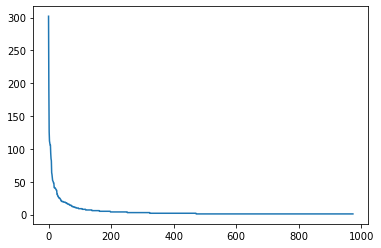

In [15]:
#Creating a figure and axis lets us do things like change the scaling or add a title
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
plt.show()

This shows that likelihood of a word occurring is inversely proportional to its rank. This effect is called [Zipf's Law](https://en.wikipedia.org/wiki/Zipf%27s_law), and suggests that the most frequent word will occur approximately twice as often as the second most frequent word, three times as often as the third most frequent word, etc. Zipf's law is most easily observed by plotting the data on a log-log graph, with the axes being log (rank order) and log (frequency) resulting in a linear relationship.

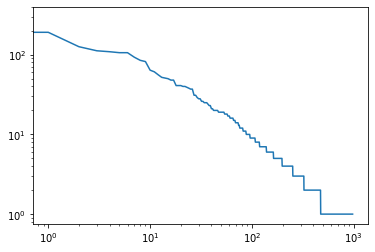

In [16]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(countedWords)), countedWords['count'])
ax.set_yscale('log')
ax.set_xscale('log')
plt.show()

(The same relationship occurs in many other rankings, such as population ranks of cities, corporation sizes, income rankings, etc.) 

The distribution was imagined by Zipf to be driven by a principle of 'least effort' where speakers did not work any harder than necessary to communicate a given idea, but the basis for this relationship is still not well understood and conforms at least as well to a process of [preferential attachment](https://en.wikipedia.org/wiki/Preferential_attachment) whereby people disproportionately attend to popular words.


# Getting and working with raw text

First, we will retrieve a collection of press releases from a *GitHub API* that archived them, based on a number of analyses by Justin Grimmer, a political scientist whose work we will read in two weeks!

GitHub API requests are made to `'https://api.github.com/'` and responses are in JSON, similar to Tumblr's API.

We will get the information on [github.com/lintool/GrimmerSenatePressReleases](https://github.com/lintool/GrimmerSenatePressReleases) as it contains a nice set documents.

In [17]:
r = requests.get('https://api.github.com/repos/lintool/GrimmerSenatePressReleases')
senateReleasesData = json.loads(r.text)
print(senateReleasesData.keys())
print(senateReleasesData['description'])

dict_keys(['id', 'node_id', 'name', 'full_name', 'private', 'owner', 'html_url', 'description', 'fork', 'url', 'forks_url', 'keys_url', 'collaborators_url', 'teams_url', 'hooks_url', 'issue_events_url', 'events_url', 'assignees_url', 'branches_url', 'tags_url', 'blobs_url', 'git_tags_url', 'git_refs_url', 'trees_url', 'statuses_url', 'languages_url', 'stargazers_url', 'contributors_url', 'subscribers_url', 'subscription_url', 'commits_url', 'git_commits_url', 'comments_url', 'issue_comment_url', 'contents_url', 'compare_url', 'merges_url', 'archive_url', 'downloads_url', 'issues_url', 'pulls_url', 'milestones_url', 'notifications_url', 'labels_url', 'releases_url', 'deployments_url', 'created_at', 'updated_at', 'pushed_at', 'git_url', 'ssh_url', 'clone_url', 'svn_url', 'homepage', 'size', 'stargazers_count', 'watchers_count', 'language', 'has_issues', 'has_projects', 'has_downloads', 'has_wiki', 'has_pages', 'forks_count', 'mirror_url', 'archived', 'disabled', 'open_issues_count', 'lic

What we are interested in here is the `'contents_url'`

In [18]:
print(senateReleasesData['contents_url'])

https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/{+path}


We can use this to get any or all of the files from the repo.

In [19]:
r = requests.get('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse')
whitehouseLinks = json.loads(r.text)
whitehouseLinks[0]

{'name': '10Apr2007Whitehouse123.txt',
 'path': 'raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'sha': 'f524289ee563dca58690c8d36c23dce5dbd9962a',
 'size': 2206,
 'url': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse/10Apr2007Whitehouse123.txt?ref=master',
 'html_url': 'https://github.com/lintool/GrimmerSenatePressReleases/blob/master/raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'git_url': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/git/blobs/f524289ee563dca58690c8d36c23dce5dbd9962a',
 'download_url': 'https://raw.githubusercontent.com/lintool/GrimmerSenatePressReleases/master/raw/Whitehouse/10Apr2007Whitehouse123.txt',
 'type': 'file',
 '_links': {'self': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse/10Apr2007Whitehouse123.txt?ref=master',
  'git': 'https://api.github.com/repos/lintool/GrimmerSenatePressReleases/git/blobs/f524289ee563dca58690c8d36c23dce5dbd9962a',
  'html': 'https:/

Now we have a list of information about Whitehouse press releases. Let's look at one of them.

In [20]:
r = requests.get(whitehouseLinks[0]['download_url'])
whitehouseRelease = r.text
print(whitehouseRelease[:1000])
len(whitehouseRelease)

SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY IN PUSH FOR STEM CELL RESEARCH
  Sharing the story of Lila Barber, a 12 year old girl from Westerly, Sen. Sheldon Whitehouse (D-R.I.) on Tuesday, April 10, 2007, illustrated the hope stem cell research can offer in a speech on the Senate floor in favor of legislation to expand federal funding for stem cell research.  
   Whitehouse met Lila two weeks ago. She was diagnosed two years ago with osteosarcoma, a cancerous bone condition, and last year underwent cadaver bone transplant surgery. The procedure saved her leg and is helping her remain cancer-free, but the transplanted tissue will not grow with her and likely will break down over time. Stem cell research, Whitehouse explained, could vastly improve the care of patients like Lila by allowing surgeons to enhance transplants with a patient's own stem cells, which could replace the lost bone and cartilage, or grow entirely new replacement bones and joints. 
   "Stem cell research gives hope

2206

Now we have a string of correctly encoded text. For analysis of its words, next we need to tokenize it, or split it into a sequence of tokens or word instances.

In [21]:
whTokens = word_tokenize(whitehouseRelease)
whTokens[10:30]

['STEM',
 'CELL',
 'RESEARCH',
 'Sharing',
 'the',
 'story',
 'of',
 'Lila',
 'Barber',
 'a',
 '12',
 'year',
 'old',
 'girl',
 'from',
 'Westerly',
 'Sen.',
 'Sheldon',
 'Whitehouse',
 'D']

Previous iterations of the course used `nltk`s tokenizer, but as we saw before, we used spaCy's model (https://spacy.io/api/tokenizer). We intend to avoid using NLTK when we can - for production level code, it is a lot faster and cleaner to use spaCy.

That being said, `nltk` does have some useful methods for quick analysis of small corpora. We will explore a few here, and encourage you to figure out for yourself which other ones might be useful.

To use the list of tokens in `nltk`, and take advantage of functions like `concordance`, shown above, we can convert it into a `Text`.

In [22]:
import nltk

In [23]:
whText = nltk.Text(whTokens)

whitehouseIndex = nltk.text.ConcordanceIndex(whText) 
whitehouseIndex.print_concordance('Whitehouse')

Displaying 5 of 5 matches:
ld girl from Westerly Sen. Sheldon Whitehouse D R.I. on Tuesday April 10 2007 il
ral funding for stem cell research Whitehouse met Lila two weeks ago She was dia
 down over time Stem cell research Whitehouse explained could vastly improve the
s research might help or even cure Whitehouse said Whitehouse also praised the e
 help or even cure Whitehouse said Whitehouse also praised the efforts of Rhode 


*Note* that the `Text` class is for doing rapid, exploratory analysis. It provides an easy interface to many of the operations we want to do, but it does not allow us much control over the particular operations it glosses. When you are doing a more complete analysis, you should be using the module specifically designed for that task instead of the shortcut method `Text` provides, e.g. use  [`collocations` Module](http://www.nltk.org/api/nltk.html#module-nltk.collocations) instead of `.collocations()`.

Now that we have gotten this loaded, let's glance at few features we will delve into more deeply later.

For example, we can find words that statistically tend to occur together and typically have a composite, idiomatic meaning irreducible to the semantics of its component words. We will do this later with more control over exactly how these are identified.

Or we can pick a word (or words) and find what words tend to occur around it.

In [24]:
whText.common_contexts(['stem'])

for_cell on_cells the_cell hope_cell time_cell own_cells joints_cell
of_cell embryonic_cells


We can also just count the number of times the word occurs.

In [25]:
whText.count('cell')

5


We can also plot each time a set of words occurs.

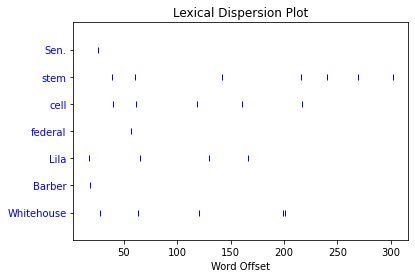

In [26]:
sns.reset_orig() #Seaborn messes with this plot, disabling it
whText.dispersion_plot(['Sen.','stem', 'cell', 'federal' ,'Lila', 'Barber', 'Whitehouse'])
sns.set() #Re-enabling seaborn

If we want to do an analysis of all the Whitehouse press releases we will first need to obtain them. By looking at the API we can see the the URL we want is [https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse](https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse), so we can create a function to scrape the individual files.

If you want to know more about downloading from APIs, refer back to the 1st notebook.

In [27]:
def getGithubFiles(target, maxFiles = 100):
    #We are setting a max so our examples don't take too long to run
    #For converting to a DataFrame
    releasesDict = {
        'name' : [], #The name of the file
        'text' : [], #The text of the file, watch out for binary files
        'path' : [], #The path in the git repo to the file
        'html_url' : [], #The url to see the file on Github
        'download_url' : [], #The url to download the file
    }

    #Get the directory information from Github
    r = requests.get(target)
    filesLst = json.loads(r.text)

    for fileDict in filesLst[:maxFiles]:
        #These are provided by the directory
        releasesDict['name'].append(fileDict['name'])
        releasesDict['path'].append(fileDict['path'])
        releasesDict['html_url'].append(fileDict['html_url'])
        releasesDict['download_url'].append(fileDict['download_url'])

        #We need to download the text though
        text = requests.get(fileDict['download_url']).text
        releasesDict['text'].append(text)

    return pandas.DataFrame(releasesDict)

whReleases = getGithubFiles('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Whitehouse', maxFiles = 10)
whReleases[:5]

,name,text,path,html_url,download_url
0,10Apr2007Whitehouse123.txt,SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY I...,raw/Whitehouse/10Apr2007Whitehouse123.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
1,10Apr2008Whitehouse2.txt,SEN. WHITEHOUSE SAYS PRESIDENT BUSH MUST BEGIN...,raw/Whitehouse/10Apr2008Whitehouse2.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
2,10Apr2008Whitehouse3.txt,EPA MUST REVIEW LEGAL PROCESS TO ROOT OUT POLI...,raw/Whitehouse/10Apr2008Whitehouse3.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
3,10Aug2007Whitehouse78.txt,R.I. SENATORS PRAISE SEN. DENIAL OF LNG FACILI...,raw/Whitehouse/10Aug2007Whitehouse78.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
4,10Jan2008Whitehouse35.txt,SEN. WHITEHOUSE COMMENTS ON ONE-YEAR ANNIVERSA...,raw/Whitehouse/10Jan2008Whitehouse35.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...


If you are having trouble downloading the data uncomment this next cell

In [28]:
#whReleases = pandas.read_csv('../data/whReleases.csv')

Now we have all the texts in a DataFrame we can look at a few things.

First let's tokenize the texts with the same tokenizer as we used before. We will just save the tokens as a list for now; no need to convert to `Text`s.

In [29]:
whReleases['tokenized_text'] = whReleases['text'].apply(lambda x: word_tokenize(x))

Now lets see how long each of the press releases is:

In [30]:
whReleases['word_counts'] = whReleases['tokenized_text'].apply(lambda x: len(x))
whReleases['word_counts']

0    350
1    311
2    497
3    189
4    236
5    334
6    241
7    469
8    443
9    425
Name: word_counts, dtype: int64

## <span style="color:red">*Exercise 1*</span>

<span style="color:red">Construct cells immediately below this that input and interrogate a corpus relating to your anticipated final project. This could include one of the Davies corpora or some other you have constructed. Turn your text into an nltk `Text` object, and explore all of the features examined above, and others that relate to better understanding your corpus in relation to your research question. </span>

In [33]:
df = pd.read_pickle('Corpus_mda/tsla_mda.pkl')

In [34]:
df['mda'] = df['mda'].apply(lambda x: x.replace('\n\n', ' '))

In [35]:
word_tokenize(df.iloc[-1,-1])

['ITEM',
 '7',
 'MANAGEMENT',
 '’S',
 'DISCUSSION',
 'AND',
 'ANALYSIS',
 'OF',
 'FINANCIAL',
 'CONDITION',
 'AND',
 'RESULTS',
 'OF',
 'OPERATIONS',
 'THE',
 'FOLLOWING',
 'DISCUSSION',
 'AND',
 'ANALYSIS',
 'SHOULD',
 'BE',
 'READ',
 'IN',
 'CONJUNCTION',
 'WITH',
 'THE',
 'CONSOLIDATED',
 'FINANCIAL',
 'STATEMENTS',
 'AND',
 'THE',
 'RELATED',
 'NOTES',
 'INCLUDED',
 'ELSEWHERE',
 'IN',
 'THIS',
 'ANNUAL',
 'REPORT',
 'ON',
 'FORM',
 '10-K.',
 'FOR',
 'DISCUSSION',
 'RELATED',
 'TO',
 'CHANGES',
 'IN',
 'FINANCIAL',
 'CONDITION',
 'AND',
 'THE',
 'RESULTS',
 'OF',
 'OPERATIONS',
 'FOR',
 'FISCAL',
 'YEAR',
 '2017-RELATED',
 'ITEMS',
 'REFER',
 'TO',
 'PART',
 'II',
 'ITEM',
 '7',
 'MANAGEMENT',
 "'S",
 'DISCUSSION',
 'AND',
 'ANALYSIS',
 'OF',
 'FINANCIAL',
 'CONDITION',
 'AND',
 'RESULTS',
 'OF',
 'OPERATIONS',
 'IN',
 'OUR',
 'ANNUAL',
 'REPORT',
 'ON',
 'FORM',
 '10-K',
 'FOR',
 'FISCAL',
 'YEAR',
 '2018',
 'WHICH',
 'WAS',
 'FILED',
 'WITH',
 'THE',
 'SECURITIES',
 'AND',
 'EXCH

In [36]:
count_tsla_20 = wordCounter(word_tokenize(df.iloc[-1,-1]))

In [37]:
count_tsla_20.sort_values('count', ascending=False, inplace=True)
count_tsla_20[:50]

,word,count
12,the,696
5,and,499
7,of,459
33,to,395
17,in,292
43,our,235
64,we,198
609,$,190
120,as,164
137,a,160


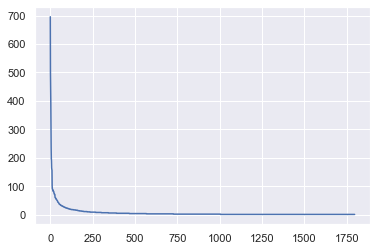

In [38]:
fig = plt.figure()
ax = fig.add_subplot(111)
plt.plot(range(len(count_tsla_20)), count_tsla_20['count'])
plt.show()

In [39]:
tokens = word_tokenize(df.iloc[-1,-1])
nltktext = nltk.Text(tokens)

In [40]:
nltkindex = nltk.text.ConcordanceIndex(nltktext)

In [41]:
nltkindex.print_concordance('ENERGY', width = 100)

Displaying 25 of 82 matches:
ELERATE THE WORLD ’S TRANSITION TO SUSTAINABLE ENERGY WE DESIGN DEVELOP MANUFACTURE LEASE AND SELL H
HIGH PERFORMANCE FULLY ELECTRIC VEHICLES SOLAR ENERGY GENERATION SYSTEMS AND ENERGY STORAGE PRODUCTS
C VEHICLES SOLAR ENERGY GENERATION SYSTEMS AND ENERGY STORAGE PRODUCTS WE ALSO OFFER MAINTENANCE INS
F A UNIQUE SET OF IN CAR ENTERTAINMENT OPTIONS ENERGY GENERATION AND STORAGE WE REVAMPED KEY ASPECTS
 HALF OF THE YEAR WE ALSO DEPLOYED 1.65 GWH OF ENERGY STORAGE IN 2019 MORE THAN THE AGGREGATE OF ALL
ILITIES AND MEGAPACK OUR LARGEST UTILITY SCALE ENERGY STORAGE PRODUCT TO DATE MANAGEMENT OPPORTUNITI
OUR SERVICING CAPABILITIES AND PARTS INVENTORY ENERGY GENERATION AND STORAGE DEMAND PRODUCTION AND D
 NOW OFFER AN EVEN GREATER VARIETY OF SCALABLE ENERGY STORAGE PRODUCTS WITH A WIDE RANGE OF MARKETS 
DATED BALANCE SHEETS TO USED VEHICLE INVENTORY ENERGY GENERATION AND STORAGE SEGMENT ENERGY GENERATI
NVENTORY ENERGY GENERATION AND STORAGE SEGMENT ENERGY GENERATI

In [42]:
nltktext.common_contexts(['ENERGY'])

solar_systems and_storage solar_system for_storage the_generation
solar_generation of_storage inventory_generation segment_generation
for_generation of_generation sustainable_we options_generation
scale_storage scalable_storage sales_generation 842_generation
historical_generation the_storage minimum_generation


In [43]:
nltkindex.print_concordance('AUTOMOTIVE')

Displaying 25 of 83 matches:
R SERVICES RELATED TO OUR PRODUCTS AUTOMOTIVE DURING 2019 WE ACHIEVED ANNUAL VEH
LLENGES AND RISKS AND 2020 OUTLOOK AUTOMOTIVE PRODUCTION A KEY FOCUS IN 2020 WIL
ATES THAT WE HAVE PLANNED FOR THEM AUTOMOTIVE DEMAND AND SALES AS THE AUTOMOTIVE
AUTOMOTIVE DEMAND AND SALES AS THE AUTOMOTIVE INDUSTRY CONTINUES TO VALIDATE AND
EDICTABLE SALES OF VEHICLES IN THE AUTOMOTIVE INDUSTRY ALSO TEND TO BE CYCLICAL 
S OUR GROSS PROFITS MAY BE REDUCED AUTOMOTIVE DELIVERIES AND CUSTOMER INFRASTRUC
N THIS ANNUAL REPORT ON FORM 10-K. AUTOMOTIVE SEGMENT AUTOMOTIVE SALES REVENUE A
T ON FORM 10-K. AUTOMOTIVE SEGMENT AUTOMOTIVE SALES REVENUE AUTOMOTIVE SALES WIT
E SEGMENT AUTOMOTIVE SALES REVENUE AUTOMOTIVE SALES WITHOUT RESALE VALUE GUARANT
LES WITHOUT RESALE VALUE GUARANTEE AUTOMOTIVE SALES REVENUE INCLUDES REVENUES RE
RE UPDATES WE RECOGNIZE REVENUE ON AUTOMOTIVE SALES UPON DELIVERY TO THE CUSTOME
MER FOR OUR OBLIGATIONS RELATED TO AUTOMOTIVE SALES WE ESTIMATE STANDALONE SELLI

In [44]:
nltkindex.print_concordance('BATTERY')

Displaying 3 of 3 matches:
MBER SUBJECT TO LOCAL PRODUCTION OF BATTERY PACKS WHICH WE BEGAN RAMPING THERE 
GY OF USING PARTNERS TO MANUFACTURE BATTERY CELLS AS WELL AS CONSIDERING ALL OT
Y OF USING A PARTNER TO MANUFACTURE BATTERY CELLS AS WELL AS CONSIDERING ALL OT


In [45]:
nltkindex.print_concordance('GASOLINE')

no matches


In [46]:
df.iloc[-1,-1]

"ITEM 7. MANAGEMENT’S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RESULTS OF OPERATIONS THE FOLLOWING DISCUSSION AND ANALYSIS SHOULD BE READ IN CONJUNCTION WITH THE CONSOLIDATED FINANCIAL STATEMENTS AND THE RELATED NOTES INCLUDED ELSEWHERE IN THIS ANNUAL REPORT ON FORM 10-K. FOR DISCUSSION RELATED TO CHANGES IN FINANCIAL CONDITION AND THE RESULTS OF OPERATIONS FOR FISCAL YEAR 2017-RELATED ITEMS, REFER TO PART II, ITEM 7. MANAGEMENT'S DISCUSSION AND ANALYSIS OF FINANCIAL CONDITION AND RESULTS OF OPERATIONS IN OUR ANNUAL REPORT ON FORM 10-K FOR FISCAL YEAR 2018, WHICH WAS FILED WITH THE SECURITIES AND EXCHANGE COMMISSION ON FEBRUARY 19, 2019. OVERVIEW AND 2019 HIGHLIGHTS OUR MISSION IS TO ACCELERATE THE WORLD’S TRANSITION TO SUSTAINABLE ENERGY. WE DESIGN, DEVELOP, MANUFACTURE, LEASE AND SELL HIGH-PERFORMANCE FULLY ELECTRIC VEHICLES, SOLAR ENERGY GENERATION SYSTEMS AND ENERGY STORAGE PRODUCTS. WE ALSO OFFER MAINTENANCE, INSTALLATION, OPERATION AND OTHER SERVICES RELATED TO OUR PROD

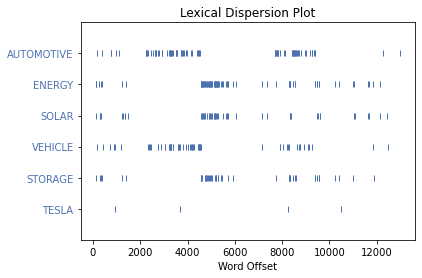

In [47]:
sns.reset_orig() 
nltktext.dispersion_plot(['AUTOMOTIVE','ENERGY', 'SOLAR', 'VEHICLE' ,'STORAGE', 'TESLA'])
sns.set()

In [48]:
api_text = getGithubFiles('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Biden', maxFiles = 10)
api_text[:5]

,name,text,path,html_url,download_url
0,01Aug2005Biden6.txt,"\n \tBiden ""Deeply Disappointed"" in...",raw/Biden/01Aug2005Biden6.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
1,01Aug2006Biden17.txt,\n \tSenator Biden is Interviewed o...,raw/Biden/01Aug2006Biden17.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
2,01Aug2007Biden1.txt,\n \tBIDEN/LUGAR Resolution Calling...,raw/Biden/01Aug2007Biden1.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
3,01Feb2007Biden3.txt,\n \tSen. Biden Speaks Out on Senat...,raw/Biden/01Feb2007Biden3.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
4,01Jan2006Biden1.txt,\n \tNo President is Above Our Cons...,raw/Biden/01Jan2006Biden1.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...


In [49]:
api_text['tokenized_text'] = api_text['text'].apply(lambda x: word_tokenize(x))

In [50]:
api_text['word_counts'] = api_text['tokenized_text'].apply(lambda x: len(x))
api_text['word_counts']

0     463
1     898
2     467
3    1711
4     751
5     734
6     112
7     309
8     222
9     279
Name: word_counts, dtype: int64

In [51]:
df['tokenized_text'] = df['mda'].apply(lambda x: word_tokenize(x))

In [52]:
df['word_counts'] = df['tokenized_text'].apply(lambda x: len(x))
df['word_counts']

0    18215
0    17739
0    16237
0    15230
0     9873
0     9546
0    12928
0    12868
0    17393
0    13193
Name: word_counts, dtype: int64

# Filtering and normalizing text

As we want to start comparing the different releases we may choose to do a bit of filtering and normalizing that will allow us to focus on what we most care about. We can first make all of the words lower case, then drop the non-word tokens. Next, we can remove some 'stop words', stem the remaining words to remove suffixes, prefixes and (in some languages) infixes, or lemmatize tokens by intelligently grouping inflected or variant forms of the same word (e.g., with a stemmer and a dictionary). 

To begin this process, we will first define a function to work over the tokenized lists, then another to add normalized tokens to a new column.

We will be using spaCy's built in stop words identifying capacity. When we run text through spaCy's language pipeline, it automatically tags it as a stop word. 

We can remove these stopwords from the analysis by fiat, but we could also take a more principled approach by looking at the frequency distribution of words and selecting a specific cut-off associated with the preservation of 'meaningful words' identified upon inspection. Alternatively, we could automatically set a cut-off by rule, such as removal of all words more frequent then the most frequent verb, or the most frequent noun (not pronoun), or some term of central interest. 

In [53]:
countsDict = {}
for word in whReleases['tokenized_text'].sum():
    if word in countsDict:
        countsDict[word] += 1
    else:
        countsDict[word] = 1
word_counts = sorted(countsDict.items(), key = lambda x : x[1], reverse = True)
word_counts[:20]

[('the', 179),
 ('of', 112),
 ('to', 112),
 ('and', 108),
 ('in', 64),
 ('a', 61),
 ("'s", 50),
 ('that', 41),
 ('our', 39),
 ('for', 35),
 ('on', 33),
 ('is', 33),
 ('Whitehouse', 31),
 ('Iraq', 28),
 ('Bush', 27),
 ('President', 25),
 ('troops', 21),
 ('by', 19),
 ('American', 19),
 ('with', 18)]

We can look at this and pick the cutoff, often at the first noun. So we will cut all words before `'Whitehouse'`.

In [54]:
#The stop list is then all words that occur before the first noun
stop_words_freq = []
for word, count in word_counts:
    if word == 'Whitehouse':
        break
    else:
        stop_words_freq.append(word)
stop_words_freq

['the', 'of', 'to', 'and', 'in', 'a', "'s", 'that', 'our', 'for', 'on', 'is']

If we did have any extra words to add as stop words apart from those normally considered as stop words, we would add it to our stop words by passing it to the normalize tokens method. 

Now we can create our function to normalize the tokens

In [55]:
def normalizeTokens(word_list, extra_stop=[]):
    #We can use a generator here as we just need to iterate over it
    normalized = []
    if type(word_list) == list and len(word_list) == 1:
        word_list = word_list[0]

    if type(word_list) == list:
        word_list = ' '.join([str(elem) for elem in word_list]) 

    doc = nlp(word_list.lower())
    
    # add the property of stop word to words considered as stop words
    if len(extra_stop) > 0:
        for stopword in extra_stop:
            lexeme = nlp.vocab[stopword]
            lexeme.is_stop = True

    for w in doc:
        # if it's not a stop word or punctuation mark, add it to our article
        if w.text != '\n' and not w.is_stop and not w.is_punct and not w.like_num and len(w.text.strip()) > 0:
            # we add the lematized version of the word
            normalized.append(str(w.lemma_))

    return normalized

In [56]:
whReleases['normalized_tokens'] = whReleases['tokenized_text'].apply(lambda x: normalizeTokens(x))

whReleases['normalized_tokens_count'] = whReleases['normalized_tokens'].apply(lambda x: len(x))

whReleases

,name,text,path,html_url,download_url,tokenized_text,word_counts,normalized_tokens,normalized_tokens_count
0,10Apr2007Whitehouse123.txt,SEN. WHITEHOUSE SHARES WESTERLY GIRL'S STORY I...,raw/Whitehouse/10Apr2007Whitehouse123.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, SHARES, WESTERLY, GIRL, 'S, ...",350,"[sen, whitehouse, share, westerly, girl, story...",224
1,10Apr2008Whitehouse2.txt,SEN. WHITEHOUSE SAYS PRESIDENT BUSH MUST BEGIN...,raw/Whitehouse/10Apr2008Whitehouse2.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, SAYS, PRESIDENT, BUSH, MUST,...",311,"[sen, whitehouse, say, president, bush, begin,...",159
2,10Apr2008Whitehouse3.txt,EPA MUST REVIEW LEGAL PROCESS TO ROOT OUT POLI...,raw/Whitehouse/10Apr2008Whitehouse3.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[EPA, MUST, REVIEW, LEGAL, PROCESS, TO, ROOT, ...",497,"[epa, review, legal, process, root, political,...",298
3,10Aug2007Whitehouse78.txt,R.I. SENATORS PRAISE SEN. DENIAL OF LNG FACILI...,raw/Whitehouse/10Aug2007Whitehouse78.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[R.I., SENATORS, PRAISE, SEN, DENIAL, OF, LNG,...",189,"[r.i, senator, praise, sen, denial, lng, facil...",116
4,10Jan2008Whitehouse35.txt,SEN. WHITEHOUSE COMMENTS ON ONE-YEAR ANNIVERSA...,raw/Whitehouse/10Jan2008Whitehouse35.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, COMMENTS, ON, ONE, YEAR, ANN...",236,"[sen, whitehouse, comment, year, anniversary, ...",125
5,10Mar2008Whitehouse8.txt,"SENS. REED, WHITEHOUSE WELCOME RHODE ISLAND ST...",raw/Whitehouse/10Mar2008Whitehouse8.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SENS, REED, WHITEHOUSE, WELCOME, RHODE, ISLAN...",334,"[sen, reed, whitehouse, welcome, rhode, island...",197
6,10Sep2007Whitehouse72.txt,REP. WHITEHOUSE ISSUES STATEMENT ON GEN. PETRA...,raw/Whitehouse/10Sep2007Whitehouse72.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[REP, WHITEHOUSE, ISSUES, STATEMENT, ON, GEN, ...",241,"[rep, whitehouse, issue, statement, gen, petra...",118
7,11Apr2007Whitehouse122.txt,SEN. WHITEHOUSE URGES BUSH FOR NEW DIRECTION I...,raw/Whitehouse/11Apr2007Whitehouse122.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SEN, WHITEHOUSE, URGES, BUSH, FOR, NEW, DIREC...",469,"[sen, whitehouse, urge, bush, new, direction, ...",249
8,11Jan2007Whitehouse161.txt,"SENS. REED, WHITEHOUSE URGE PORTUGAL TO RECONS...",raw/Whitehouse/11Jan2007Whitehouse161.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[SENS, REED, WHITEHOUSE, URGE, PORTUGAL, TO, R...",443,"[sen, reed, whitehouse, urge, portugal, recons...",237
9,11Mar2008Whitehouse7.txt,WHITEHOUSE UNVEILS 'BUSH DEBT': $7.7 TRILLION ...,raw/Whitehouse/11Mar2008Whitehouse7.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...,"[WHITEHOUSE, UNVEILS, BUSH, DEBT, $, 7.7, TRIL...",425,"[whitehouse, unveils, bush, debt, $, foregone,...",241


You can see that in the final step of normalizing, we add the lemmatized form of the word. spaCy's built in lemmatizer does this (https://spacy.io/api/lemmatizer). Lemmatization can be thought of as finding the root or the base of the word after removing inflections and other variations of words. Another possible way of finding the roots of words is using NLTK's porting or stemming functionalities, but we will not be getting into them.

Now that it is cleaned we start analyzing the dataset. We can start by finding frequency distributions for the dataset. Lets start looking at all the press releases together. The [`ConditionalFreqDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ConditionalProbDist) class reads in an iterable of tuples, the first element is the condition and the second the focal word. For starters, we will use word lengths as the conditions, but tags or clusters will provide more useful results.

In [57]:
#.sum() adds together the lists from each row into a single list
whcfdist = nltk.ConditionalFreqDist(((len(w), w) for w in whReleases['normalized_tokens'].sum()))

#print the number of words
print(whcfdist.N())

1964


From this we can lookup the distributions of different word lengths

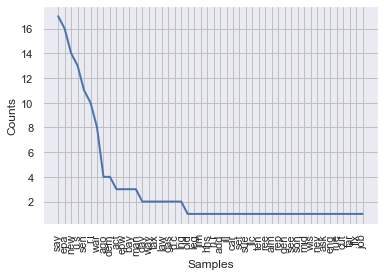

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [58]:
whcfdist[3].plot()

We can also create a Conditional Probability Distribution or [`ConditionalProbDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ConditionalProbDist) from the `ConditionalFreqDist`. To do this, however, we need a model for the probability distribution. A simple model is [`ELEProbDist`](http://www.nltk.org/api/nltk.html#nltk.probability.ELEProbDist) which gives the expected likelihood estimate for the probability distribution of the experiment used to generate the observed frequency distribution. 

In [59]:
whcpdist = nltk.ConditionalProbDist(whcfdist, nltk.ELEProbDist)

#print the most common 2 letter word
print(whcpdist[2].max())

#And its probability
print(whcpdist[2].prob(whcpdist[2].max()))

ri
0.25


Length is one feature of a word, but there are many more important features we care about. Another critical feature is a word's role in the sentence, or its part of speech (POS). 

The method below works similarly to ```nltk.pos_text```, and can work with the conditional frequency distributions it provides.

In [60]:
def spacy_pos(word_list):
    tags = []
    doc = nlp(word_list.lower())
    for w in doc:
        tags.append((w.text, w.tag_))
    return tags

In [61]:
whReleases['normalized_tokens_POS'] = [spacy_pos(t) for t in whReleases['text']]

This gives us a new column with the part of speech as a short initialism and the word in a tuple, exactly how the `nltk.ConditionalFreqDist()` function wants them. We can now construct another conditional frequency distribution.

In [62]:
whcfdist_WordtoPOS = nltk.ConditionalFreqDist(whReleases['normalized_tokens_POS'].sum())
list(whcfdist_WordtoPOS.items())[:10]

[('sen', FreqDist({'NNP': 9})),
 ('.', FreqDist({'.': 125, 'NNP': 41})),
 ('whitehouse', FreqDist({'NN': 19, 'NNP': 12, 'VB': 8, 'VBP': 1})),
 ('shares', FreqDist({'NNS': 1})),
 ('westerly', FreqDist({'NNP': 2})),
 ('girl', FreqDist({'NN': 2})),
 ("'s", FreqDist({'POS': 47, 'VBZ': 5})),
 ('story', FreqDist({'NN': 2})),
 ('in', FreqDist({'IN': 72})),
 ('push', FreqDist({'NN': 1}))]

This gives the frequency of each word as each part of speech...which can be uninformative and boring. What we want is the converse; the frequency of each part of speech for each word.

In [63]:
whcfdist_POStoWord = nltk.ConditionalFreqDist((p, w) for w, p in whReleases['normalized_tokens_POS'].sum())

We can now identify and collect all of the superlative adjectives

In [64]:
whcfdist_POStoWord['JJ']

FreqDist({'american': 17, 'new': 10, 'portuguese': 9, 'political': 8, 'federal': 6, 'clear': 5, 'potential': 5, 'fiscal': 5, 'last': 4, 'several': 4, ...})

Or look at the most common nouns

In [65]:
whcfdist_POStoWord['NN'].most_common(5)

[('whitehouse', 19),
 ('today', 15),
 ('stem', 12),
 ('year', 12),
 ('administration', 11)]

Or plot the base form verbs against their number of occurrences

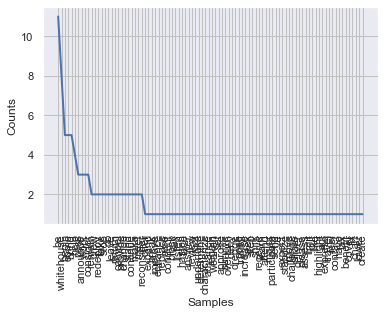

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [66]:
whcfdist_POStoWord['VB'].plot()

We can then do a similar analysis of the word probabilities

In [67]:
whcpdist_POStoWord = nltk.ConditionalProbDist(whcfdist_POStoWord, nltk.ELEProbDist)

#print the most common nouns
print(whcpdist_POStoWord['NN'].max())

#And its probability
print(whcpdist_POStoWord['NN'].prob(whcpdist_POStoWord['NN'].max()))

whitehouse
0.025390625


We can even create a...wait for it...*WORD CLOUD* or Wordl to gaze at and draw mystical, approximate inferences about important nouns and verbs in our corpus:

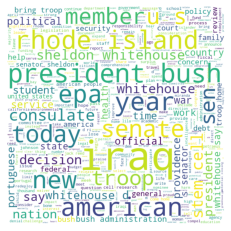

In [68]:
wc = wordcloud.WordCloud(background_color="white", max_words=500, width= 1000, height = 1000, mode ='RGBA', scale=.5).generate(' '.join(whReleases['normalized_tokens'].sum()))
plt.imshow(wc)
plt.axis("off")
plt.savefig("whitehouse_word_cloud.pdf", format = 'pdf')

## <span style="color:red">*Exercise 2*</span>

<span style="color:red">Construct cells immediately below this that filter, stem and lemmatize the tokens in your corpus, and then creates plots (with titles and labels) that map the word frequency distribution, word probability distribution, and at least two conditional probability distributions that help us better understand the social and cultural game underlying the production of your corpus. Create a wordl of words (or normalized words) and add a few vague comments about what mysteries are revealed through it.</span>

In [69]:
countsDict = {}
for word in df['tokenized_text'].sum():
    if word in countsDict:
        countsDict[word] += 1
    else:
        countsDict[word] = 1
word_counts = sorted(countsDict.items(), key = lambda x : x[1], reverse = True)

In [70]:
stop_words_freq = []
for word, count in word_counts:
    if word == 'MODEL':
        break
    else:
        stop_words_freq.append(word)
stop_words_freq

['THE',
 'OF',
 'AND',
 'TO',
 'IN',
 'OUR',
 'WE',
 '$',
 'FOR',
 'A',
 'AS',
 'MILLION',
 'DECEMBER',
 '31',
 'FROM',
 'YEAR',
 'ON',
 'ENDED',
 'ARE']

In [71]:
df['normalized_tokens'] = df['tokenized_text'].apply(lambda x: normalizeTokens(x, ['year', 'end', 'december', 'include']))
df['normalized_tokens_count'] = df['normalized_tokens'].apply(lambda x: len(x))

In [72]:
conditional_freq_dis = nltk.ConditionalFreqDist(((len(w), w) for w in df['normalized_tokens'].sum()))
print(conditional_freq_dis.N())

72969


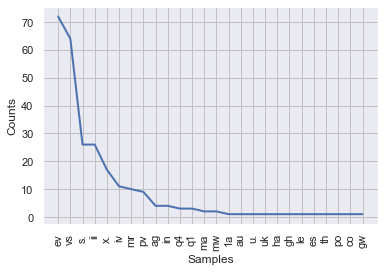

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [73]:
conditional_freq_dis[2].plot()

In [74]:
conditional_prob_dis = nltk.ConditionalProbDist(conditional_freq_dis, nltk.ELEProbDist)
print(conditional_prob_dis[2].max())
print(conditional_prob_dis[2].prob(conditional_prob_dis[2].max()))

ev
0.2607913669064748


In [75]:
df['normalized_tokens_POS'] = [spacy_pos(t) for t in df['mda']]

In [76]:
# POS parsing of the texts
freq_dis_pos = nltk.ConditionalFreqDist(df['normalized_tokens_POS'].sum())
list(freq_dis_pos.items())[:20]

[('item', FreqDist({'NN': 19, 'NNP': 11})),
 ('7', FreqDist({'CD': 17})),
 ('.', FreqDist({'.': 4233, 'NNP': 84, 'NN': 2})),
 ('management', FreqDist({'NN': 65})),
 ('’s', FreqDist({'POS': 117, 'NN': 2, 'NNP': 1})),
 ('discussion', FreqDist({'NN': 29})),
 ('and', FreqDist({'CC': 5094})),
 ('analysis', FreqDist({'NN': 44})),
 ('of', FreqDist({'IN': 5698})),
 ('financial', FreqDist({'JJ': 235, 'NNP': 2})),
 ('condition', FreqDist({'NN': 52})),
 ('results', FreqDist({'NNS': 111, 'VBZ': 2})),
 ('operations', FreqDist({'NNS': 187})),
 ('the', FreqDist({'DT': 7676})),
 ('following', FreqDist({'VBG': 77, 'NN': 11, 'JJ': 4})),
 ('should', FreqDist({'MD': 83})),
 ('be', FreqDist({'VB': 513})),
 ('read', FreqDist({'VBN': 10})),
 ('in', FreqDist({'IN': 3517, 'NN': 10, 'RP': 9, 'RB': 3})),
 ('conjunction', FreqDist({'NN': 12}))]

In [77]:
# Find adjectives that are often used
freq_dis_word = nltk.ConditionalFreqDist((p, w) for w, p in df['normalized_tokens_POS'].sum())
freq_dis_word['JJ']

FreqDist({'automotive': 482, 'other': 461, 'net': 319, 'such': 304, 'significant': 241, 'consolidated': 237, 'financial': 235, 'tesla': 222, 'fair': 221, 'future': 214, ...})

In [78]:
# 10 most common nouns
freq_dis_word['NN'].most_common(10)

[('year', 941),
 ('%', 720),
 ('revenue', 671),
 ('model', 651),
 ('vehicle', 636),
 ('increase', 635),
 ('value', 628),
 ('cash', 601),
 ('stock', 587),
 ('development', 508)]

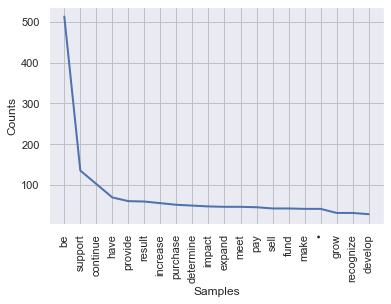

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [79]:
nltk.FreqDist(dict(freq_dis_word['VB'].most_common(20))).plot()

In [80]:
prob_dis_word = nltk.ConditionalProbDist(freq_dis_word, nltk.ELEProbDist)
print(prob_dis_word['NN'].max())
print(prob_dis_word['NN'].prob(prob_dis_word['NN'].max()))

year
0.03148776776308088


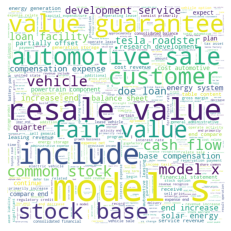

In [234]:
wc = wordcloud.WordCloud(background_color="white", max_words=500, width= 1000, height = 1000, 
                         mode ='RGBA', scale=.5).generate(' '.join(df['normalized_tokens'].sum()))
plt.imshow(wc)
plt.axis("off")
plt.savefig("TSLA_cloud.pdf", format = 'pdf')

## Davies Corpora

Now that we have our basic cleaning down, we can arrange our Davies Corpora. Let us try this with the movies corpora we have already loaded.

We'll use a smaller corpus of a 1000 movies for this demonstration.

In [81]:
zfile = zipfile.ZipFile(corpus_name + "/sources_movies.zip")
source = []

In [82]:
for file in zfile.namelist():
    with zfile.open(file) as f:
        for line in f:
            source.append(line)

In [83]:
source[0:20]

[b'textID\tfileID\t#words\tgenre\tyear\tlanguage(s)\tcountry\timdb\ttitle\r\n',
 b'-----\t-----\t-----\t-----\t-----\t-----\t-----\t-----\t-----\r\n',
 b'\r\n',
 b'290635\t3547424\t4722\tShort, Musical\t1930\tUK\tEnglish\t0290635\tGoodbye to All That\r\n',
 b'21165\t6332374\t10220\tCrime, Mystery, Thriller\t1930\tUK\tEnglish\t0021165\tMurder!\r\n',
 b'21191\t6013789\t5281\tDrama, Romance\t1930\tUSA\tEnglish\t0021191\tA Notorious Affair\r\n',
 b'20620\t3660608\t6724\tBiography, Drama, History\t1930\tUSA\tEnglish\t0020620\tAbraham Lincoln\r\n',
 b'20629\t60053\t9552\tDrama, War\t1930\tUSA\tEnglish, French, German, Latin\t0020629\tAll Quiet on the Western Front\r\n',
 b'20640\t6850720\t13862\tComedy, Musical\t1930\tUSA\tEnglish\t0020640\tAnimal Crackers\r\n',
 b'20641\t176501\t11140\tDrama, Romance\t1930\tUSA\tEnglish\t0020641\tAnna Christie\r\n',
 b'20643\t3603861\t1748\tComedy, Short\t1930\tUSA\tEnglish\t0020643\tAnother Fine Mess\r\n',
 b'20670\t4159455\t6966\tComedy, Musical\t1930\tUS

It looks dirty because the file is encoded as bytes, but we can certainly see the information there. The file id is also present in the original raw text data: as the first "word". Look back at the normalized/tokenized words to confirm that. We're going to use this to create a dataframe with: Fileid, movie name, genre, year, and country.

It is advised that you run a similar check of the source file before you do other extraction.

First, let us create a dictionary mapping file-id to all the text. Each movie will be mapped to a list of the tokenized words.

In this example, I only use it to load 100 movies. You can comment this out or increase/decrease the number as you see fit.

In [291]:
movie_texts = {}

In [292]:
for files in movie_raw:
    if len(movie_texts) > 100:
        break
    movies = clean_raw_text(movie_raw[files][1:])
    for movie in movies:
        txts = lucem_illud.word_tokenize(movie)
        try:
            movie_texts[txts[0][2:]] = txts[1:]
        except IndexError:
            continue

In [293]:
import pandas as pd

In [294]:
movie_df = pd.DataFrame(columns=["Movie Name", "Genre", "Year", "Country", "Tokenized Texts"])

In [295]:
for movie in source[3:]:
    try:
        tid, fileid, total_words, genre, year, lang, country, imdb, title = movie.decode("utf-8").split("\t")
    except UnicodeDecodeError:
        continue
    try:
        movie_df.loc[fileid.strip()] = [title.strip(), genre.strip(), year.strip(), country.strip(), movie_texts[fileid.strip()]]
    except KeyError:
        continue

In [296]:
movie_df.head()

,Movie Name,Genre,Year,Country,Tokenized Texts
6850720,Animal Crackers,"Comedy, Musical",1930,English,"[You, must, do, your, best, tonight, Be, on, y..."
176501,Anna Christie,"Drama, Romance",1930,English,"[Either, you, 're, flat, or, I, am, I, beg, yo..."
4056770,Ladies of Leisure,"Drama, Romance",1930,English,"[Look, out, There, 's, another, bottle, coming..."
5992934,Over the Hill,Drama,1931,English,"[Good, morning, kitty, Come, in, here, baby, I..."
4436137,Design for Living,"Comedy, Romance",1933,"English, French","[Train_engine_grinding, 26;1426;TOOLONG, Whist..."


# Part-of-Speech (POS) tagging

In POS tagging, we classify each word by its semantic role in a sentence. We will be using the in-built spaCy pos-tagging.

https://spacy.io/usage/linguistic-features

|#. |Tag |Description |
|---|----|------------|
|1.	|CC	|Coordinating conjunction
|2.	|CD	|Cardinal number
|3.	|DT	|Determiner
|4.	|EX	|Existential there
|5.	|FW	|Foreign word
|6.	|IN	|Preposition or subordinating conjunction
|7.	|JJ	|Adjective
|8.	|JJR|	Adjective, comparative
|9.	|JJS|	Adjective, superlative
|10.|	LS	|List item marker
|11.|	MD	|Modal
|12.|	NN	|Noun, singular or mass
|13.|	NNS	|Noun, plural
|14.|	NNP	|Proper noun, singular
|15.|	NNPS|	Proper noun, plural
|16.|	PDT	|Predeterminer
|17.|	POS	|Possessive ending
|18.|	PRP	|Personal pronoun
|19.|	PRP\$|	Possessive pronoun
|20.|	RB	|Adverb
|21.|	RBR	|Adverb, comparative
|22.|	RBS	|Adverb, superlative
|23.|	RP	|Particle
|24.|	SYM	|Symbol
|25.|	TO	|to
|26.|	UH	|Interjection
|27.|	VB	|Verb, base form
|28.|	VBD	|Verb, past tense
|29.|	VBG	|Verb, gerund or present participle
|30.|	VBN	|Verb, past participle
|31.|	VBP	|Verb, non-3rd person singular present
|32.|	VBZ	|Verb, 3rd person singular present
|33.|	WDT	|Wh-determiner
|34.|	WP	|Wh-pronoun
|35.|	WP$	|Possessive wh-pronoun
|36.|	WRB	|Wh-adverb

spaCy pos-tags word as we run it through the english language model. A small example:

In [84]:
sent = nlp(u"Tom went to IKEA to get some of those delicious Swedish meatballs.")


In [85]:
for token in sent:
    print(token.text, token.pos_, token.tag_)

Tom PROPN NNP
went VERB VBD
to ADP IN
IKEA PROPN NNP
to PART TO
get AUX VB
some DET DT
of ADP IN
those DET DT
delicious ADJ JJ
Swedish ADJ JJ
meatballs NOUN NNS
. PUNCT .


This looks quite good. Now we will try POS tagging with a somewhat larger corpus. We consider a few of the top posts from the reddit data we used last week.

In [86]:
redditDF = pandas.read_csv('../data/reddit.csv')

Grabbing the 10 highest scoring posts and tokenizing the sentences. Once again, notice that we aren't going to do any kind of stemming this week (although *semantic* normalization may be performed where we translate synonyms into the same focal word). Here, we will use sentences tokenized by spaCy. Like before, these methods can also be found in lucem_illud.



In [87]:
def sent_tokenize(word_list):
    doc = nlp(word_list)
    sentences = [sent.string.strip() for sent in doc.sents]
    return sentences

In [88]:
redditTopScores = redditDF.sort_values('score')[-10:]
redditTopScores['sentences'] = redditTopScores['text'].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])
redditTopScores.index = range(len(redditTopScores) - 1, -1,-1) #Reindex to make things nice in the future
redditTopScores

,Unnamed: 0,author,over_18,score,subreddit,text,title,url,sentences
9,8,brenkelieshere,False,9448,Tales From Tech Support,"Last year, Help Desk got a call from a user co...",How to fix a laptop that won't boot in under a...,https://www.reddit.com/r/talesfromtechsupport/...,"[[Last, year, Help, Desk, got, a, call, from, ..."
8,7,Bombadils,False,10528,Tales From Tech Support,First post in quite some time! I work at a loc...,"OK, now the password is 'D35p41r'",https://www.reddit.com/r/talesfromtechsupport/...,"[[First, post, in, quite, some, time], [I, wor..."
7,1200,whenlifegivesyoushit,False,11003,Relationships,[Original Post](https://www.reddit.com/r/relat...,[UPDATE]My [26 F] with my husband [29 M] 1 yea...,https://www.reddit.com/r/relationships/comment...,"[[Original, Post](https://www.reddit.com, r, r..."
6,6,sfsdfd,False,11295,Tales From Tech Support,I witnessed this astounding IT meltdown around...,"Company-wide email + 30,000 employees + auto-r...",https://www.reddit.com/r/talesfromtechsupport/...,"[[I, witnessed, this, astounding, IT, meltdown..."
5,5,Raitaro,False,12372,Tales From Tech Support,I work Helpdesk for a retail store chain in th...,I'm pretty sure I knocked a user out from near...,https://www.reddit.com/r/talesfromtechsupport/...,"[[I, work, Helpdesk, for, a, retail, store, ch..."
4,4,goldie-gold,False,12650,Tales From Tech Support,"This just happened... So, I had a laptop syst...",Engineer is doing drugs!! No. No they aren't.,https://www.reddit.com/r/talesfromtechsupport/...,"[[This, just, happened], [So, I, had, a, lapto..."
3,3,TheDroolinFool,False,13152,Tales From Tech Support,Another tale from the out of hours IT desk... ...,"""I need you to fix Google Bing immediately!""",https://www.reddit.com/r/talesfromtechsupport/...,"[[Another, tale, from, the, out, of, hours, IT..."
2,2,Clickity_clickity,False,13404,Tales From Tech Support,[Part 1](http://www.reddit.com/r/talesfromtech...,"Jack, the Worst End User, Part 4",https://www.reddit.com/r/talesfromtechsupport/...,"[[Part, 1](http://www.reddit.com, r, talesfrom..."
1,1,SECGaz,False,13724,Tales From Tech Support,"> $Me - Hello, IT. > $Usr - Hi, I am still ...","Hi, I am still off sick but I am not.",https://www.reddit.com/r/talesfromtechsupport/...,"[[>], [$, Me, Hello, IT], [>], [$, Usr, Hi, I,..."
0,0,guitarsdontdance,False,14089,Tales From Tech Support,So my story starts on what was a normal day ta...,"""Don't bother sending a tech, I'll be dead by ...",https://www.reddit.com/r/talesfromtechsupport/...,"[[So, my, story, starts, on, what, was, a, nor..."


In [89]:
def tag_sents_pos(sentences):
    """
    function which replicates NLTK pos tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)
    
    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for token in sent:
            pos_sent.append((token.text, token.tag_))
        pos_sents.append(pos_sent)
    
    return pos_sents

In [90]:
redditTopScores['POS_sents'] = redditTopScores['sentences'].apply(lambda x: tag_sents_pos(x))

In [91]:
redditTopScores['POS_sents']

9    [[(Last, JJ), (year, NN), (Help, NNP), (Desk, ...
8    [[(First, RB), (post, NN), (in, IN), (quite, P...
7    [[(Original, JJ), (Post](https://www.reddit.co...
6    [[(I, PRP), (witnessed, VBD), (this, DT), (ast...
5    [[(I, PRP), (work, VBP), (Helpdesk, NNP), (for...
4    [[(This, DT), (just, RB), (happened, VBD)], [(...
3    [[(Another, DT), (tale, NN), (from, IN), (the,...
2    [[(Part, NNP), (1](http://www.reddit.com, NNP)...
1    [[(>, XX)], [($, $), (Me, PRP), (Hello, UH), (...
0    [[(So, RB), (my, PRP$), (story, NN), (starts, ...
Name: POS_sents, dtype: object

And count the number of `NN` (nouns)

In [92]:
countTarget = 'NN'
targetCounts = {}
for entry in redditTopScores['POS_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind != countTarget:
                continue
            elif ent in targetCounts:
                targetCounts[ent] += 1
            else:
                targetCounts[ent] = 1
sortedTargets = sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
sortedTargets[:20]

[('password', 21),
 ('time', 14),
 ('Usr', 14),
 ('m', 13),
 ('computer', 13),
 ('lot', 12),
 ('life', 11),
 ('email', 11),
 ('system', 10),
 ('laptop', 9),
 ('message', 9),
 ('day', 9),
 ('auto', 9),
 ('call', 8),
 ('office', 8),
 ('part', 8),
 ('today', 8),
 ('story', 8),
 ('user', 7),
 ('job', 7)]

What about the adjectives that modify the word, "computer"?

In [93]:
NTarget = 'JJ'
Word = 'computer'
NResults = set()
for entry in redditTopScores['POS_sents']:
    for sentence in entry:
        for (ent1, kind1),(ent2,kind2) in zip(sentence[:-1], sentence[1:]):
            if (kind1,ent2.lower())==(NTarget,Word):
                NResults.add(ent1)
            else:
                continue

print(NResults)     

{'unrestricted', 'own'}


## <span style="color:red">*Your turn*</span>

<span style="color:red">In the cells immediately following, perform POS tagging on a meaningful (but modest) subset of a corpus associated with your final project. Examine the list of words associated with at least three different parts of speech. Consider conditional associations (e.g., adjectives associated with nouns or adverbs with verbs of interest). What do these distributions suggest about your corpus?

In [95]:
aapl = pd.read_pickle('Corpus_mda/aapl_mda.pkl')

In [97]:
aapl['mda'] = aapl['mda'].apply(lambda x: x.replace('\n\n', ' '))

In [98]:
aapl['sentences'] = aapl['mda'].apply(lambda x: [word_tokenize(s) for s in sent_tokenize(x)])

In [101]:
aapl.index = range(len(aapl) - 1, -1,-1)

In [102]:
aapl['POS_sents'] = aapl['sentences'].apply(lambda x: tag_sents_pos(x))

In [103]:
def find_words(countTarget, content):
    targetCounts = {}
    for entry in content:
        for sentence in entry:
            for ent, kind in sentence:
                if kind != countTarget:
                    continue
                elif ent in targetCounts:
                    targetCounts[ent] += 1
                else:
                    targetCounts[ent] = 1
    return sorted(targetCounts.items(), key = lambda x: x[1], reverse = True)
find_JJ_aapl = find_words('JJ',aapl['POS_sents'])
find_JJ_aapl

[('OTHER', 373),
 ('TOTAL', 207),
 ('RELATED', 180),
 ('SUCH', 161),
 ('FOREIGN', 151),
 ('FINANCIAL', 148),
 ('GROSS', 117),
 ('RETAIL', 117),
 ('CERTAIN', 109),
 ('DUE', 109),
 ('STRONG', 91),
 ('NEW', 85),
 ('FIRST', 84),
 ('OBLIGATIONS', 66),
 ('LOWER', 57),
 ('UNIT', 51),
 ('LIKELY', 50),
 ('FOLLOWING', 49),
 ('SUBJECT', 48),
 ('THIRD', 48),
 ('CONSOLIDATED', 43),
 ('OPEN', 43),
 ('POTENTIAL', 41),
 ('COMMERCIAL', 40),
 ('COMMON', 39),
 ('LOOKING', 37),
 ('LIMITED', 36),
 ('AVERAGE', 33),
 ('SUFFICIENT', 33),
 ('EXPECTED', 33),
 ('ADDITIONAL', 30),
 ('CANCELLATION', 29),
 ('SPECIFIC', 28),
 ('COMPETITIVE', 27),
 ('CORPORATE', 26),
 ('OUTSTANDING', 26),
 ('PERSONAL', 25),
 ('SEVERAL', 24),
 ('DEFERRED', 23),
 ('EXPENSE', 23),
 ('MULTI', 23),
 ('OPERATIONS', 22),
 ('MOST', 22),
 ('MEASURED', 20),
 ('IPODS', 20),
 ('LONG', 19),
 ('SUBSTANTIAL', 19),
 ('OVERALL', 19),
 ('SECOND', 18),
 ('MAJOR', 18),
 ('RECOGNIZED', 18),
 ('IMPAIRED', 18),
 ('UNCONSOLIDATED', 16),
 ('WEIGHTED', 15),
 

In [111]:
find_JJR_aapl = find_words('VB',aapl['POS_sents'])
find_JJR_aapl

[('BE', 457),
 ('HAVE', 65),
 ('AFFECT', 43),
 ('RECORD', 37),
 ('RECOGNIZED', 35),
 ('CONTINUE', 25),
 ('REQUIRE', 24),
 ('SELL', 24),
 ('ACQUIRE', 23),
 ('PAY', 22),
 ('INTO', 22),
 ('MANAGE', 21),
 ('RECOVER', 20),
 ('REPURCHASE', 19),
 ('RESULT', 18),
 ('REDUCE', 18),
 ('DETERMINE', 18),
 ('BELIEVE', 17),
 ('ENTER', 13),
 ('HIGHER', 13),
 ('PROVIDE', 13),
 ('SATISFY', 12),
 ('REMAIN', 11),
 ('PERFORM', 11),
 ('VARY', 11),
 ('DIFFER', 10),
 ('CAUSE', 10),
 ('OBLIGATE', 10),
 ('QUARTERLY', 10),
 ('ESSENTIAL', 10),
 ('DELIVERABLES', 10),
 ('SPECIFIC', 10),
 ('ESTIMATE', 10),
 ('REPAY', 9),
 ('SHARE', 9),
 ('SECURE', 9),
 ('TAKE', 9),
 ('ADJUST', 9),
 ('ADVANCE', 9),
 ('CONSIST', 9),
 ('REDEEM', 9),
 ('EXPAND', 9),
 ('REALIGN', 8),
 ('TAXES', 8),
 ('CONSISTENT', 8),
 ('MATERIAL', 8),
 ('REGULARLY', 8),
 ('BUILD', 8),
 ('INCREASED', 8),
 ('INCUR', 8),
 ('RELATE', 7),
 ('OFFSET', 7),
 ('PURCHASE', 7),
 ('CONSUMERS', 7),
 ('ADVERSELY', 7),
 ('INDEMNIFY', 7),
 ('ADDITIONAL', 7),
 ('INCLUDE

In [107]:
find_NN_aapl = find_words('NN',aapl['POS_sents'])
find_NN_aapl

[('COMPANY', 707),
 ('TAX', 482),
 ('OPERATING', 225),
 ('REVENUE', 218),
 ('INCOME', 180),
 ('CASH', 172),
 ('PRIMARILY', 168),
 ('FUTURE', 150),
 ('IPAD', 141),
 ('PERCENTAGE', 141),
 ('SOFTWARE', 136),
 ('INCREASE', 127),
 ('INTEREST', 126),
 ('QUARTER', 122),
 ('RATE', 118),
 ('YEAR', 117),
 ('PRODUCT', 117),
 ('DEMAND', 116),
 ('DOLLAR', 109),
 ('RESULTS', 108),
 ('SERVICES', 108),
 ('NET', 106),
 ('PRICE', 104),
 ('ACCOUNTING', 103),
 ('DEBT', 96),
 ('IMPACT', 95),
 ('FORM', 94),
 ('COSTS', 94),
 ('SELLING', 93),
 ('VALUE', 91),
 ('SHARE', 86),
 ('AMOUNT', 86),
 ('RISK', 81),
 ('VALUATION', 81),
 ('TERM', 79),
 ('DIVIDEND', 77),
 ('R&D', 77),
 ('CAPITAL', 76),
 ('MARKETABLE', 75),
 ('HARDWARE', 73),
 ('PERIOD', 72),
 ('RESPECTIVELY', 72),
 ('MATERIAL', 71),
 ('TABLE', 70),
 ('MIX', 70),
 ('INVESTMENT', 68),
 ('LEGAL', 68),
 ('TIME', 67),
 ('PARTY', 64),
 ('RESULT', 63),
 ('BASED', 63),
 ('DEFERRED', 61),
 ('PURCHASE', 61),
 ('IPOD', 61),
 ('MARKET', 60),
 ('SEGMENT', 59),
 ('INCR

In [110]:
def find_part_relation(part1,part2,content):
    NResults = []
    for entry in content:
        for sentence in entry:
            for (ent1, kind1),(ent2,kind2) in zip(sentence[:-1], sentence[1:]):
                if (kind1 == part1 and kind2 == part2) or  (kind1 == part2 and kind2 == part1):
                    NResults.append([ent1,ent2])
                else:
                    continue
    return NResults
adj_noun_pairs = find_part_relation('JJ','NN',aapl['POS_sents'])
adj_noun_pairs

[['FOLLOWING', 'DISCUSSION'],
 ['FIRST', 'QUARTER'],
 ['COMMON', 'STOCK'],
 ['FIRST', 'QUARTER'],
 ['DEFERRED', 'VALUE'],
 ['FOLLOWING', 'TABLE'],
 ['TABLE', 'SHOWS'],
 ['SHOWS', 'NET'],
 ['STREAMING', 'SERVICES'],
 ['DEFERRED', 'VALUE'],
 ['THOSE', 'ASIAN'],
 ['OTHER', 'REPORTABLE'],
 ['UNIQUE', 'MARKET'],
 ['REGION', 'FURTHER'],
 ['SHOWS', 'NET'],
 ['DOWNWARD', 'PRESSURE'],
 ['COMPETITIVE', 'POSITION'],
 ['INTEREST', 'EXPENSE'],
 ['LOWER', 'INTEREST'],
 ['RELATED', 'ITEMS'],
 ['AVERAGE', 'INTEREST'],
 ['FOREIGN', 'INCOME'],
 ['FEDERAL', 'INCOME'],
 ['NEW', 'MINIMUM'],
 ['LOWER', 'TAX'],
 ['LOWER', 'TAX'],
 ['CERTAIN', 'TAX'],
 ['DEFERRED', 'TAX'],
 ['SEPARATE', 'MEASUREMENT'],
 ['FIRST', 'QUARTER'],
 ['DERIVATIVE', 'PORTFOLIO'],
 ['FIRST', 'QUARTER'],
 ['FIRST', 'QUARTER'],
 ['FOLLOWING', 'TABLE'],
 ['FINANCIAL', 'INFORMATION'],
 ['COMMERCIAL', 'PAPER'],
 ['TOTAL', 'CASH'],
 ['COMMERCIAL', 'PAPER'],
 ['OTHER', 'LIQUIDITY'],
 ['ADJUSTED', 'RECOVERY'],
 ['POTENTIAL', 'RISK'],
 ['COMMON

# Collocations

As illustrated above, we might want to find significant bigrams (two-word phrases), trigrams (three-word phrases), n-grams (*n*-word phrases) or skip-grams (noncontinguous 'phrases' with skip-length *n*). 

We will begin with the [`nltk.collocations.BigramCollocationFinder`](http://www.nltk.org/api/nltk.html?highlight=bigramcollocationfinder#nltk.collocations.BigramCollocationFinder) class, which can be given raw lists of strings with the `from_words()` method. By default it only looks at continuous bigrams but there is an option (`window_size`) to allow skip-grams.

In [112]:
whBigrams = nltk.collocations.BigramCollocationFinder.from_words(whReleases['normalized_tokens'].sum())
print("There are {} bigrams in the finder".format(whBigrams.N))

There are 1964 bigrams in the finder


To compare the bigrams we need to tell nltk what our score function is. Initially, we will look at the raw counts.

In [113]:
def bigramScoring(count, wordsTuple, total):
    return count

print(whBigrams.nbest(bigramScoring, 10))

[('president', 'bush'), ('rhode', 'island'), ('sheldon', 'whitehouse'), ('stem', 'cell'), ('whitehouse', 'd'), ('d', 'r.i'), ('bush', 'administration'), ('whitehouse', 'say'), ('american', 'people'), ('bring', 'troop')]


One note about how `BigramCollocationFinder` works. It doesn't use the strings internally.

In [114]:
birgramScores = []

def bigramPrinting(count, wordsTuple, total):
    global birgramScores
    birgramScores.append("The first word is:  {}, The second word is: {}".format(*wordsTuple))
    #Returns None so all the tuples are considered to have the same rank

whBigrams.nbest(bigramPrinting, 10)
print('\n'.join(birgramScores[:10]))

The first word is:  28, The second word is: 31
The first word is:  20, The second word is: 17
The first word is:  12, The second word is: 12
The first word is:  12, The second word is: 40
The first word is:  40, The second word is: 17
The first word is:  17, The second word is: 10
The first word is:  40, The second word is: 17
The first word is:  31, The second word is: 11
The first word is:  9, The second word is: 24
The first word is:  24, The second word is: 13


The words are each given numeric IDs and there is a dictionary that maps the IDs to the words they represent. This is a common performance optimization.

Two words can appear together by chance. Recall from  Manning and Schütze's textbook that a t-value can be computed for each bigram to see how significant the association is. You may also want to try computing the $\chi^2$, likelihood ratio, and pointwise mutual information statistics. 

In [115]:
bigram_measures = nltk.collocations.BigramAssocMeasures()
whBigrams.score_ngrams(bigram_measures.likelihood_ratio)[:40]
# other options include student_t, chi_sq, likelihood_ratio, pmi

[(('rhode', 'island'), 178.42791632631025),
 (('stem', 'cell'), 146.27449459815534),
 (('president', 'bush'), 126.23062149808423),
 (('sheldon', 'whitehouse'), 97.40535043376386),
 (('d', 'r.i'), 84.89634183337617),
 (('united', 'states'), 81.47339960284599),
 (('whitehouse', 'd'), 57.74744623651276),
 (('senator', 'sheldon'), 49.710393897443225),
 (('jack', 'reed'), 48.00268738075493),
 (('american', 'people'), 46.35726044599012),
 (('bush', 'administration'), 45.4509557751863),
 (('honor', 'society'), 44.900172381728815),
 (('bring', 'troop'), 43.07951375003984),
 (('cell', 'research'), 41.08298559892974),
 (('d', 'ri'), 39.013185331609264),
 (('potential', 'closing'), 38.17005571163625),
 (('youth', 'program'), 38.17005571163625),
 (('u.s', 'senator'), 37.28800351091628),
 (('troop', 'home'), 36.666015832295386),
 (('come', 'home'), 36.52029777577777),
 (('epw', 'committee'), 34.315160571201105),
 (('whitehouse', 'say'), 33.09869922194955),
 (('budget', 'resolution'), 32.08678784585

There are a few other available measures

In [116]:
[s for s in dir(bigram_measures) if s[0] != '_']

['chi_sq',
 'dice',
 'fisher',
 'jaccard',
 'likelihood_ratio',
 'mi_like',
 'phi_sq',
 'pmi',
 'poisson_stirling',
 'raw_freq',
 'student_t']

We can also look at trigrams

In [117]:
trigram_measures = nltk.collocations.TrigramAssocMeasures()
whTrigrams = nltk.collocations.TrigramCollocationFinder.from_words(whReleases['normalized_tokens'].sum())
whTrigrams.score_ngrams(trigram_measures.student_t)[:20]

[(('sheldon', 'whitehouse', 'd'), 3.1616086893217816),
 (('whitehouse', 'd', 'r.i'), 2.6450850001523705),
 (('bring', 'troop', 'home'), 2.449192549827382),
 (('senator', 'sheldon', 'whitehouse'), 2.4489309184218513),
 (('stem', 'cell', 'research'), 2.235917719697493),
 (('u.s', 'senator', 'sheldon'), 2.2358690250393414),
 (('senate', 'youth', 'program'), 1.7320171301402933),
 (('united', 'states', 'senator'), 1.7319915352945694),
 (('jack', 'reed', 'd'), 1.7319795610977395),
 (('new', 'direction', 'iraq'), 1.7318496410621351),
 (('rhode', 'island', 'state'), 1.731694575213188),
 (('whitehouse', 'd', 'ri'), 1.731643684876661),
 (('sen', 'sheldon', 'whitehouse'), 1.7312605105781043),
 (('reconsider', 'potential', 'closing'), 1.4142080628720362),
 (('responsibility', 'security', 'governance'), 1.4142047631714012),
 (('senators', 'jack', 'reed'), 1.4142032966377853),
 (('$', 'foregone', 'surplus'), 1.4142018301041699),
 (('v.', 'epa', 'decide'), 1.4142018301041699),
 (('cell', 'enhancement

Or n-grams (for any number n)

In [118]:
Ngrams = nltk.ngrams(whReleases['normalized_tokens'].sum(), 4)
Counts = {}
for ngram in list(Ngrams):
    if ngram in Counts.keys():
        Counts[ngram] += 1
    else:
        Counts[ngram] = 1
Filtered = {}
for key in Counts.keys():
    if Counts[key] < 2:
        pass
    else:
        Filtered[key] = Counts[key]
print(Filtered)

{('sen', 'sheldon', 'whitehouse', 'd'): 2, ('sheldon', 'whitehouse', 'd', 'r.i'): 7, ('stem', 'cell', 'research', 'whitehouse'): 2, ('stem', 'cell', 'enhancement', 'act'): 2, ('begin', 'bring', 'troop', 'home'): 2, ('bring', 'troop', 'home', 'iraq'): 2, ('u.s', 'senator', 'sheldon', 'whitehouse'): 5, ('senator', 'sheldon', 'whitehouse', 'd'): 5, ('sheldon', 'whitehouse', 'd', 'ri'): 3, ('whitehouse', 'd', 'ri', 'say'): 2, ('d', 'ri', 'say', 'today'): 2, ('member', 'senate', 'select', 'committee'): 2, ('senate', 'select', 'committee', 'intelligence'): 2, ('california', 'rhode', 'island', 'state'): 2, ('u.s', 'senators', 'jack', 'reed'): 2, ('senators', 'jack', 'reed', 'd'): 2, ('jack', 'reed', 'd', 'r.i'): 2, ('reed', 'd', 'r.i', 'sheldon'): 2, ('d', 'r.i', 'sheldon', 'whitehouse'): 2, ('r.i', 'sheldon', 'whitehouse', 'd'): 2, ('iraq', 'sen', 'sheldon', 'whitehouse'): 2, ('portuguese', 'american', 'citizen', 'rhode'): 2, ('american', 'citizen', 'rhode', 'island'): 2}


Gensim is another important python text processing package which allows us to use collocations, among other cool methods (which we will explore later weeks).

In [119]:
import gensim

In [120]:
bigram = gensim.models.Phrases(whReleases['normalized_tokens'])

In [121]:
texts = [bigram[line] for line in whReleases['normalized_tokens']]

In [122]:
texts[0]

['sen',
 'whitehouse',
 'share',
 'westerly',
 'girl',
 'story',
 'push',
 'stem_cell',
 'research',
 'share',
 'story',
 'lila',
 'barber',
 'year',
 'old',
 'girl',
 'westerly',
 'sen',
 'sheldon_whitehouse',
 'd_r.i',
 'tuesday',
 'april',
 'illustrate',
 'hope',
 'stem_cell',
 'research',
 'offer',
 'speech',
 'senate',
 'floor',
 'favor',
 'legislation',
 'expand',
 'federal',
 'funding',
 'stem_cell',
 'research',
 'whitehouse',
 'meet',
 'lila',
 'week',
 'ago',
 'diagnose',
 'year',
 'ago',
 'osteosarcoma',
 'cancerous',
 'bone',
 'condition',
 'year',
 'undergo',
 'cadaver',
 'bone',
 'transplant',
 'surgery',
 'procedure',
 'save',
 'leg',
 'help',
 'remain',
 'cancer',
 'free',
 'transplanted',
 'tissue',
 'grow',
 'likely',
 'break',
 'time',
 'stem_cell',
 'research',
 'whitehouse',
 'explain',
 'vastly',
 'improve',
 'care',
 'patient',
 'like',
 'lila',
 'allow',
 'surgeon',
 'enhance',
 'transplant',
 'patient',
 'stem_cell',
 'replace',
 'lose',
 'bone',
 'cartilage',


## <span style="color:red">*Exercise 3*</span>

<span style="color:red">Construct cells immediately below this that identify statistically significant bigrams, trigrams, quadgrams, higher-order *n*grams and skipgrams. Explore whether these collocations are idiomatic and so irreducible to the semantic sum of their component words. You can do this by examination of conditional frequencies (e.g., what else is 'united' besides the 'United States'). If these phrases are idiomatic, what do they suggest about the culture of the world producing them?

<span style="color:red">**Stretch**: In Manning and Schütze's textbook, there Section 5.3.2 explores how to use the *t*-test to find words whose co-occurance patterns best distinguish two words. Implement that and use it to explore phrases in your corpus. For instance, you could tell what words come after "America" much more often than after "Iraq"?</span> 

In [124]:
tsla_bigram = nltk.collocations.BigramCollocationFinder.from_words(df['normalized_tokens'].sum())
tsla_bigram.score_ngrams(bigram_measures.likelihood_ratio)[:20]

[(('model', 's'), 3866.899938406886),
 (('resale', 'value'), 2279.7485110270027),
 (('fair', 'value'), 1988.6376806347837),
 (('common', 'stock'), 1901.0744836930014),
 (('value', 'guarantee'), 1796.2186139150801),
 (('cash', 'flow'), 1765.4627115863937),
 (('tesla', 'roadster'), 1751.4647757743244),
 (('partially', 'offset'), 1688.8707333280458),
 (('balance', 'sheet'), 1685.3472773712954),
 (('$', '$'), 1679.973610512711),
 (('doe', 'loan'), 1577.488100489673),
 (('loan', 'facility'), 1504.2932176876704),
 (('model', 'x'), 1495.7961016778966),
 (('stock', 'base'), 1375.420253312986),
 (('base', 'compensation'), 1359.9424163131773),
 (('table', 'content'), 1358.5540391942436),
 (('solar', 'energy'), 1339.435274113708),
 (('general', 'administrative'), 1299.2876602238125),
 (('automotive', 'sale'), 1295.9088452469332),
 (('powertrain', 'component'), 1268.7293462950554)]

In [125]:
tsla_trigram = nltk.collocations.TrigramCollocationFinder.from_words(df['normalized_tokens'].sum())
tsla_trigram.score_ngrams(trigram_measures.student_t)[:20]

[(('$', '$', '$'), 16.929258384562033),
 (('resale', 'value', 'guarantee'), 14.764145275497933),
 (('stock', 'base', 'compensation'), 12.489078703880129),
 (('doe', 'loan', 'facility'), 11.999687213510152),
 (('solar', 'energy', 'system'), 11.575534926910024),
 (('base', 'compensation', 'expense'), 11.356362480023325),
 (('increase', '$', 'end'), 10.11093590411467),
 (('energy', 'generation', 'storage'), 9.848686221007473),
 (('automotive', 'leasing', 'revenue'), 9.693472928129804),
 (('consolidated', 'balance', 'sheet'), 9.539261961582895),
 (('end', 'compare', 'end'), 9.377562536710652),
 (('consolidated', 'financial', 'statement'), 9.16495571768763),
 (('$', 'end', 'compare'), 9.101794415869833),
 (('research', 'development', 'expense'), 8.483854084606998),
 (('sell', 'general', 'administrative'), 8.366520880552242),
 (('end', '$', 'increase'), 8.260250282760898),
 (('model', 's', 'model'), 7.674503274130497),
 (('defer', 'tax', 'asset'), 7.483069176151913),
 (('general', 'administr

In [129]:
tsla_quad = nltk.ngrams(df['normalized_tokens'].sum(), 4)
Counts = {}
for ngram in list(tsla_quad):
    if ngram in Counts.keys():
        Counts[ngram] += 1
    else:
        Counts[ngram] = 1
Filtered_4 = {}
for key in Counts.keys():
    if Counts[key] < 20:
        pass
    else:
        Filtered_4[key] = Counts[key]
print(Filtered_4)

{('financial', 'condition', 'result', 'operation'): 36, ('annual', 'report', 'form', '10-k'): 39, ('electric', 'vehicle', 'powertrain', 'component'): 29, ('battery', 'pack', 'charger', 'daimler'): 20, ('doe', 'loan', 'facility', '$'): 24, ('stock', 'base', 'compensation', 'expense'): 129, ('sell', 'general', 'administrative', 'expense'): 50, ('net', 'cash', 'operate', 'activity'): 23, ('revenue', 'consolidated', 'balance', 'sheet'): 25, ('black', 'schole', 'option', 'pricing'): 30, ('schole', 'option', 'pricing', 'model'): 30, ('base', 'compensation', 'expense', 'recognize'): 40, ('risk', 'free', 'interest', 'rate'): 24, ('increase', 'stock', 'base', 'compensation'): 41, ('convertible', 'preferred', 'stock', 'warrant'): 21, ('loan', 'doe', 'loan', 'facility'): 29, ('impact', 'income', 'tax', 'expense'): 20, ('automotive', 'sale', '$', '$'): 24, ('sale', '$', '$', '$'): 21, ('vehicle', 'option', 'relate', 'sale'): 38, ('powertrain', 'component', 'relate', 'sale'): 22, ('end', '$', 'decr

In [134]:
tsla_penta = nltk.ngrams(df['normalized_tokens'].sum(), 5)
Counts = {}
for ngram in list(tsla_penta):
    if ngram in Counts.keys():
        Counts[ngram] += 1
    else:
        Counts[ngram] = 1
Filtered_5 = {}
for key in Counts.keys():
    if Counts[key] < 20:
        pass
    else:
        Filtered_5[key] = Counts[key]
print(Filtered_5)

{('black', 'schole', 'option', 'pricing', 'model'): 30, ('stock', 'base', 'compensation', 'expense', 'recognize'): 40, ('increase', 'stock', 'base', 'compensation', 'expense'): 39, ('end', '$', 'decrease', '$', 'end'): 21, ('direct', 'part', 'material', 'labor', 'cost'): 21, ('part', 'material', 'labor', 'cost', 'manufacturing'): 20, ('material', 'labor', 'cost', 'manufacturing', 'overhead'): 20, ('end', '$', 'increase', '$', 'end'): 50, ('$', 'increase', '$', 'end', 'increase'): 20, ('expense', 'end', '$', 'increase', '$'): 22, ('$', 'increase', 'office', 'information', 'technology'): 26, ('increase', 'office', 'information', 'technology', 'facility'): 26, ('office', 'information', 'technology', 'facility', 'relate'): 24, ('information', 'technology', 'facility', 'relate', 'cost'): 22, ('technology', 'facility', 'relate', 'cost', 'support'): 20, ('$', 'increase', 'employee', 'compensation', 'expense'): 20, ('$', 'increase', 'stock', 'base', 'compensation'): 33, ('stock', 'base', 'comp

In [139]:
import keras

In [150]:
skipgrams_tsla = keras.preprocessing.sequence.skipgrams(df['normalized_tokens'].sum(), 2138, negative_samples=0, 
                                       shuffle=True, categorical=False, sampling_table=None, seed=None)

In [151]:
skip_con = nltk.ConditionalFreqDist(skipgrams_tsla[0])

In [152]:
list(skip_con.items())

[('cost',
  FreqDist({'revenue': 288, 'cost': 248, '$': 213, 'expense': 176, 'automotive': 173, 'service': 171, 'increase': 159, 'development': 140, 'vehicle': 134, 'sale': 132, ...})),
 ('concurrent',
  FreqDist({'placement': 20, 'private': 20, 'offering': 15, 'ipo': 12, '$': 10, 'net': 8, 'june': 7, 'execution': 7, 'follow': 7, 'toyota': 6, ...})),
 ('discuss',
  FreqDist({'compensation': 8, 'case': 6, 'base': 6, 'stock': 6, 'rate': 5, 'lease': 4, 'automotive': 4, 'note': 4, 'program': 4, 'record': 4, ...})),
 ('charger',
  FreqDist({'battery': 58, 'pack': 51, 'daimler': 33, 'development': 19, 'smart': 18, 'fortwo': 15, 'production': 15, 'shipment': 11, 'deliver': 11, 'class': 11, ...})),
 ('$',
  FreqDist({'$': 2930, 'end': 1028, 'increase': 806, 'expense': 463, 'revenue': 450, 'cash': 351, 'automotive': 345, 'net': 297, 'sale': 297, 'primarily': 276, ...})),
 ('increase',
  FreqDist({'$': 806, 'end': 530, 'increase': 288, 'expense': 281, 'primarily': 223, 'compare': 189, 'vehicle':

# Named-Entity Recognition

Named Entity Recognition (NER) is also a classification task, which identifies named objects. 
Like every other part of the pipeline, spaCy also tags words with their tagged entity (https://spacy.io/api/entityrecognizer). You can see the full capacity of what spaCy does by checking out: https://spacy.io/usage/linguistic-features.

For training the identification of such entities, spaCy uses a deep learning model.

Let's try it on a basic sentence:

In [153]:
sent = nlp(u"Tom went to IKEA to get some of those delicious Swedish meatballs.")

In [154]:
for token in sent:
    print(token.text, token.ent_type_)

Tom PERSON
went 
to 
IKEA ORG
to 
get 
some 
of 
those 
delicious 
Swedish NORP
meatballs 
. 


For only finding ents-

In [155]:
for ent in sent.ents:
    print(ent.text, ent.label_)

Tom PERSON
IKEA ORG
Swedish NORP


In [156]:
def tag_sents_ner(sentences):
    """
    function which replicates NLTK ner tagging on sentences.
    """
    new_sents = []
    for sentence in sentences:
        new_sent = ' '.join(sentence)
        new_sents.append(new_sent)
    final_string = ' '.join(new_sents)
    doc = nlp(final_string)
    
    pos_sents = []
    for sent in doc.sents:
        pos_sent = []
        for ent in sent.ents:
            pos_sent.append((ent.text, ent.label_))
        pos_sents.append(pos_sent)
    
    return pos_sents

We can also run NER over our entire corpus:

In [157]:
redditTopScores['classified_sents'] = redditTopScores['sentences'].apply(lambda x: tag_sents_ner(x))

In [158]:
redditTopScores['classified_sents']

9    [[(Last year, DATE)], [(one, CARDINAL)], [], [...
8    [[(First, ORDINAL)], [], [], [(today, DATE)], ...
7    [[(my_26_f_with_my_husband_29_m_1_year_he_has_...
6    [[(2004, DATE)], [], [], [(30,000, CARDINAL), ...
5    [[(Helpdesk, PERSON), (UK, GPE)], [], [], [], ...
4    [[], [(Engineer, PERSON)], [(All good, TIME)],...
3    [[(the out of hours, TIME)], [], [], [], [], [...
2    [[], [], [], [], [(4, CARDINAL)], [], [], [], ...
1    [[], [], [], [], [], [], [], [], [], [], [], [...
0    [[(normal day, DATE)], [], [], [(recently past...
Name: classified_sents, dtype: object

Find the most common entities (which are, of course, boring):

In [159]:
entityCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if ent in entityCounts:
                entityCounts[ent] += 1
            else:
                entityCounts[ent] = 1
sortedEntities = sorted(entityCounts.items(), key = lambda x: x[1], reverse = True)
sortedEntities[:10]

[('Jack', 14),
 ('today', 8),
 ('one', 6),
 ('Smith', 6),
 ('Google Bing', 5),
 ('Boss', 5),
 ('4', 4),
 ('two', 4),
 ('9', 3),
 ('second', 3)]

Or those occurring only twice:

In [160]:
[x[0] for x in sortedEntities if x[1] == 2]

['Windows',
 'first',
 '3',
 '5',
 '10',
 'each day',
 '30k',
 'hours',
 'last week',
 'three',
 'Usr',
 'last Thursday']

We could also list the most common "non-objects". (We note that we're not graphing these because there are so few here.)

In [161]:
nonObjCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                continue
            elif ent in nonObjCounts:
                nonObjCounts[ent] += 1
            else:
                nonObjCounts[ent] = 1
sortedNonObj = sorted(nonObjCounts.items(), key = lambda x: x[1], reverse = True)
sortedNonObj[:10]

[('Jack', 14),
 ('today', 8),
 ('one', 6),
 ('Smith', 6),
 ('Google Bing', 5),
 ('4', 4),
 ('two', 4),
 ('Boss', 4),
 ('9', 3),
 ('second', 3)]

What about the Organizations?

In [162]:
OrgCounts = {}
for entry in redditTopScores['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if kind == 'ORG':
                print(ent)

Computer C O M P U T E
CAPITAL P. NUMBER FOUR
X'mas
6 Needless
picture](http://imgur.com
Email
REAL
POS
COM
CMD
UGHHHHH
Edit
Bing Search
Google Chrome
Caller
Boss Wife 's
Boss
USB
Boss 's Wife
Edit 2
TodaysDate
Proceed
Usr


These, of course, have much smaller counts.

In this particular example we didn't find the most interesting entities - you can remedy that in exercise 4!

## <span style="color:red">*Exercise 4*</span>

<span style="color:red">In the cells immediately following, perform NER on a (modest) subset of your corpus of interest. List all of the different kinds of entities tagged? What does their distribution suggest about the focus of your corpus? For a subset of your corpus, tally at least one type of named entity and calculate the Precision, Recall and F-score for the NER classification just performed.

In [164]:
aapl['classified_sents'] = aapl['sentences'].apply(lambda x: tag_sents_ner(x))

In [166]:
aapl['classified_sents']

10    [[(7, CARDINAL)], [], [], [], [(10-K, QUANTITY...
9     [[(7, CARDINAL)], [], [], [], [(10-K, QUANTITY...
8     [[(7, CARDINAL)], [], [], [], [(10-K, QUANTITY...
7     [[(7, CARDINAL)], [], [], [(10-K, QUANTITY)], ...
6     [[(7, CARDINAL)], [], [], [(10-K, QUANTITY)], ...
5     [[(7, CARDINAL)], [], [], [(10-K, QUANTITY)], ...
4     [[(7, CARDINAL)], [], [(7, CARDINAL)], [], [],...
3     [[(7, CARDINAL)], [], [], [], [(10-K, QUANTITY...
2     [[(7, CARDINAL)], [(8, CARDINAL)], [], [], [(2...
1     [[(7, CARDINAL)], [], [], [], [(10-K, QUANTITY...
0     [[(7, CARDINAL)], [], [(7, CARDINAL)], [], [],...
Name: classified_sents, dtype: object

In [169]:
entityCounts_aapl = {}
for entry in aapl['classified_sents']:
    for sentence in entry:
        for ent, kind in sentence:
            if ent in entityCounts_aapl:
                entityCounts_aapl[ent] += 1
            else:
                entityCounts_aapl[ent] = 1
sorted_aapl_entities = sorted(entityCounts_aapl.items(), key = lambda x: x[1], reverse = True)

In [176]:
words = [i[0] for i in sorted_aapl_entities]
nums = [i[1] for i in sorted_aapl_entities]
entities_df = pd.DataFrame({'word':words,'entity counts':nums})
entities_df[~entities_df['word'].str.isnumeric()].head(10)

,word,entity counts
0,U.S.,185
2,DUE,152
5,MAC,123
11,NET,92
13,MILLIONS,82
17,OVER YEAR,54
19,JAPAN,50
22,THE YEAR,34
23,LIABILITIES,34
24,THIRD,32


<AxesSubplot:xlabel='word'>

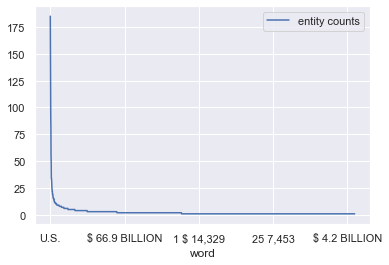

In [179]:
entities_df[~entities_df['word'].str.isnumeric()].plot(x = 'word',y = 'entity counts')

Based on the above analysis, we can see clearly there are many words under the financial context.

In the following cells, we just calculate the first row's measurements. By manual calculation, we get tp,tn,fn,fp.

In [188]:
tp,fn,fp,tn = 34,13,11,5163

In [189]:
precision = tp/(tp+fp)
recall = tp/(tp+fn)
f1_score = 2*precision*recall/(precision+recall)
print('Precision :', precision)
print('Recall :', recall)
print('F score :', f1_score, '(alpha = 1)')

Precision : 0.7555555555555555
Recall : 0.723404255319149
F score : 0.7391304347826088 (alpha = 1)


## Dependency parsing and graph representations

Dependency parsing was developed to robustly capture linguistic dependencies from text. The complex tags associated with these parses are detailed [here]('http://universaldependencies.org/u/overview/syntax.html'). When parsing with the dependency parser, we will work directly from the untokenized text. Note that no *processing* takes place before parsing sentences--we do not remove so-called stop words or anything that plays a syntactic role in the sentence, although anaphora resolution and related normalization may be performed before or after parsing to enhance the value of information extraction. 

We will be using spaCy's built in dependancy parser to go about exploring the tree.
Note that unlike previous examples, large corpuses or collections of sentences don't give us as much information, so we will be navigating smaller sentences.

Let us start by exploring noun chunks. Noun chunks are “base noun phrases” – flat phrases that have a noun as their head. You can think of noun chunks as a noun plus the words describing the noun – for example, “the lavish green grass” or “the world’s largest tech fund”. To get the noun chunks in a document, simply iterate over the sentences noun chunks.

In [190]:
from spacy import displacy

In [191]:
doc = nlp("Autonomous cars shift insurance liability toward manufacturers")

In [192]:
displacy.render(doc, style='dep')

In [193]:
for chunk in doc.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

Autonomous cars cars nsubj shift
insurance liability liability dobj shift
manufacturers manufacturers pobj toward


spaCy uses the terms head and child to describe the words connected by a single arc in the dependency tree. The term dep is used for the arc label, which describes the type of syntactic relation that connects the child to the head. As with other attributes, the value of .dep is a hash value. You can get the string value with .dep_.

For your reference:

Text: The original token text.

Dep: The syntactic relation connecting child to head.

Head text: The original text of the token head.

Head POS: The part-of-speech tag of the token head.

Children: The immediate syntactic dependents of the token.

In [194]:
for token in doc:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

Autonomous amod cars NOUN []
cars nsubj shift VERB [Autonomous]
shift ROOT shift VERB [cars, liability]
insurance compound liability NOUN []
liability dobj shift VERB [insurance, toward]
toward prep liability NOUN [manufacturers]
manufacturers pobj toward ADP []


Because the syntactic relations form a tree, every word has exactly one head. You can therefore iterate over the arcs in the tree by iterating over the words in the sentence. This is usually the best way to match an arc of interest — from below:

In [195]:
from spacy.symbols import nsubj, VERB

In [196]:
verbs = set()
for possible_subject in doc:
    if possible_subject.dep == nsubj and possible_subject.head.pos == VERB:
        verbs.add(possible_subject.head)
print(verbs)

{shift}


You can *also* navigate from above. It isn't as efficient though.

In [197]:
verbs = []
for possible_verb in doc:
    if possible_verb.pos == VERB:
        for possible_subject in possible_verb.children:
            if possible_subject.dep == nsubj:
                verbs.append(possible_verb)
                break

In [198]:
print(verbs)

[shift]


### Iterating around the local tree
A few more convenience attributes are provided for iterating around the local tree from the token. Token.lefts and Token.rights attributes provide sequences of syntactic children that occur before and after the token. Both sequences are in sentence order. There are also two integer-typed attributes, Token.n_lefts and Token.n_rights that give the number of left and right children.

In [199]:
doc = nlp("bright red apples on the tree")
print([token.text for token in doc[2].lefts])  # ['bright', 'red']
print([token.text for token in doc[2].rights])  # ['on']
print(doc[2].n_lefts)  # 2
print(doc[2].n_rights)  # 1

['bright', 'red']
['on']
2
1


You can get a whole phrase by its syntactic head using the Token.subtree attribute. This returns an ordered sequence of tokens. You can walk up the tree with the Token.ancestors attribute, and check dominance with Token.is_ancestor

In [200]:
doc = nlp("Credit and mortgage account holders must submit their requests")

root = [token for token in doc if token.head == token][0]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

Credit nmod 0 2 ['holders', 'submit']
and cc 0 0 ['Credit', 'holders', 'submit']
mortgage compound 0 0 ['account', 'Credit', 'holders', 'submit']
account conj 1 0 ['Credit', 'holders', 'submit']
holders nsubj 1 0 ['submit']


Finally, the .left_edge and .right_edge attributes can be especially useful, because they give you the first and last token of the subtree. This is the easiest way to create a Span object for a syntactic phrase. Note that .right_edge gives a token within the subtree — so if you use it as the end-point of a range, don’t forget to +1!

In [201]:
span = doc[doc[4].left_edge.i : doc[4].right_edge.i+1]
with doc.retokenize() as retokenizer:
    retokenizer.merge(span)
for token in doc:
    print(token.text, token.pos_, token.dep_, token.head.text)

Credit and mortgage account holders NOUN nsubj submit
must VERB aux submit
submit VERB ROOT submit
their DET poss requests
requests NOUN dobj submit


In [202]:
displacy.render(doc, style='dep')

### Information Extraction

How can dependancy graphs be useful? We can extract information from the sentences based on relationships between words within parsed phrases. Let us see if we can do this to glean any information, from, say, our movies dataset. 

How violent are the movies? Who is killing who?

In [111]:
movie_violences = {}

In [112]:
for index, row in movie_df.iterrows():
    text = ' '.join(row['Tokenized Texts'])
    movie_violences[row['Movie Name']] = ([], [])
    doc = nlp(text)
    for chunk in doc.noun_chunks:
        subject = 0
        object_ = 0
        # if the verb or the root of the sentence is kill
        if chunk.root.head.text == 'kill':
            # we find the subjects and objects around the word, and if it does exist, add it to the tuple
            if chunk.root.dep_ == 'nsubj':
                subject = chunk.root.text
            if chunk.root.dep_ == 'dobj':
                object_ = chunk.root.text
            if subject is not 0:
                movie_violences[row['Movie Name']][0].append(subject)
            if object_ is not 0:
                movie_violences[row['Movie Name']][1].append(object_)

<>:15: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:17: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:15: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<>:17: SyntaxWarning: "is not" with a literal. Did you mean "!="?
<ipython-input-112-9d395d491929>:15: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if subject is not 0:
<ipython-input-112-9d395d491929>:17: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  if object_ is not 0:


In [113]:
movie_violences

{'Animal Crackers': ([], []),
 'Anna Christie': (['I', 'I'], ['them', 'you', 'Glory', 'you']),
 'Ladies of Leisure': ([], []),
 'Over the Hill': ([], ['Thou', 'Ma']),
 'Design for Living': ([], []),
 'Lady for a Day': (['It'], ['yourself', 'Louise']),
 'Lady Killer': ([], ['horse']),
 'The Mind Reader': (['woman'], ['herself']),
 'Here Is My Heart': ([], ['herself']),
 'Peculiar Penguins': ([], []),
 'Sadie McKee': (['You', 'I'], ['SOBBING', 'you']),
 'Star of Midnight': (['you', 'I', 'They'],
  ['story', 'him', 'him', 'dal', 'her']),
 'The Littlest Rebel': (['men'], ['army']),
 'The Robber Kitten': ([], []),
 'Charlie Chan at the Circus': ([], []),
 'Charlie Chan at the Opera': (['I'], ['me', 'him', 'you', 'intrusion']),
 'Charlie Chan at the Race Track': (['shoe', 'you'], ['major']),
 'The Prisoner of Shark Island': (['government'], ['husband']),
 'The Prince and the Pauper': ([], ['me']),
 'The Lady Vanishes': (['They'], ['lot']),
 'Holiday': ([], []),
 "Donald's Cousin Gus": ([], [

That's pretty neat: we can see who tried to kill who, or at least talked about it. A lot of 'I' killing 'you', as we'd imagine. What else can we see?

The movie, about time, which is about time travel, funnily enough has:
`'About Time': (['I'], ['Hitler'])`

## <span style="color:red">*Your turn*</span>

<span style="color:red">In the cells immediately following, parse a (modest) subset of your corpus of interest. How deep are the phrase structure and dependency parse trees nested? How does parse depth relate to perceived sentence complexity? What are five things you can extract from these parses for subsequent analysis? (e.g., nouns collocated in a noun phrase; adjectives that modify a noun; etc.) Capture these sets of things for a focal set of words (e.g., "Bush", "Obama", "Trump"). What do they reveal about the roles that these entities are perceive to play in the social world inscribed by your texts?

In [263]:
s = df.iloc[-1,2]

In [264]:
tsla_20 = nlp(s)

In [206]:
displacy.render(tsla_20, style = 'dep')

In [207]:
for chunk in tsla_20.noun_chunks:
    print(chunk.text, chunk.root.text, chunk.root.dep_, chunk.root.head.text)

MANAGEMENT’S DISCUSSION DISCUSSION ROOT DISCUSSION
ANALYSIS ANALYSIS conj DISCUSSION
FINANCIAL CONDITION CONDITION pobj OF
RESULTS RESULTS conj CONDITION
THE FOLLOWING DISCUSSION DISCUSSION nsubjpass READ
ANALYSIS ANALYSIS conj DISCUSSION
CONJUNCTION CONJUNCTION pobj IN
STATEMENTS STATEMENTS appos FINANCIAL
THE RELATED NOTES NOTES nsubj INCLUDED
ANNUAL ANNUAL ROOT ANNUAL
REPORT ON FORM FORM dobj ANNUAL
DISCUSSION DISCUSSION pobj FOR
CHANGES CHANGES pobj TO
FINANCIAL CONDITION CONDITION pobj IN
THE RESULTS RESULTS conj CONDITION
OPERATIONS OPERATIONS pobj OF
FISCAL YEAR YEAR pobj FOR
2017-RELATED ITEMS ITEMS ROOT ITEMS
REFER REFER appos ITEMS
PART II II pobj TO
MANAGEMENT'S DISCUSSION DISCUSSION ROOT DISCUSSION
ANALYSIS ANALYSIS conj DISCUSSION
FINANCIAL CONDITION CONDITION pobj OF
RESULTS RESULTS conj CONDITION
OPERATIONS OPERATIONS pobj OF
OUR ANNUAL REPORT REPORT pobj IN
FORM FORM pobj ON
FISCAL YEAR YEAR pobj FOR
THE SECURITIES AND EXCHANGE COMMISSION COMMISSION pobj WITH
FEBRUARY F

PARTICULAR PARTICULAR pobj IN
OUR EFFORTS EFFORTS nsubj SCALE
OUR COST STRUCTURE RELATIVE RELATIVE dobj OPTIMIZE
THE SIZE SIZE pobj TO
OUR BUSINESS BUSINESS pobj OF
ALREADY ALREADY dobj HAVE
TOTAL TOTAL pobj IN
OPERATING OPERATING ROOT OPERATING
EXPENSES EXPENSES dobj OPERATING
FISCAL YEAR YEAR pobj FROM
FISCAL YEAR YEAR pobj TO
RESTRUCTURING RESTRUCTURING pobj INCLUDING
OTHER CHARGES CHARGES conj RESTRUCTURING
OUR TOTAL REVENUES REVENUES nsubj INCREASED
THE SAME PERIOD PERIOD pobj IN
MARCH MARCH pobj IN
OUR STOCKHOLDERS STOCKHOLDERS nsubj APPROVED
THE 2018 CEO PERFORMANCE AWARD AWARD dobj APPROVED
CONTINGENT CONTINGENT dobj VESTING
ACHIEVING MARKET CAPITALIZATION CAPITALIZATION pobj ON
OPERATIONAL MILESTONES MILESTONES conj CAPITALIZATION
WE WE nsubj INCUR
NON-CASH STOCK-BASED COMPENSATION EXPENSE EXPENSE dobj SIGNIFICANT
EACH TRANCHE TRANCHE pobj FOR
THIS AWARD AWARD ROOT AWARD
OPERATIONAL MILESTONE MILESTONE ROOT MILESTONE
PROBABLE PROBABLE ROOT PROBABLE
MET MET attr BEING
THE GRANT

RECORDED AS OPERATING LEASES LEASES attr WERE
THE AMOUNT AMOUNT nsubj EQUAL
SALE PROCEEDS PROCEEDS pobj OF
THE RESALE VALUE GUARANTEE GUARANTEE pobj TO
WAS DEFERRED DEFERRED ROOT DEFERRED
THE GUARANTEE GUARANTEE pobj UNTIL
EXPIRED EXPIRED ROOT EXPIRED
EXERCISED EXERCISED nsubj WAS
CERTAIN TRANSACTIONS TRANSACTIONS pobj FOR
INTEREST BEARING BEARING ROOT BEARING
COLLATERALIZED COLLATERALIZED ROOT COLLATERALIZED
BORROWINGS BORROWINGS ROOT BORROWINGS
AS REQUIRED REQUIRED ROOT REQUIRED
ASC ASC pobj UNDER
LEASES LEASES nsubj PRIOR
JANUARY JANUARY pobj TO
WE WE nsubj ACCRUED
INTEREST EXPENSE BASED BASED dobj ACCRUED
OUR BORROWING RATE RATE pobj ON
THE REMAINING SALE PROCEEDS PROCEEDS nsubj WERE
AUTOMOTIVE LEASING REVENUE REVENUE pobj TO
THE GUARANTEE PERIOD PERIOD nsubj EXPIRED
THE END END pobj OF
THE GUARANTEE PERIOD PERIOD pobj OF
OR THE PAY-OFF OFF ROOT OFF
THE INITIAL LOAN LOAN pobj OF
WE WE nsubj CAPITALIZED
THE COST COST dobj CAPITALIZED
THESE VEHICLES VEHICLES pobj OF
THE CONSOLIDATED 

THE CONSOLIDATED BALANCE SHEET AS OPERATING LEASE VEHICLES VEHICLES pobj ON
NET NET appos VEHICLES
DEPRECIATE THEIR VALUE VALUE conj NET
LESS SALVAGE VALUE VALUE conj VALUE
COST COST pobj TO
AUTOMOTIVE LEASING REVENUE REVENUE pobj OF
THE SAME PERIOD PERIOD pobj OVER
CASES CASES pobj IN
A CUSTOMER CUSTOMER nsubj RETAINS
OWNERSHIP OWNERSHIP dobj RETAINS
A VEHICLE VEHICLE pobj OF
THE END END pobj AT
THE GUARANTEE PERIOD PERIOD pobj OF
, THE RESALE VALUE GUARANTEE LIABILITY LIABILITY ROOT LIABILITY
ANY REMAINING DEFERRED REVENUE BALANCES BALANCES conj LIABILITY
THE VEHICLE VEHICLE pobj TO
AUTOMOTIVE LEASING REVENUE REVENUE pobj TO
THE NET BOOK VALUE VALUE nsubj IS
THE LEASED VEHICLE VEHICLE pobj OF
EXPENSED EXPENSED attr IS
COST COST pobj TO
AUTOMOTIVE LEASING REVENUE REVENUE pobj OF
A CUSTOMER CUSTOMER nsubj RETURNS
THE VEHICLE VEHICLE dobj RETURNS
US US pobj TO
THE GUARANTEE PERIOD PERIOD pobj DURING
THE VEHICLE VEHICLE dobj PURCHASE
THE CUSTOMER CUSTOMER pobj FROM
AN AMOUNT AMOUNT pobj 

OTHER OTHER conj LIABILITIES
THE REMAINING BALANCE BALANCE nsubjpass INCLUDED
OTHER LONG-TERM LIABILITIES LIABILITIES pobj WITHIN
THE CONSOLIDATED BALANCE SHEETS SHEETS pobj ON
WARRANTY EXPENSE EXPENSE nsubj IS
RECORDED AS AS attr IS
A COMPONENT COMPONENT ROOT COMPONENT
COST COST pobj OF
REVENUES REVENUES pobj OF
THE CONSOLIDATED STATEMENTS STATEMENTS pobj IN
OPERATIONS OPERATIONS pobj OF
STOCK-BASED COMPENSATION COMPENSATION ROOT COMPENSATION
WE WE nsubj USE
THE FAIR FAIR dobj USE
VALUE METHOD METHOD ROOT METHOD
ACCOUNTING ACCOUNTING pobj OF
OUR STOCK OPTIONS OPTIONS pobj FOR
RESTRICTED STOCK UNITS UNITS conj METHOD
(“RSUS RSUS appos UNITS
EMPLOYEES EMPLOYEES pobj TO
OUR EMPLOYEE STOCK PURCHASE PLAN PLAN conj GRANTED
THE “ESPP ESPP appos PLAN
THE COST COST dobj MEASURE
EMPLOYEE SERVICES SERVICES pobj OF
EXCHANGE EXCHANGE pobj IN
THE STOCK-BASED AWARDS AWARDS pobj FOR
THE FAIR VALUE VALUE nsubj OPTION
STOCK STOCK pobj OF
AWARDS AWARDS dobj OPTION
ONLY SERVICE SERVICE pobj WITH
PERFORMA

BENEFITS BENEFITS dobj RECEIVE
THE VIE VIE pobj FROM
THE VIE VIE pobj TO
WE WE nsubj CONSOLIDATE
A VIE VIE dobj CONSOLIDATE
WE WE nsubj HAVE
A MAJORITY OWNERSHIP INTEREST INTEREST dobj HAVE
WE WE nsubj CONSIDERED
THE PRIMARY BENEFICIARY BENEFICIARY dobj CONSIDERED
WE WE nsubj HAVE
DETERMINED DETERMINED dobj HAVE
WE WE nsubj ARE
THE PRIMARY BENEFICIARY BENEFICIARY attr ARE
ALL THE VIES VIES pobj OF
WE EVALUATE EVALUATE ROOT EVALUATE
OUR RELATIONSHIPS RELATIONSHIPS dobj EVALUATE
THE VIES VIES ROOT VIES
AN ONGOING BASIS BASIS pobj ON
WE WE nsubj CONTINUE
THE PRIMARY BENEFICIARY BENEFICIARY attr BE
ALL INTERCOMPANY INTERCOMPANY nsubj BEEN
TRANSACTIONS TRANSACTIONS dobj INTERCOMPANY
BALANCES BALANCES conj TRANSACTIONS
CONSOLIDATION CONSOLIDATION pobj UPON
48 NONCONTROLLING INTERESTS INTERESTS ROOT INTERESTS
REDEEMABLE REDEEMABLE ROOT REDEEMABLE
NONCONTROLLING NONCONTROLLING ROOT NONCONTROLLING
INTERESTS NONCONTROLLING INTERESTS INTERESTS dobj NONCONTROLLING
REDEEMABLE REDEEMABLE nsubj NONCO

THE RETURNED VEHICLES VEHICLES dobj SUBSEQUENTLY
A REDUCTION REDUCTION pobj IN
AUTOMOTIVE COST COST pobj OF
SALES SALES pobj OF
THE YEAR YEAR pobj FOR
ENDED DECEMBER DECEMBER appos YEAR
REFER REFER ROOT REFER
NOTE NOTE pobj TO
SUMMARY SUMMARY appos NOTE
SIGNIFICANT ACCOUNTING POLICIES POLICIES pobj OF
ELSEWHERE ELSEWHERE ROOT ELSEWHERE
ANNUAL ANNUAL ROOT ANNUAL
FORM FORM pobj ON
10-K. COST COST nsubj DECREASED
AUTOMOTIVE LEASING REVENUE REVENUE pobj OF
THE YEAR YEAR pobj IN
ENDED DECEMBER DECEMBER appos YEAR
THE YEAR YEAR pobj TO
DECEMBER DECEMBER appos YEAR
THE DECREASE DECREASE nsubj WAS
A DECREASE DECREASE pobj TO
OUR RESALE VALUE VALUE pobj UNDER
GUARANTEE GUARANTEE ROOT GUARANTEE
LEASING PROGRAMS PROGRAMS ROOT PROGRAMS
AS OPERATING LEASES LEASES pobj FOR
THE DECREASE DECREASE nsubj WAS
PARTIALLY PARTIALLY attr WAS
AN INCREASE INCREASE pobj BY
CUMULATIVE VEHICLES VEHICLES pobj IN
OUR DIRECT VEHICLE LEASING PROGRAM PROGRAM pobj UNDER
PARTIALLY DUE DUE appos PROGRAM
THE INTRODUCTION 

ENDED DECEMBER DECEMBER appos YEAR
THE SETTLEMENT SETTLEMENT pobj FOR
THE SEC SEC nsubj RELATING
A TAKE-PRIVATE PROPOSAL PROPOSAL pobj TO
TESLA TESLA pobj FOR
THESE EXPENSES EXPENSES nsubj WERE
THE END END pobj BY
INTEREST EXPENSE YEAR YEAR nsubj ENDED
DECEMBER DECEMBER dobj ENDED
2018 CHANGE CHANGE ROOT CHANGE
2017 CHANGE CHANGE ROOT CHANGE
(DOLLARS DOLLARS ROOT DOLLARS
MILLIONS MILLIONS pobj IN
A PERCENTAGE PERCENTAGE ROOT PERCENTAGE
REVENUES REVENUES pobj OF
INTEREST EXPENSE EXPENSE appos %
OR 3% % ROOT %
THE YEAR YEAR pobj IN
ENDED DECEMBER DECEMBER appos YEAR
THE YEAR YEAR pobj TO
DECEMBER DECEMBER appos YEAR
THE INCREASE INCREASE nsubj WAS
AN INCREASE INCREASE attr WAS
OUR AVERAGE OUTSTANDING INDEBTEDNESS INDEBTEDNESS pobj IN
AT RELATIVELY CONSISTENT WEIGHTED AVERAGE INTEREST RATES RATES ROOT RATES
THE YEAR YEAR pobj TO
ENDED DECEMBER DECEMBER appos YEAR
OTHER INCOME INCOME nsubj ENDED
EXPENSE EXPENSE appos INCOME
NET YEAR YEAR nsubj ENDED
2018 CHANGE CHANGE ROOT CHANGE
2017 CHAN

THE FINANCING FUNDS FUNDS pobj INTO
THE DRAW-DOWN DOWN pobj UPON
ANY UNUSED COMMITTED AMOUNTS AMOUNTS pobj OF
NO RESTRICTIONS RESTRICTIONS attr ARE
USE USE pobj ON
AVAILABLE FUNDS FUNDS pobj OF
GENERAL CORPORATE PURPOSES PURPOSES pobj FOR
DETAILS DETAILS pobj FOR
OUR INDEBTEDNESS AND FINANCING FUNDS FUNDS pobj REGARDING
NOTE NOTE pobj TO
DEBT DEBT conj NOTE
STATEMENTS STATEMENTS nsubj INCLUDED
FORM FORM pobj ON
10-K. SUMMARY SUMMARY appos REPORT
CASH FLOWS YEAR YEAR pobj OF
ENDED ENDED ROOT ENDED
, (DOLLARS DOLLARS ROOT DOLLARS
MILLIONS MILLIONS pobj IN
NET CASH CASH ROOT CASH
OPERATING OPERATING ROOT OPERATING
ACTIVITIES ACTIVITIES ROOT ACTIVITIES
INVESTING INVESTING pobj IN
ACTIVITIES ACTIVITIES ROOT ACTIVITIES
FINANCING ACTIVITIES ACTIVITIES pobj BY
OPERATING ACTIVITIES ACTIVITIES pobj FROM
OUR CASH FLOWS FLOWS nsubj ARE
OPERATING ACTIVITIES ACTIVITIES pobj FROM
SIGNIFICANTLY SIGNIFICANTLY dobj ARE
OUR CASH INVESTMENTS INVESTMENTS pobj BY
THE GROWTH GROWTH dobj SUPPORT
OUR BUSINESS 

In [208]:
for token in tsla_20:
    print(token.text, token.dep_, token.head.text, token.head.pos_,
            [child for child in token.children])

ITEM ROOT ITEM ADV [7, .]
7 nummod ITEM ADV []
. punct ITEM ADV []
MANAGEMENT nmod DISCUSSION NOUN [’S]
’S punct MANAGEMENT PROPN []
DISCUSSION ROOT DISCUSSION NOUN [MANAGEMENT, AND, ANALYSIS]
AND cc DISCUSSION NOUN []
ANALYSIS conj DISCUSSION NOUN [OF]
OF prep ANALYSIS PROPN [CONDITION]
FINANCIAL compound CONDITION PROPN []
CONDITION pobj OF ADP [FINANCIAL, AND, RESULTS]
AND cc CONDITION PROPN []
RESULTS conj CONDITION PROPN [OF]
OF prep RESULTS NOUN [OPERATIONS]
OPERATIONS pobj OF ADP []
THE det DISCUSSION NOUN []
FOLLOWING amod DISCUSSION NOUN []
DISCUSSION nsubjpass READ VERB [THE, FOLLOWING, AND, ANALYSIS]
AND cc DISCUSSION NOUN []
ANALYSIS conj DISCUSSION NOUN []
SHOULD aux READ VERB []
BE auxpass READ VERB []
READ ROOT READ VERB [DISCUSSION, SHOULD, BE, IN, AND, INCLUDED]
IN prep READ VERB [CONJUNCTION]
CONJUNCTION pobj IN ADP [WITH]
WITH prep CONJUNCTION NOUN [FINANCIAL]
THE det FINANCIAL ADJ []
CONSOLIDATED compound FINANCIAL ADJ []
FINANCIAL pobj WITH ADP [THE, CONSOLIDATED, 

SOLAR nmod GREW VERB []
DEPLOYMENTS compound GREW VERB []
GREW nsubj APPROXIMATELY PROPN [OUR, SOLAR, DEPLOYMENTS]
APPROXIMATELY ROOT APPROXIMATELY PROPN [GREW, %, ,, QUARTER, ,, IN, .]
48 nummod % NOUN []
% npadvmod APPROXIMATELY PROPN [48, AND, %]
AND cc % NOUN []
26 nummod % NOUN []
% conj % NOUN [26]
, punct APPROXIMATELY PROPN []
QUARTER npadvmod APPROXIMATELY PROPN [-, QUARTER]
- punct QUARTER PROPN []
OVER compound QUARTER PROPN []
- punct QUARTER PROPN []
QUARTER appos QUARTER PROPN [OVER, -]
, punct APPROXIMATELY PROPN []
IN prep APPROXIMATELY PROPN [HALF]
THE det HALF NOUN []
SECOND amod HALF NOUN []
HALF pobj IN ADP [THE, SECOND, OF]
OF prep HALF NOUN [YEAR]
THE det YEAR PROPN []
YEAR pobj OF ADP [THE]
. punct APPROXIMATELY PROPN []
WE nsubj DEPLOYED VERB []
ALSO advmod DEPLOYED VERB []
DEPLOYED ROOT DEPLOYED VERB [WE, ALSO, GWH, IN, ,, MORE, .]
1.65 nummod GWH PROPN []
GWH dobj DEPLOYED VERB [1.65, OF]
OF prep GWH PROPN [STORAGE]
ENERGY compound STORAGE PROPN []
STORAGE pob

, punct FACILITY PROPN []
PART appos FACILITY PROPN [OF]
OF prep PART PROPN [WHICH]
WHICH pobj OF ADP []
WAS ROOT WAS VERB [USED]
USED acomp WAS VERB [REPAY]
TO aux REPAY VERB []
REPAY xcomp USED VERB [TO, ENTERED]
A det ENTERED NOUN []
RMB nmod ENTERED NOUN []
3.5 compound BILLION NUM []
BILLION nummod BRIDGE NOUN [3.5]
BRIDGE compound LOAN NOUN [BILLION]
LOAN compound ENTERED NOUN [BRIDGE]
ENTERED dobj REPAY VERB [A, RMB, LOAN]
INTO ROOT INTO VERB [IN, .]
IN prep INTO VERB [MARCH]
MARCH pobj IN ADP [2019]
2019 nummod MARCH PROPN []
. punct INTO VERB []
WE nsubj SUPPLEMENTING VERB []
ARE aux SUPPLEMENTING VERB []
SUPPLEMENTING ROOT SUPPLEMENTING VERB [WE, ARE, FINANCING, WITH, .]
SUCH amod FINANCING VERB []
FINANCING dobj SUPPLEMENTING VERB [SUCH]
WITH prep SUPPLEMENTING VERB [EXPENDITURES]
LIMITED amod EXPENDITURES PROPN []
DIRECT compound EXPENDITURES PROPN []
CAPITAL compound EXPENDITURES PROPN []
EXPENDITURES pobj WITH ADP [LIMITED, DIRECT, CAPITAL]
. punct SUPPLEMENTING VERB []
3

EXPECT ROOT EXPECT VERB [WE, IMPACT]
A det IMPACT NOUN []
SIMILAR compound IMPACT NOUN []
IMPACT dobj EXPECT VERB [A, SIMILAR, IN, FOR]
IN prep IMPACT NOUN [CHINA]
CHINA pobj IN ADP []
FOR prep IMPACT NOUN [Y]
MODEL compound Y PROPN []
Y pobj FOR ADP [MODEL]
WHEN advmod COMMENCE VERB []
WE nsubj COMMENCE VERB []
COMMENCE ROOT COMMENCE VERB [WHEN, WE, PRODUCTION, THERE, OFFERING, .]
PRODUCTION ccomp COMMENCE VERB []
THERE dobj COMMENCE VERB [OF]
OF prep THERE ADV [THIS]
THIS pobj OF ADP []
OFFERING ccomp COMMENCE VERB [IN]
IN prep OFFERING NOUN [SEGMENT]
THE det SEGMENT PROPN []
POPULAR compound SEGMENT PROPN []
COMPACT compound SUV PROPN []
SUV compound SEGMENT PROPN [COMPACT]
SEGMENT pobj IN ADP [THE, POPULAR, SUV]
. punct COMMENCE VERB []
MOREOVER ROOT MOREOVER PROPN [,, GENERATED]
, punct MOREOVER PROPN []
THE det INTEREST NOUN []
SIGNIFICANT compound INTEREST NOUN []
INTEREST compound GENERATED VERB [THE, SIGNIFICANT]
GENERATED conj MOREOVER PROPN [INTEREST, BY]
BY prep GENERATED V

TO prep EXPECT VERB [ALLEVIATE]
ALLEVIATE pcomp TO ADP [ISSUES]
ANY det ISSUES NOUN []
RELATED amod ISSUES NOUN []
ISSUES dobj ALLEVIATE PROPN [ANY, RELATED, THROUGH]
THROUGH prep ISSUES NOUN [LOCAL]
LOCAL pobj THROUGH VERB []
PRODUCTION ROOT PRODUCTION NOUN []
AT compound GIGAFACTORY PROPN []
GIGAFACTORY ROOT GIGAFACTORY PROPN [AT]
SHANGHAI ROOT SHANGHAI PROPN [AND]
AND cc SHANGHAI PROPN []
EVENTUALLY ROOT EVENTUALLY PROPN []
AT compound GIGAFACTORY PROPN []
GIGAFACTORY compound BERLIN PROPN [AT]
BERLIN ROOT BERLIN PROPN [GIGAFACTORY, .]
. punct BERLIN PROPN []
WE nsubj CONTINUE VERB []
ALSO advmod CONTINUE VERB []
CONTINUE ROOT CONTINUE VERB [WE, ALSO, EXPAND]
TO aux EXPAND NOUN []
EXPAND xcomp CONTINUE VERB [TO, AND, INVEST]
AND cc EXPAND NOUN []
INVEST conj EXPAND NOUN [IN, AND, CHARGING]
IN prep INVEST NOUN [SERVICING]
OUR poss SERVICING NOUN []
SERVICING pobj IN ADP [OUR]
AND cc INVEST NOUN []
CHARGING conj INVEST NOUN [LOCATIONS]
LOCATIONS dobj CHARGING VERB [AND, CAPABILITIES]


MILESTONES dobj MEET VERB [VARIOUS]
ALONG prep MEET VERB [RAMP]
SUCH amod RAMP NOUN []
RAMP pobj ALONG ADP [SUCH]
MORE amod QUICKLY ADV []
QUICKLY ROOT QUICKLY ADV [MORE, THAN, ,]
THAN prep QUICKLY ADV [EXPECTED]
EXPECTED pobj THAN ADP []
, punct QUICKLY ADV []
OUR poss EXPENDITURES NOUN []
CAPITAL compound EXPENDITURES NOUN []
EXPENDITURES compound MAY VERB [OUR, CAPITAL]
MAY aux BE VERB [EXPENDITURES]
BE ROOT BE VERB [MAY, ACCELERATED, .]
ACCELERATED attr BE VERB []
. punct BE VERB []
WE nsubj ALSO ADV []
ALSO ROOT ALSO ADV [WE, EVALUATE, ,, AND, ADJUST]
CONTINUOUSLY compound EVALUATE PROPN []
EVALUATE dobj ALSO ADV [CONTINUOUSLY]
, punct ALSO ADV []
AND cc ALSO ADV []
AS mark ADJUST PROPN []
APPROPRIATE compound ADJUST PROPN []
ADJUST conj ALSO ADV [AS, APPROPRIATE, ,]
, punct ADJUST PROPN []
OUR poss EXPENDITURES PROPN []
CAPITAL compound EXPENDITURES PROPN []
EXPENDITURES compound ON ADP [OUR, CAPITAL]
BASED compound ON ADP []
ON ROOT ON ADP [EXPENDITURES, BASED, ,, AMONG]
, punct

$ quantmod BILLION NUM []
24.6 compound BILLION NUM []
BILLION pobj TO ADP [$, 24.6]
IN prep INCREASED VERB [PERIOD]
THE det PERIOD PROPN []
SAME amod PERIOD PROPN []
PERIOD pobj IN ADP [THE, SAME]
. punct INCREASED VERB []
IN prep APPROVED VERB [MARCH]
MARCH pobj IN ADP [2018]
2018 nummod MARCH PROPN []
, punct APPROVED VERB []
OUR poss STOCKHOLDERS NOUN []
STOCKHOLDERS nsubj APPROVED VERB [OUR]
APPROVED ROOT APPROVED VERB [IN, ,, STOCKHOLDERS, AWARD, ,, WITH, .]
THE det AWARD PROPN []
2018 nummod AWARD PROPN []
CEO compound PERFORMANCE PROPN []
PERFORMANCE compound AWARD PROPN [CEO]
AWARD dobj APPROVED VERB [THE, 2018, PERFORMANCE]
, punct APPROVED VERB []
WITH prep APPROVED VERB [VESTING]
VESTING pcomp WITH ADP [CONTINGENT, ON]
CONTINGENT dobj VESTING VERB []
ON prep VESTING VERB [CAPITALIZATION]
ACHIEVING compound CAPITALIZATION PROPN []
MARKET compound CAPITALIZATION PROPN []
CAPITALIZATION pobj ON ADP [ACHIEVING, MARKET, AND, MILESTONES]
AND cc CAPITALIZATION PROPN []
OPERATIONAL

ARE ROOT ARE VERB [LIKELY, .]
REASONABLY compound LIKELY NOUN []
LIKELY attr ARE VERB [REASONABLY, OCCUR]
TO aux OCCUR VERB []
OCCUR acl LIKELY NOUN [TO, FROM]
FROM prep OCCUR VERB [PERIOD, TO]
PERIOD pobj FROM ADP []
TO prep FROM ADP [PERIOD]
PERIOD pobj TO ADP []
. punct ARE VERB []
ACCORDINGLY npadvmod DIFFER VERB []
, punct DIFFER VERB []
ACTUAL compound RESULTS NOUN []
RESULTS nsubj DIFFER VERB [ACTUAL]
COULD aux DIFFER VERB []
DIFFER ROOT DIFFER VERB [ACCORDINGLY, ,, RESULTS, COULD, SIGNIFICANTLY, FROM, .]
SIGNIFICANTLY dobj DIFFER VERB []
FROM prep DIFFER VERB [ESTIMATES]
THE det ESTIMATES NOUN []
ESTIMATES pobj FROM ADP [THE, MADE]
MADE acl ESTIMATES NOUN [BY]
BY prep MADE VERB [MANAGEMENT]
OUR poss MANAGEMENT NOUN []
MANAGEMENT pobj BY ADP [OUR]
. punct DIFFER VERB []
WE nsubj EVALUATE PROPN []
EVALUATE ROOT EVALUATE PROPN [WE, ESTIMATES, ON, .]
OUR poss ESTIMATES NOUN []
ESTIMATES dobj EVALUATE PROPN [OUR, AND, ASSUMPTIONS]
AND cc ESTIMATES NOUN []
ASSUMPTIONS conj ESTIMATES 

ARE ROOT ARE VERB [UPDATES, PROVISIONED, AND, RECOGNIZED]
PROVISIONED acomp ARE VERB [UPON]
UPON prep PROVISIONED NOUN [TRANSFER]
CONTROL compound TRANSFER NOUN []
TRANSFER pobj UPON ADP [CONTROL, OF]
OF prep TRANSFER NOUN [VEHICLE]
A det VEHICLE NOUN []
VEHICLE pobj OF ADP [A]
AND cc ARE VERB []
RECOGNIZED conj ARE VERB [OVER, TIME, ON]
OVER prep RECOGNIZED NOUN []
TIME dobj RECOGNIZED NOUN []
ON prep RECOGNIZED NOUN []
A det BASIS PROPN []
STRAIGHT compound LINE NOUN []
- punct LINE NOUN []
LINE compound BASIS PROPN [STRAIGHT, -]
BASIS ROOT BASIS PROPN [A, LINE, HAVE, .]
AS mark HAVE VERB []
WE nsubj HAVE VERB []
HAVE advcl BASIS PROPN [AS, WE, OBLIGATION]
A det OBLIGATION NOUN []
STAND npadvmod READY ADJ []
- punct READY ADJ []
READY amod OBLIGATION NOUN [STAND, -]
OBLIGATION dobj HAVE VERB [A, READY, TO, SERVICES, TO]
TO prep OBLIGATION NOUN [DELIVER]
DELIVER pobj TO PART []
SUCH amod SERVICES NOUN []
SERVICES appos OBLIGATION NOUN [SUCH]
TO prep OBLIGATION NOUN [CUSTOMER]
THE det 

RECEIVE ROOT RECEIVE VERB [UNDER, ,, WE, PAYMENT]
FULL compound PAYMENT NOUN []
PAYMENT dobj RECEIVE VERB [FULL, FOR]
FOR prep PAYMENT NOUN [PRICE]
THE det PRICE PROPN []
VEHICLE compound PRICE PROPN []
SALES compound PRICE PROPN []
PRICE pobj FOR ADP [THE, VEHICLE, SALES]
AT ROOT AT ADP [TIME]
THE det TIME NOUN []
TIME pobj AT ADP [THE, OF, AND]
OF prep TIME NOUN [DELIVERY]
DELIVERY pobj OF ADP []
AND cc TIME NOUN []
OUR poss COUNTERPARTY NOUN []
COUNTERPARTY nsubj HAS VERB [OUR]
HAS ROOT HAS VERB [COUNTERPARTY, VEHICLE]
THE det OPTION NOUN []
OPTION nsubj VEHICLE NOUN [THE, OF]
OF prep OPTION NOUN [THEIR]
SELLING compound THEIR NOUN []
THEIR pobj OF ADP [SELLING]
VEHICLE ccomp HAS VERB [OPTION, BACK, DURING, ,]
BACK advmod VEHICLE NOUN [TO]
TO prep BACK ADV [US]
US pobj TO ADP []
DURING prep VEHICLE NOUN [PERIOD]
THE det PERIOD PROPN []
GUARANTEE compound PERIOD PROPN []
PERIOD pobj DURING ADP [THE, GUARANTEE]
, punct VEHICLE NOUN []
WHICH compound CURRENTLY PROPN []
CURRENTLY nsubj 

RESALE compound GUARANTEES NOUN []
VALUE compound GUARANTEES NOUN []
GUARANTEES pobj WITH ADP [RESALE, VALUE]
WERE ROOT WERE VERB [TRANSACTIONS, LEASES, .]
RECORDED compound AS ADP []
AS compound LEASES NOUN [RECORDED]
OPERATING compound LEASES NOUN []
LEASES attr WERE VERB [AS, OPERATING]
. punct WERE VERB []
THE det AMOUNT PROPN []
AMOUNT nsubj EQUAL PROPN [THE, OF]
OF prep AMOUNT PROPN [PROCEEDS]
SALE compound PROCEEDS PROPN []
PROCEEDS pobj OF ADP [SALE]
EQUAL ROOT EQUAL PROPN [AMOUNT, TO]
TO prep EQUAL PROPN [GUARANTEE]
THE det GUARANTEE PROPN []
RESALE compound VALUE NOUN []
VALUE compound GUARANTEE PROPN [RESALE]
GUARANTEE pobj TO ADP [THE, VALUE]
WAS auxpass DEFERRED NOUN []
DEFERRED ROOT DEFERRED NOUN [WAS, UNTIL]
UNTIL prep DEFERRED NOUN [GUARANTEE]
THE det GUARANTEE PROPN []
GUARANTEE pobj UNTIL PROPN [THE]
EXPIRED ROOT EXPIRED PROPN [OR]
OR cc EXPIRED PROPN []
WAS ROOT WAS VERB [EXERCISED, .]
EXERCISED nsubj WAS VERB []
. punct WAS VERB []
FOR prep WERE VERB [TRANSACTIONS]


WE nsubj EARNED VERB []
HAVE aux EARNED VERB []
EARNED ROOT EARNED VERB [,, WE, HAVE, AND, CONTINUE, .]
AND cc EARNED VERB []
WILL aux CONTINUE VERB []
CONTINUE conj EARNED VERB [WILL, TO]
TO prep CONTINUE VERB [EARN, CREDITS]
EARN pobj TO PART []
VARIOUS amod CREDITS NOUN [TRADABLE]
TRADABLE pobj VARIOUS NOUN []
AUTOMOTIVE compound CREDITS NOUN []
REGULATORY compound CREDITS NOUN []
CREDITS pobj TO PART [VARIOUS, AUTOMOTIVE, REGULATORY]
. punct EARNED VERB []
WE nsubj SOLD VERB []
HAVE aux SOLD VERB []
SOLD ROOT SOLD VERB [WE, HAVE, CREDITS, ,, AND, CONTINUE, .]
THESE det CREDITS NOUN []
CREDITS dobj SOLD VERB [THESE]
, punct SOLD VERB []
AND cc SOLD VERB []
WILL aux CONTINUE VERB []
CONTINUE conj SOLD VERB [WILL, SELL]
TO aux SELL VERB []
SELL xcomp CONTINUE VERB [TO, CREDITS, ,, TO]
FUTURE amod CREDITS NOUN []
CREDITS dobj SELL VERB [FUTURE]
, punct SELL VERB []
TO prep SELL VERB [COMPANIES]
AUTOMOTIVE compound COMPANIES NOUN []
COMPANIES pobj TO ADP [AUTOMOTIVE, AND, ENTITIES, USE]

TO aux RETURN VERB []
RETURN xcomp REQUIRED VERB [TO, VEHICLES, TO]
THE det VEHICLES NOUN []
VEHICLES dobj RETURN VERB [THE]
TO prep RETURN VERB [US]
US pobj TO ADP []
OR advmod PURCHASE VERB []
FOR prep PURCHASE VERB [S]
MODEL compound S PROPN []
S pobj FOR ADP [MODEL, AND, LEASES]
AND cc S PROPN []
MODEL compound LEASES NOUN []
X compound LEASES NOUN []
LEASES conj S PROPN [MODEL, X, ,]
, punct LEASES NOUN []
MAY compound OPT PROPN []
OPT dep PURCHASE VERB [MAY]
TO aux PURCHASE VERB []
PURCHASE ROOT PURCHASE VERB [OR, FOR, OPT, TO, VEHICLES, FOR, .]
THE det VEHICLES NOUN []
VEHICLES dobj PURCHASE VERB [THE]
FOR prep PURCHASE VERB [VALUE]
A det VALUE NOUN []
PRE compound DETERMINED PROPN []
- punct DETERMINED PROPN []
DETERMINED compound VALUE NOUN [PRE, -]
RESIDUAL compound VALUE NOUN []
VALUE pobj FOR ADP [A, DETERMINED, RESIDUAL]
. punct PURCHASE VERB []
WE nsubj ACCOUNT VERB []
ACCOUNT ROOT ACCOUNT VERB [WE, FOR, .]
FOR prep ACCOUNT VERB [LEASES]
THESE det AS ADP []
LEASING compou

, punct JANUARY PROPN []
2019 appos JANUARY PROPN []
, punct ARE VERB []
ALL det AGREEMENTS NOUN []
NEW amod AGREEMENTS NOUN []
AGREEMENTS nsubj ARE VERB [ALL, NEW, UNDER]
UNDER prep AGREEMENTS NOUN [THIS, PROGRAM]
THIS pobj UNDER ADP []
PROGRAM pobj UNDER ADP []
ARE ROOT ARE VERB [WITH, ,, AGREEMENTS, ACCOUNTED, FOR]
ACCOUNTED acomp ARE VERB []
FOR prep ARE VERB [LEASES]
AS nmod LEASES NOUN []
OPERATING compound LEASES NOUN []
LEASES pobj FOR ADP [AS, OPERATING, UNDER]
UNDER prep LEASES NOUN [ASC]
ASC pobj UNDER ADP [842]
842 nummod ASC PROPN []
AND cc WAS VERB []
THERE expl WAS VERB []
WAS ROOT WAS VERB [AND, THERE, CHANGE]
NO det CHANGE NOUN []
MATERIAL compound CHANGE NOUN []
CHANGE attr WAS VERB [NO, MATERIAL, IN]
IN prep CHANGE NOUN [TIMING]
THE det TIMING NOUN []
TIMING pobj IN ADP [THE, AND, AMOUNT]
AND cc TIMING NOUN []
AMOUNT conj TIMING NOUN [OF]
OF prep AMOUNT NOUN [RECOGNIZED]
REVENUE compound RECOGNIZED NOUN []
RECOGNIZED pobj OF ADP [REVENUE]
OVER ROOT OVER ADP [TERM, .]

THEIR compound VALUE NOUN []
VALUE conj NET PROPN [DEPRECIATE, THEIR, ,, VALUE]
, punct VALUE NOUN []
LESS compound VALUE NOUN []
SALVAGE compound VALUE NOUN []
VALUE conj VALUE NOUN [LESS, SALVAGE, ,]
, punct VALUE NOUN []
TO prep CAPITALIZE VERB [COST]
COST pobj TO ADP [OF]
OF prep COST NOUN [REVENUE]
AUTOMOTIVE compound REVENUE NOUN []
LEASING compound REVENUE NOUN []
REVENUE pobj OF ADP [AUTOMOTIVE, LEASING]
OVER ROOT OVER ADP [PERIOD, .]
THE det PERIOD PROPN []
SAME amod PERIOD PROPN []
PERIOD pobj OVER ADP [THE, SAME]
. punct OVER ADP []
IN ROOT IN ADP [CASES, RETAINS]
CASES pobj IN ADP []
WHERE advmod RETAINS NOUN []
A det CUSTOMER NOUN []
CUSTOMER nsubj RETAINS NOUN [A]
RETAINS cc IN ADP [WHERE, CUSTOMER, OWNERSHIP]
OWNERSHIP dobj RETAINS NOUN [OF]
OF prep OWNERSHIP NOUN [VEHICLE]
A det VEHICLE NOUN []
VEHICLE pobj OF ADP [A]
AT ROOT AT ADP [END]
THE det END PROPN []
END pobj AT ADP [THE, OF]
OF prep END PROPN [PERIOD]
THE det PERIOD PROPN []
GUARANTEE compound PERIOD PROPN []


COMMISSIONED conj INSTALLED NOUN []
. punct PERFORMING VERB []
PAYMENT ROOT PAYMENT NOUN [FOR]
FOR prep PAYMENT NOUN [SYSTEMS]
SUCH amod SYSTEMS NOUN []
STORAGE compound SYSTEMS NOUN []
SYSTEMS pobj FOR ADP [SUCH, STORAGE]
IS auxpass MADE ADJ []
MADE ROOT MADE ADJ [IS, UPON]
UPON prep MADE ADJ []
INVOICE ROOT INVOICE NOUN []
OR ROOT OR CCONJ [IN]
IN prep OR CCONJ [ACCORDANCE]
ACCORDANCE pobj IN ADP []
WITH mark TERMS NOUN []
PAYMENT nsubj TERMS NOUN []
TERMS ROOT TERMS NOUN [WITH, PAYMENT, CUSTOMARY, TO, .]
CUSTOMARY dobj TERMS NOUN []
TO prep TERMS NOUN [BUSINESS]
THE det BUSINESS PROPN []
BUSINESS pobj TO ADP [THE]
. punct TERMS NOUN []
FOR prep CONSIST VERB [SYSTEM]
LARGE amod SYSTEM PROPN []
COMMERCIAL nmod SYSTEM NOUN [AND, UTILITY]
AND cc COMMERCIAL NOUN []
UTILITY conj COMMERCIAL NOUN []
GRADE compound SYSTEM NOUN []
SOLAR compound SYSTEM NOUN []
ENERGY compound SYSTEM NOUN []
SYSTEM nmod SYSTEM PROPN [COMMERCIAL, GRADE, SOLAR, ENERGY, AND]
AND cc SYSTEM NOUN []
ENERGY compound 

SYSTEMS conj SYSTEMS PROPN [ENERGY, STORAGE]
. punct RELATED VERB []
AS mark RELATED VERB []
OUR poss CONTRACT NOUN []
CONTRACT compound RELATED VERB [OUR]
COSTS compound RELATED VERB []
RELATED ROOT RELATED VERB [AS, CONTRACT, COSTS, TO]
TO prep RELATED VERB [SYSTEM]
SOLAR compound SYSTEM NOUN []
ENERGY compound SYSTEM NOUN []
SYSTEM pobj TO ADP [SOLAR, ENERGY, AND]
AND cc SYSTEM NOUN []
ENERGY compound STORAGE PROPN []
STORAGE compound SYSTEM NOUN [ENERGY]
SYSTEM compound SALES NOUN [STORAGE]
SALES nsubj FULFILLED VERB [SYSTEM]
ARE aux FULFILLED VERB []
TYPICALLY advmod FULFILLED VERB []
FULFILLED ROOT FULFILLED VERB [SALES, ARE, TYPICALLY, WITHIN]
WITHIN prep FULFILLED VERB [YEAR]
ONE nummod YEAR NOUN []
YEAR pobj WITHIN PROPN [ONE]
, punct ARE VERB []
THE det COSTS NOUN []
COSTS nsubj ARE VERB [THE, OBTAIN]
TO aux OBTAIN VERB []
OBTAIN relcl COSTS NOUN [TO, CONTRACT]
A det CONTRACT NOUN []
CONTRACT dobj OBTAIN VERB [A]
ARE ROOT ARE VERB [,, COSTS]
EXPENSED compound AS ADP []
AS ROO

PAYMENTS pobj FROM ADP [MINIMUM, LEASE]
, punct REVENUE PROPN []
INCLUDING prep REVENUE PROPN [REBATES]
UPFRONT amod REBATES NOUN []
REBATES pobj INCLUDING VERB [UPFRONT, AND, INCENTIVES]
AND cc REBATES NOUN []
INCENTIVES conj REBATES NOUN []
EARNED ROOT EARNED VERB [ARE, ,, REVENUE, FROM, ON]
FROM prep EARNED VERB [SYSTEMS]
SUCH amod SYSTEMS NOUN []
SYSTEMS pobj FROM ADP [SUCH, ,]
, punct SYSTEMS NOUN []
ON prep EARNED VERB []
A det BASIS VERB []
STRAIGHT compound LINE NOUN []
- punct LINE NOUN []
LINE compound BASIS VERB [STRAIGHT, -]
BASIS ROOT BASIS VERB [A, LINE, OVER, ,, ASSUMING, .]
OVER prep BASIS VERB [LIFE]
THE det LIFE NOUN []
LIFE pobj OVER ADP [THE, OF]
OF prep LIFE NOUN [TERM]
THE det TERM PROPN []
LEASE compound TERM PROPN []
TERM pobj OF ADP [THE, LEASE]
, punct BASIS VERB []
ASSUMING conj BASIS VERB [BEEN]
ALL det CRITERIA NOUN []
OTHER amod CRITERIA NOUN []
REVENUE compound CRITERIA NOUN []
RECOGNITION compound CRITERIA NOUN []
CRITERIA nsubj BEEN VERB [ALL, OTHER, RE

- punct WRITTEN PROPN []
DOWN appos WRITTEN PROPN []
, punct WRITTEN PROPN []
A det NEW ADJ []
NEW nsubj IS VERB [A, ,, COST, BASIS, FOR, INVENTORY]
, punct NEW ADJ []
LOWER compound COST NOUN []
COST conj NEW ADJ [LOWER]
BASIS conj NEW ADJ []
FOR prep NEW ADJ [THAT]
THAT pobj FOR ADP []
INVENTORY conj NEW ADJ []
IS conj IS VERB [NEW, ESTABLISHED]
ESTABLISHED attr IS VERB [AND, CHANGES]
AND cc ESTABLISHED NOUN []
SUBSEQUENT amod CHANGES NOUN []
CHANGES conj ESTABLISHED NOUN [SUBSEQUENT, IN]
IN prep CHANGES NOUN [FACTS]
FACTS pobj IN ADP []
AND cc CIRCUMSTANCES NOUN []
CIRCUMSTANCES ROOT CIRCUMSTANCES NOUN [AND]
DO aux RESULT VERB []
NOT neg RESULT VERB []
RESULT ROOT RESULT VERB [DO, NOT, IN, OR, INCREASE]
IN prep RESULT VERB [RESTORATION]
THE det RESTORATION NOUN []
RESTORATION pobj IN ADP [THE]
OR cc RESULT VERB []
INCREASE conj RESULT VERB []
IN prep BASIS NOUN [THAT]
THAT pobj IN ADP []
NEWLY compound BASIS NOUN []
ESTABLISHED compound COST NOUN []
COST compound BASIS NOUN [ESTABLI

THE det SHEETS PROPN []
CONSOLIDATED compound SHEETS PROPN []
BALANCE compound SHEETS PROPN []
SHEETS pobj ON ADP [THE, CONSOLIDATED, BALANCE]
. punct INCLUDED ADJ []
WARRANTY compound EXPENSE NOUN []
EXPENSE nsubj IS VERB [WARRANTY]
IS ROOT IS VERB [EXPENSE, AS]
RECORDED compound AS PROPN []
AS attr IS VERB [RECORDED]
A det COMPONENT PROPN []
COMPONENT ROOT COMPONENT PROPN [A, OF, IN, .]
OF prep COMPONENT PROPN [COST]
COST pobj OF ADP [OF]
OF prep COST NOUN [REVENUES]
REVENUES pobj OF ADP []
IN prep COMPONENT PROPN [STATEMENTS]
THE det STATEMENTS NOUN []
CONSOLIDATED compound STATEMENTS NOUN []
STATEMENTS pobj IN ADP [THE, CONSOLIDATED, OF]
OF prep STATEMENTS NOUN [OPERATIONS]
OPERATIONS pobj OF ADP []
. punct COMPONENT PROPN []
STOCK compound BASED NOUN []
- punct BASED NOUN []
BASED compound COMPENSATION NOUN [STOCK, -]
COMPENSATION ROOT COMPENSATION NOUN [BASED]
WE nsubj USE VERB []
USE ROOT USE VERB [WE, FAIR]
THE det FAIR PROPN []
FAIR dobj USE VERB [THE]
VALUE compound METHOD NO

PROBABLE ROOT PROBABLE NOUN [IS, CONSIDERED, OF, .]
OF prep PROBABLE NOUN [BEING]
BEING pcomp OF ADP [MET]
MET acomp BEING VERB []
. punct PROBABLE NOUN []
IF mark BECOMES VERB []
SUCH amod MILESTONE NOUN []
OPERATIONAL amod MILESTONE NOUN []
MILESTONE nsubj BECOMES VERB [SUCH, OPERATIONAL]
BECOMES nsubj PROBABLE NOUN [IF, MILESTONE]
PROBABLE ROOT PROBABLE NOUN [BECOMES, TIME, AFTER]
ANY det TIME NOUN []
TIME dobj PROBABLE NOUN [ANY]
AFTER prep PROBABLE NOUN [DATE]
THE det DATE NOUN []
GRANT compound DATE NOUN []
DATE pobj AFTER ADP [THE, GRANT]
, punct RECOGNIZE VERB []
WE nsubj RECOGNIZE VERB []
WILL aux RECOGNIZE VERB []
RECOGNIZE ROOT RECOGNIZE VERB [,, WE, WILL, EXPENSE, FROM, TO, IN, .]
A det EXPENSE NOUN []
CUMULATIVE nmod EXPENSE NOUN []
CATCH compound UP NOUN [-]
- punct CATCH NOUN []
UP compound EXPENSE NOUN [CATCH]
EXPENSE dobj RECOGNIZE VERB [A, CUMULATIVE, UP]
FROM prep RECOGNIZE VERB [DATE]
THE det DATE NOUN []
GRANT compound DATE NOUN []
DATE pobj FROM ADP [THE, GRANT]
T

, punct U.S. PROPN []
MANY amod COUNTRIES NOUN []
COUNTRIES appos U.S. PROPN [MANY, IN, AND, NUMBER]
IN prep COUNTRIES NOUN [UNION]
THE det UNION PROPN []
EUROPEAN compound UNION PROPN []
UNION pobj IN ADP [THE, EUROPEAN]
AND cc COUNTRIES NOUN []
A det NUMBER NOUN []
NUMBER conj COUNTRIES NOUN [A, OF]
OF prep NUMBER NOUN [COUNTRIES]
OTHER amod COUNTRIES NOUN []
COUNTRIES pobj OF ADP [OTHER]
ARE ROOT ARE VERB []
ACTIVELY compound CONSIDERING ADV []
CONSIDERING ROOT CONSIDERING ADV [ACTIVELY]
CHANGES ROOT CHANGES VERB [IN, .]
IN prep CHANGES VERB [REGARD]
THIS det REGARD NOUN []
REGARD pobj IN ADP [THIS]
. punct CHANGES VERB []
AS prep HAD VERB [OF]
OF prep AS ADP [DECEMBER]
DECEMBER pobj OF ADP [31, ,, 2019]
31 nummod DECEMBER PROPN []
, punct DECEMBER PROPN []
2019 appos DECEMBER PROPN []
, punct HAD VERB []
WE nsubj HAD VERB []
HAD ROOT HAD VERB [AS, ,, WE, A]
RECORDED compound A PROPN []
A dobj HAD VERB [RECORDED]
FULL compound VALUATION NOUN []
VALUATION compound ALLOWANCE NOUN [FUL

A det STATUTE PROPN []
STATUTE pobj OF ADP [A, OF]
OF prep STATUTE PROPN [LIMITATIONS]
LIMITATIONS pobj OF ADP []
OR cc LAPSE NOUN []
A det CHANGE NOUN []
CHANGE conj LAPSE NOUN [A, IN]
IN prep CHANGE NOUN [ESTIMATE]
ESTIMATE pobj IN ADP []
. punct AS ADP []
TO ROOT TO ADP [EXTENT, THAT]
THE det EXTENT NOUN []
EXTENT pobj TO ADP [THE]
THAT cc TO ADP [OUTCOME]
THE det OUTCOME NOUN []
FINAL compound OUTCOME NOUN []
TAX compound OUTCOME NOUN []
OUTCOME pobj THAT ADP [THE, FINAL, TAX, OF, FROM, ,, EXPENSE]
OF prep OUTCOME NOUN [DIFFERS]
THESE det DIFFERS NOUN []
MATTERS compound DIFFERS NOUN []
DIFFERS pobj OF ADP [THESE, MATTERS]
FROM prep OUTCOME NOUN [EXPECTATIONS]
OUR poss EXPECTATIONS PROPN []
EXPECTATIONS pobj FROM ADP [OUR]
, punct OUTCOME NOUN []
SUCH amod MAY VERB []
DIFFERENCES compound MAY VERB []
MAY compound EXPENSE VERB [SUCH, DIFFERENCES]
IMPACT compound TAX NOUN []
INCOME compound TAX NOUN []
TAX compound EXPENSE VERB [IMPACT, INCOME]
EXPENSE appos OUTCOME NOUN [MAY, TAX, I

INTEREST dobj HAVE VERB [A, MAJORITY, OWNERSHIP]
WHEN advmod CONSIDERED VERB []
WE nsubj CONSIDERED VERB []
ARE aux CONSIDERED VERB []
NOT neg CONSIDERED VERB []
CONSIDERED advcl HAVE VERB [WHEN, WE, ARE, NOT, BENEFICIARY]
THE det BENEFICIARY PROPN []
PRIMARY compound BENEFICIARY PROPN []
BENEFICIARY dobj CONSIDERED VERB [THE, PRIMARY]
. punct CONSOLIDATE VERB []
WE nsubj HAVE VERB []
HAVE ROOT HAVE VERB [WE, DETERMINED, ARE, .]
DETERMINED dobj HAVE VERB []
THAT mark ARE VERB []
WE nsubj ARE VERB []
ARE advcl HAVE VERB [THAT, WE, BENEFICIARY]
THE det BENEFICIARY PROPN []
PRIMARY compound BENEFICIARY PROPN []
BENEFICIARY attr ARE VERB [THE, PRIMARY, OF]
OF prep BENEFICIARY PROPN [VIES]
ALL predet VIES NOUN []
THE det VIES NOUN []
VIES pobj OF ADP [ALL, THE]
. punct HAVE VERB []
WE compound EVALUATE PROPN []
EVALUATE ROOT EVALUATE PROPN [WE, RELATIONSHIPS]
OUR poss RELATIONSHIPS NOUN []
RELATIONSHIPS dobj EVALUATE PROPN [OUR, WITH]
WITH prep RELATIONSHIPS NOUN [ALL]
ALL pobj WITH ADP []


REDEEM compound INTERESTS NOUN []
THEIR compound INTERESTS NOUN []
INTERESTS pobj TO ADP [REDEEM, THEIR, IN]
IN prep INTERESTS NOUN [FUNDS]
THE det FUNDS NOUN []
FUNDS pobj IN ADP [THE]
FOR prep RIGHT NOUN [CASH]
CASH pobj FOR ADP []
OR cc RIGHT NOUN []
OTHER amod ASSETS PROPN []
ASSETS conj RIGHT NOUN [OTHER]
. punct HAVE VERB []
RESULTS nsubj ENDED PROPN [OF]
OF prep RESULTS NOUN [YEAR]
OPERATIONS compound REVENUES PROPN []
REVENUES compound YEAR PROPN [OPERATIONS]
YEAR pobj OF ADP [REVENUES]
ENDED ROOT ENDED PROPN [RESULTS, DECEMBER, .]
DECEMBER npadvmod ENDED PROPN [31, ,, 2019]
31 nummod DECEMBER PROPN []
, punct DECEMBER PROPN []
2019 npadvmod DECEMBER PROPN []
VS dep . PUNCT []
. punct ENDED PROPN [VS]
2018 nummod CHANGE NOUN []
CHANGE ROOT CHANGE NOUN [2018, 2018]
2018 nummod CHANGE NOUN []
VS dep . PUNCT []
. ROOT . PUNCT [VS]
2017 nummod CHANGE NOUN []
CHANGE ROOT CHANGE NOUN [2017]
( punct DOLLARS NOUN []
DOLLARS ROOT DOLLARS NOUN [(, IN, ), 2019]
IN prep DOLLARS NOUN [MILLI

TO prep INCREASE NOUN [MILLION]
$ quantmod MILLION NUM []
594 compound MILLION NUM []
MILLION pobj TO ADP [$, 594]
. punct TO ADP []
THE det INCREASE NOUN []
INCREASE nsubj WAS VERB [THE]
WAS ROOT WAS VERB [INCREASE, PARTIALLY, OFFSET, BY, .]
PARTIALLY acomp WAS VERB []
OFFSET dep WAS VERB []
BY prep WAS VERB [DECREASE]
A det DECREASE NOUN []
DECREASE pobj BY ADP [A, OF]
OF prep DECREASE NOUN [S]
30,487 nummod S PROPN []
MODEL compound S PROPN []
S pobj OF ADP [30,487, MODEL, AND, DELIVERIES]
AND cc S PROPN []
MODEL compound DELIVERIES NOUN []
X compound DELIVERIES NOUN []
CASH compound DELIVERIES NOUN []
DELIVERIES conj S PROPN [MODEL, X, CASH]
. punct WAS VERB []
THE det DELIVERIES NOUN []
DELIVERIES nsubj WERE VERB [THE, IN, DECEMBER]
IN prep DELIVERIES NOUN [YEAR]
THE det YEAR PROPN []
YEAR pobj IN ADP [THE]
ENDED compound DECEMBER PROPN []
DECEMBER appos DELIVERIES NOUN [ENDED, 31, ,, 2019]
31 nummod DECEMBER PROPN []
, punct DECEMBER PROPN []
2019 appos DECEMBER PROPN []
WERE ROO

LOWER compound AVERAGE NOUN []
AVERAGE compound PRICES NOUN [LOWER]
SELLING compound PRICES NOUN []
PRICES pobj BY ADP [AVERAGE, SELLING]
FOR prep PARTIALLY PROPN [DUE]
TRADED compound IN PROPN [-]
- punct TRADED NOUN []
IN compound DUE ADJ [TRADED]
TESLA compound DUE ADJ []
VEHICLES compound DUE ADJ []
DUE pobj FOR ADP [IN, TESLA, VEHICLES]
TO prep PARTIALLY PROPN []
PRICE ROOT PRICE NOUN []
ADJUSTMENTS ROOT ADJUSTMENTS NOUN []
WE nsubj MADE VERB []
MADE ROOT MADE VERB [WE, TO, IN, .]
TO prep MADE VERB [OFFERINGS]
OUR poss VEHICLE NOUN []
VEHICLE compound OFFERINGS NOUN [OUR]
OFFERINGS pobj TO PART [VEHICLE]
IN prep MADE VERB [2019]
2019 pobj IN ADP []
. punct MADE VERB []
ADDITIONALLY advmod WAS VERB []
, punct WAS VERB []
THERE expl WAS VERB []
WAS ROOT WAS VERB [ADDITIONALLY, ,, THERE, INCREASE, IN, AS]
AN det INCREASE NOUN []
INCREASE attr WAS VERB [AN]
IN prep WAS VERB [REVENUE]
NON dep - ADJ []
- dep WARRANTY PROPN [NON]
WARRANTY amod REVENUE PROPN [-]
MAINTENANCE compound REVEN

AND cc MATERIAL NOUN []
LABOR compound COSTS NOUN []
COSTS conj MATERIAL NOUN [LABOR]
, punct PARTS PROPN []
MANUFACTURING compound OVERHEAD PROPN []
OVERHEAD appos PARTS PROPN [MANUFACTURING]
, punct PARTS PROPN []
INCLUDING prep 4,069 NUM [COSTS]
DEPRECIATION compound COSTS NOUN []
COSTS pobj INCLUDING VERB [DEPRECIATION, OF]
OF prep COSTS NOUN [TOOLING]
TOOLING pobj OF ADP [AND, MACHINERY]
AND cc TOOLING PROPN []
MACHINERY conj TOOLING PROPN [,, SHIPPING]
, punct MACHINERY PROPN []
SHIPPING conj MACHINERY PROPN [AND, COSTS]
AND cc SHIPPING NOUN []
LOGISTIC compound COSTS NOUN []
COSTS conj SHIPPING NOUN [LOGISTIC]
, punct 4,069 NUM []
VEHICLE compound COSTS PROPN []
CONNECTIVITY compound COSTS PROPN []
COSTS appos 4,069 NUM [VEHICLE, CONNECTIVITY, ,, ALLOCATIONS]
, punct COSTS PROPN []
ALLOCATIONS conj COSTS PROPN [OF, AND, RELATED]
OF prep ALLOCATIONS NOUN [ELECTRICITY]
ELECTRICITY pobj OF ADP []
AND cc ALLOCATIONS NOUN []
INFRASTRUCTURE compound COSTS NOUN []
COSTS compound RELATE

THEIR compound OPTIONS NOUN []
BUYBACK compound OPTIONS NOUN []
OPTIONS dobj EXERCISE VERB [THEIR, BUYBACK]
THAT nsubj WERE VERB []
WERE ROOT WERE VERB [THAT, PROVIDED, PRIOR, ADJUSTMENTS, .]
PROVIDED acomp WERE VERB []
PRIOR acomp WERE VERB [TO]
TO prep PRIOR VERB [SUCH]
SUCH pobj TO ADP []
ADJUSTMENTS advmod WERE VERB []
. punct WERE VERB []
IF mark ELECT PROPN []
CUSTOMERS nsubj ELECT PROPN []
ELECT advcl EXPECT VERB [IF, CUSTOMERS, TO, OPTIONS]
TO prep ELECT PROPN [EXERCISE]
EXERCISE pobj TO ADP []
THE det OPTIONS NOUN []
BUYBACK compound OPTIONS NOUN []
OPTIONS dobj ELECT PROPN [THE, BUYBACK, ,]
, punct OPTIONS NOUN []
WE nsubj EXPECT VERB []
EXPECT ROOT EXPECT VERB [ELECT, WE, BE, .]
TO aux BE VERB []
BE xcomp EXPECT VERB [TO, ABLE]
ABLE acomp BE VERB [SUBSEQUENTLY]
TO aux SUBSEQUENTLY PROPN []
SUBSEQUENTLY xcomp ABLE PROPN [TO, RESELL, VEHICLES]
RESELL dobj SUBSEQUENTLY PROPN []
THE det VEHICLES NOUN []
RETURNED compound VEHICLES NOUN []
VEHICLES dobj SUBSEQUENTLY PROPN [THE, RE

SELLING compound DUE ADJ [LOWER]
PRICES compound DUE ADJ []
DUE pobj FROM ADP [SELLING, PRICES]
TO ROOT TO ADP [PRICE]
PRICE pobj TO ADP []
ADJUSTMENTS ROOT ADJUSTMENTS NOUN []
WE nsubj MADE VERB []
MADE ROOT MADE VERB [WE, TO, IN, ,]
TO prep MADE VERB [OFFERINGS]
OUR poss VEHICLE NOUN []
VEHICLE compound OFFERINGS NOUN [OUR]
OFFERINGS pobj TO PART [VEHICLE]
IN prep MADE VERB [2019]
2019 pobj IN ADP []
, punct MADE VERB []
A det PROPORTION NOUN []
HIGHER amod PROPORTION NOUN []
PROPORTION ROOT PROPORTION NOUN [A, HIGHER, OF, AS]
OF prep PROPORTION NOUN [MODEL]
MODEL pobj OF ADP []
3 nummod AS ADP []
AS conj PROPORTION NOUN [3]
A det PERCENTAGE NOUN []
PERCENTAGE ROOT PERCENTAGE NOUN [A, OF]
OF prep PERCENTAGE NOUN [SALES]
OUR poss SALES NOUN []
TOTAL compound SALES NOUN []
AUTOMOTIVE compound SALES NOUN []
SALES pobj OF ADP [OUR, TOTAL, AUTOMOTIVE]
COMPARED ROOT COMPARED VERB [TO, .]
TO prep COMPARED VERB [PERIOD]
THE det PERIOD PROPN []
PRIOR compound PERIOD PROPN []
PERIOD pobj TO AD

DECREASE pobj TO ADP [A, IN, ,, OFFSET]
IN prep DECREASE NOUN [DEPLOYMENTS]
DEPLOYMENTS pobj IN ADP [OF]
OF prep DEPLOYMENTS NOUN [CASH]
SOLAR compound CASH NOUN []
CASH pobj OF ADP [SOLAR, AND, JOBS]
AND cc CASH NOUN []
LOAN compound JOBS NOUN []
JOBS conj CASH NOUN [LOAN]
, punct DECREASE NOUN []
PARTIALLY compound OFFSET VERB []
OFFSET appos DECREASE NOUN [PARTIALLY, BY]
BY prep OFFSET VERB [INCREASES]
INCREASES pobj BY ADP [IN]
IN prep INCREASES NOUN [DEPLOYMENTS]
DEPLOYMENTS pobj IN ADP [OF]
OF prep DEPLOYMENTS NOUN [POWERWALL]
POWERWALL pobj OF ADP [,, POWERPACK]
, punct POWERWALL PROPN []
POWERPACK conj POWERWALL PROPN [,, AND, MEGAPACK]
, punct POWERPACK PROPN []
AND cc POWERPACK PROPN []
MEGAPACK conj POWERPACK PROPN []
. punct WAS VERB []
52 nummod MARGIN NOUN []
GROSS compound MARGIN NOUN []
MARGIN nsubj REMAINED NOUN [52, GROSS, FOR]
FOR prep MARGIN NOUN [GENERATION]
ENERGY compound GENERATION NOUN []
GENERATION pobj FOR ADP [ENERGY, AND, STORAGE]
AND cc GENERATION NOUN []


$ nmod 2,646 NUM []
2,646 ROOT 2,646 NUM [$, 2,835]
$ nmod 2,835 NUM []
2,835 npadvmod 2,646 NUM [$, 2,477]
$ nmod 2,477 NUM []
2,477 npadvmod 2,835 NUM [$]
$ quantmod 189 NUM []
( punct 189 NUM []
189 ROOT 189 NUM [$, (, )]
) punct 189 NUM []
-7 compound % NOUN []
% ROOT % NOUN [-7, 358, AS]
$ nmod 358 NUM []
358 npadvmod % NOUN [$, %]
14 nummod % NOUN []
% npadvmod 358 NUM [14]
AS prep % NOUN []
A det PERCENTAGE NOUN []
PERCENTAGE ROOT PERCENTAGE NOUN [A, OF]
OF prep PERCENTAGE NOUN [REVENUES]
REVENUES pobj OF ADP []
11 nummod % NOUN []
% nmod SELLING NOUN [11, %, %]
13 nummod % NOUN []
% appos % NOUN [13]
21 nummod % NOUN []
% npadvmod % NOUN [21]
SELLING ROOT SELLING NOUN [%, ,, GENERAL]
, punct SELLING NOUN []
GENERAL conj SELLING NOUN [AND, ADMINISTRATIVE]
AND cc GENERAL PROPN []
ADMINISTRATIVE conj GENERAL PROPN [(, SG&A]
( punct ADMINISTRATIVE NOUN []
“ punct SG&A PROPN []
SG&A appos ADMINISTRATIVE NOUN [“, ”, )]
” punct SG&A PROPN []
) punct SG&A PROPN []
EXPENSES compound GEN

, punct CARRIED VERB []
WE nsubj CARRIED VERB []
CARRIED ccomp EFFICIENCY PROPN [,, WE, OUT, IN, REDUCE]
OUT intj CARRIED VERB [ACTIONS]
CERTAIN compound ACTIONS NOUN []
RESTRUCTURING compound ACTIONS NOUN []
ACTIONS pobj OUT ADP [CERTAIN, RESTRUCTURING]
IN prep CARRIED VERB [ORDER]
ORDER pobj IN ADP []
TO aux REDUCE VERB []
REDUCE advcl CARRIED VERB [TO, COSTS]
COSTS dobj REDUCE VERB [AND, IMPROVE]
AND cc COSTS NOUN []
IMPROVE conj COSTS NOUN []
EFFICIENCY ROOT EFFICIENCY PROPN [CARRIED, .]
. punct EFFICIENCY PROPN []
AS prep RECOGNIZED VERB [RESULT]
A det RESULT NOUN []
RESULT pobj AS ADP [A]
, punct RECOGNIZED VERB []
WE nsubj RECOGNIZED VERB []
RECOGNIZED ROOT RECOGNIZED VERB [AS, ,, WE, IMPACTING]
$ quantmod MILLION NUM []
50 compound MILLION NUM []
MILLION nsubj IMPACTING PROPN [$, 50, OF]
OF prep MILLION NUM [RELATED]
COSTS amod PRIMARILY NOUN []
PRIMARILY compound RELATED VERB [COSTS]
RELATED pobj OF ADP [PRIMARILY, TO]
TO prep RELATED VERB [EXPENSES]
EMPLOYEE compound EXPENSES

$ quantmod MILLION NUM []
30 compound MILLION NUM []
MILLION pobj OF ADP [$, 30, IN]
IN prep MILLION NUM [YEAR]
THE det YEAR PROPN []
YEAR pobj IN ADP [THE, DECEMBER]
ENDED compound DECEMBER PROPN []
DECEMBER appos YEAR PROPN [ENDED, 31, ,, 2018]
31 nummod DECEMBER PROPN []
, punct DECEMBER PROPN []
2018 appos DECEMBER PROPN []
FOR prep RECOGNIZED VERB [SETTLEMENT]
THE det SETTLEMENT PROPN []
SETTLEMENT pobj FOR ADP [THE, RELATING]
WITH mark RELATING VERB []
THE det SEC PROPN []
SEC nsubj RELATING VERB [THE]
RELATING advcl SETTLEMENT PROPN [WITH, SEC, TO, FOR]
TO prep RELATING VERB [PROPOSAL]
A det PROPOSAL NOUN []
TAKE compound PRIVATE ADJ []
- punct PRIVATE ADJ []
PRIVATE amod PROPOSAL NOUN [TAKE, -]
PROPOSAL pobj TO ADP [A, PRIVATE]
FOR prep RELATING VERB [TESLA]
TESLA pobj FOR ADP []
. punct RECOGNIZED VERB []
THESE det EXPENSES NOUN []
EXPENSES nsubj WERE VERB [THESE]
WERE ROOT WERE VERB [EXPENSES, PAID, .]
SUBSTANTIALLY advmod PAID PROPN []
PAID acomp WERE VERB [SUBSTANTIALLY, BY

90 nummod % NOUN [$, 32, $, 52]
% npadvmod 58 NUM [90]
$ nmod 26 NUM []
26 npadvmod 58 NUM [$]
81 nummod % NOUN []
% nmod RATE NOUN [81]
EFFECTIVE compound RATE NOUN []
TAX compound RATE NOUN []
RATE npadvmod 58 NUM [%, EFFECTIVE, TAX]
-17 nummod % NOUN []
% nmod % NOUN [-17]
-6 nummod % NOUN []
% compound % NOUN [-6]
-1 compound % NOUN []
% ROOT % NOUN [%, %, -1]
OUR poss PROVISION NOUN []
PROVISION ROOT PROVISION NOUN [OUR, FOR]
FOR prep PROVISION NOUN [INCREASED]
INCOME compound TAXES VERB []
TAXES compound INCREASED VERB [INCOME]
INCREASED pobj FOR ADP [TAXES]
BY ROOT BY ADV [MILLION]
$ quantmod MILLION NUM []
52 compound MILLION NUM []
MILLION pobj BY ADV [$, 52, ,]
, punct MILLION NUM []
OR ROOT OR CCONJ [%]
90 nummod % NOUN []
% npadvmod OR CCONJ [90, ,, IN]
, punct % NOUN []
IN prep % NOUN [YEAR]
THE det YEAR PROPN []
YEAR pobj IN ADP [THE, DECEMBER]
ENDED compound DECEMBER PROPN []
DECEMBER appos YEAR PROPN [ENDED, 31, ,, 2019]
31 nummod DECEMBER PROPN []
, punct DECEMBER PROP

. punct ARE VERB []
OUR poss SOURCES NOUN []
SOURCES nsubj ENABLE VERB [OUR, OF]
OF prep SOURCES NOUN [LIQUIDITY]
LIQUIDITY pobj OF ADP [AND, FLOWS]
AND cc LIQUIDITY NOUN []
CASH compound FLOWS NOUN []
FLOWS conj LIQUIDITY NOUN [CASH]
ENABLE ROOT ENABLE VERB [SOURCES, US, FUND]
US dobj ENABLE VERB []
TO aux FUND PROPN []
FUND xcomp ENABLE VERB [TO, OPERATIONS]
ONGOING amod OPERATIONS PROPN []
OPERATIONS dobj FUND PROPN [ONGOING, ,, RESEARCH, FOR]
, punct OPERATIONS PROPN []
RESEARCH conj OPERATIONS PROPN [AND, PROJECTS]
AND cc RESEARCH NOUN []
DEVELOPMENT compound PROJECTS NOUN []
PROJECTS conj RESEARCH NOUN [DEVELOPMENT]
FOR prep OPERATIONS PROPN [PRODUCTS]
NEW compound PRODUCTS NOUN []
PRODUCTS pobj FOR ADP [NEW, ,, ESTABLISHMENT]
, punct PRODUCTS NOUN []
ESTABLISHMENT conj PRODUCTS NOUN [AND, /]
AND cc ESTABLISHMENT PROPN []
/ punct ESTABLISHMENT PROPN []
OR compound INCREASES NOUN []
INCREASES ROOT INCREASES NOUN [OR, OF]
OF prep INCREASES NOUN [MODEL]
MODEL pobj OF ADP [3, AND, PR

OR cc INCUR VERB []
INCUR ROOT INCUR VERB [OR, BILLION]
$ quantmod BILLION NUM []
5.0 compound BILLION NUM []
BILLION dobj INCUR VERB [$, 5.0, IN]
IN prep BILLION NUM [CAPITAL]
COMBINED amod CAPITAL NOUN []
CAPITAL pobj IN ADP [COMBINED, ,, EXPENSES]
, punct CAPITAL NOUN []
OPERATIONAL amod EXPENSES NOUN []
EXPENSES conj CAPITAL NOUN [OPERATIONAL, ,, COSTS]
, punct EXPENSES NOUN []
COSTS conj EXPENSES NOUN [OF]
OF prep COSTS NOUN [SOLD]
GOODS compound SOLD NOUN []
SOLD pobj OF ADP [GOODS, AND, COSTS]
AND cc SOLD NOUN []
OTHER amod COSTS NOUN []
COSTS conj SOLD NOUN [OTHER, IN]
IN prep COSTS NOUN [STATE]
THE det STATE PROPN []
STATE pobj IN ADP [THE, OF]
OF prep STATE PROPN [YORK]
NEW compound YORK PROPN []
YORK pobj OF ADP [NEW]
DURING ROOT DURING ADP [PERIOD]
THE det PERIOD PROPN []
10-YEAR nummod PERIOD PROPN []
PERIOD pobj DURING ADP [THE, 10-YEAR]
FOLLOWING compound FULL PROPN []
FULL nsubj PRODUCTION PROPN [FOLLOWING]
PRODUCTION ROOT PRODUCTION PROPN [FULL, YORK, .]
AT compound YO

AND cc SYSTEMS NOUN []
THE det CONTRACTS NOUN []
ASSOCIATED compound CUSTOMER NOUN []
CUSTOMER compound CONTRACTS NOUN [ASSOCIATED]
CONTRACTS conj SYSTEMS NOUN [THE, CUSTOMER]
OR cc SYSTEMS NOUN []
QUALIFIED compound VEHICLES NOUN []
LEASED compound VEHICLES NOUN []
VEHICLES conj SYSTEMS NOUN [QUALIFIED, LEASED, AND, INTERESTS]
AND cc VEHICLES NOUN []
OUR poss INTERESTS NOUN []
INTERESTS conj VEHICLES NOUN [OUR, IN]
IN prep INTERESTS NOUN [LEASES]
THOSE compound LEASES NOUN []
LEASES pobj IN ADP [THOSE]
INTO prep CONTRIBUTING NOUN [FUNDS]
THE det FUNDS NOUN []
FINANCING compound FUNDS NOUN []
FUNDS pobj INTO VERB [THE, FINANCING]
) punct CONTRIBUTING NOUN []
. punct CONTRIBUTING NOUN []
UPON prep ARE VERB [DOWN]
THE det DOWN NOUN []
DRAW compound DOWN NOUN []
- punct DOWN NOUN []
DOWN pobj UPON ADP [THE, DRAW, -, OF]
OF prep DOWN NOUN [AMOUNTS]
ANY det AMOUNTS NOUN []
UNUSED compound COMMITTED VERB []
COMMITTED compound AMOUNTS NOUN [UNUSED]
AMOUNTS pobj OF ADP [ANY, COMMITTED]
, punct

THE det INCREASE PROPN []
INCREASE pobj TO ADP [THE, IN]
IN prep INCREASE PROPN [INCOME]
NET compound INCOME PROPN []
INCOME pobj IN ADP [NET]
, punct WAS VERB []
EXCLUDING prep WAS VERB [EXPENSES, ,, OF]
NON dep - ADJ []
- dep CASH ADJ [NON]
CASH amod EXPENSES NOUN [-]
EXPENSES dobj EXCLUDING VERB [CASH, AND, GAINS]
AND cc EXPENSES NOUN []
GAINS conj EXPENSES NOUN []
, punct EXCLUDING VERB []
OF prep EXCLUDING VERB [MILLION]
$ quantmod MILLION NUM []
902 compound MILLION NUM []
MILLION pobj OF ADP [$, 902, ,]
, punct MILLION NUM []
PARTIALLY compound OFFSET VERB []
OFFSET ROOT OFFSET VERB [PARTIALLY, BY]
BY prep OFFSET VERB [INCREASE]
THE det INCREASE PROPN []
INCREASE pobj BY ADP [THE, IN]
IN prep INCREASE PROPN [ASSETS]
NET nmod ASSETS NOUN []
OPERATING compound ASSETS NOUN []
ASSETS pobj IN ADP [NET, OPERATING]
AND cc LIABILITIES NOUN []
LIABILITIES ROOT LIABILITIES NOUN [AND, OF, AND]
OF prep LIABILITIES NOUN [MILLION]
$ quantmod MILLION NUM []
407 compound MILLION NUM []
MILLION 

( punct NOTES PROPN []
“ punct NOTES PROPN []
2024 nummod NOTES PROPN []
NOTES pobj IN ADP [(, “, 2024, ”, ), ,, NET]
” punct NOTES PROPN []
) punct NOTES PROPN []
, punct NOTES PROPN []
NET conj NOTES PROPN [OF, ,, AND, MILLION, IN, ,, MILLION]
OF prep NET PROPN [COSTS]
TRANSACTION compound COSTS PROPN []
COSTS pobj OF ADP [TRANSACTION]
, punct NET PROPN []
AND cc NET PROPN []
$ quantmod MILLION NUM []
848 compound MILLION NUM []
MILLION conj NET PROPN [$, 848, FROM, ,]
FROM prep MILLION NUM [ISSUANCE]
THE det ISSUANCE NOUN []
ISSUANCE pobj FROM ADP [THE, OF]
OF prep ISSUANCE NOUN [STOCK]
COMMON compound STOCK PROPN []
STOCK pobj OF ADP [COMMON, ,, NET]
, punct STOCK PROPN []
NET appos STOCK PROPN [OF]
OF prep NET PROPN [DISCOUNTS]
UNDERWRITING compound DISCOUNTS NOUN []
DISCOUNTS pobj OF ADP [UNDERWRITING]
, punct MILLION NUM []
IN prep NET PROPN [OFFERINGS]
REGISTERED compound OFFERINGS NOUN []
PUBLIC compound OFFERINGS NOUN []
OFFERINGS pobj IN ADP [REGISTERED, PUBLIC]
, punct NET 

COMMITMENTS dobj INVOLVING NOUN []
TO aux MAKE PROPN []
MAKE ROOT MAKE PROPN [TO, PAYMENTS, ,, INCLUDING]
PAYMENTS dobj MAKE PROPN [TO]
TO prep PAYMENTS NOUN [PARTIES]
THIRD compound PARTIES NOUN []
PARTIES pobj TO ADP [THIRD]
, punct MAKE PROPN []
INCLUDING prep MAKE PROPN [FINANCING]
CERTAIN compound FINANCING NOUN []
DEBT compound FINANCING NOUN []
FINANCING pobj INCLUDING VERB [CERTAIN, DEBT, ARRANGEMENTS]
ARRANGEMENTS appos FINANCING NOUN []
AND cc LEASES PROPN []
LEASES ROOT LEASES PROPN [AND, ,, PRIMARILY, .]
, punct LEASES PROPN []
PRIMARILY appos LEASES PROPN [FOR, ,, CENTERS]
FOR prep PRIMARILY PROPN [STORES]
STORES pobj FOR ADP []
, punct PRIMARILY PROPN []
SERVICE compound CENTERS NOUN []
CENTERS conj PRIMARILY PROPN [SERVICE, ,, MANUFACTURING]
, punct CENTERS NOUN []
CERTAIN compound MANUFACTURING NOUN []
MANUFACTURING conj CENTERS NOUN [CERTAIN, AND, OFFICES]
AND cc MANUFACTURING NOUN []
CORPORATE amod OFFICES NOUN []
OFFICES conj MANUFACTURING NOUN [CORPORATE]
. punct LE

WERE ROOT WERE VERB [IN, ,, AMOUNTS, SUBJECT, .]
SUBJECT acomp WERE VERB [TO]
TO prep SUBJECT ADJ [EVENTS]
CONTINGENT compound EVENTS NOUN []
EVENTS pobj TO ADP [CONTINGENT]
. punct WERE VERB []
FURTHERMORE advmod INCLUDE VERB []
, punct INCLUDE VERB []
THESE det AMOUNTS NOUN []
AMOUNTS nsubj INCLUDE VERB [THESE]
DO aux INCLUDE VERB []
NOT neg INCLUDE VERB []
INCLUDE ROOT INCLUDE VERB [FURTHERMORE, ,, AMOUNTS, DO, NOT, PAYMENTS]
FUTURE amod PAYMENTS NOUN []
PAYMENTS dobj INCLUDE VERB [FUTURE, FOR]
FOR prep PAYMENTS NOUN [OBLIGATIONS]
PURCHASE compound OBLIGATIONS ADJ []
OBLIGATIONS pobj FOR ADP [PURCHASE]
THAT nsubj WERE VERB []
WERE ROOT WERE VERB [THAT, RECORDED, IN]
RECORDED acomp WERE VERB []
IN prep WERE VERB [ACCOUNTS]
ACCOUNTS pobj IN ADP []
PAYABLE ROOT PAYABLE NOUN [OR, AS, .]
OR dobj PAYABLE NOUN []
ACCRUED compound AS ADP []
LIABILITIES compound AS ADP []
AS dobj PAYABLE NOUN [ACCRUED, LIABILITIES, OF]
OF prep AS ADP [DECEMBER]
DECEMBER pobj OF ADP [31, ,, 2019]
31 nummod DE

NOTE appos PRONOUNCEMENTS NOUN [SEE, 2, ,, SUMMARY, ,]
2 nummod NOTE NOUN []
, punct NOTE NOUN []
SUMMARY appos NOTE NOUN [OF]
OF prep SUMMARY NOUN [POLICIES]
SIGNIFICANT compound POLICIES NOUN []
ACCOUNTING compound POLICIES NOUN []
POLICIES pobj OF ADP [SIGNIFICANT, ACCOUNTING]
, punct NOTE NOUN []
TO prep PRONOUNCEMENTS NOUN [FINANCIAL]
THE det FINANCIAL ADJ []
CONSOLIDATED compound FINANCIAL ADJ []
FINANCIAL pobj TO ADP [THE, CONSOLIDATED]
STATEMENTS nsubj INCLUDED VERB []
INCLUDED ROOT INCLUDED VERB [PRONOUNCEMENTS, STATEMENTS, ELSEWHERE]
ELSEWHERE advmod INCLUDED VERB [IN]
IN prep ELSEWHERE NOUN [THIS]
THIS pobj IN ADP []
ANNUAL compound REPORT VERB []
REPORT ROOT REPORT VERB [ANNUAL]
ON compound FORM PROPN []
FORM ROOT FORM PROPN [ON]
10-K. ROOT 10-K. NUM [59]
59 pobj 10-K. NUM []


In [220]:
import spacy
from spacy.symbols import cc, poss, nsubj, intj, VERB, NOUN, PROPN

In [210]:
verbs_tsla = set()
for possible_subject in tsla_20:
    if possible_subject.dep == nsubj and possible_subject.head.pos == VERB:
        verbs_tsla.add(possible_subject.head)
print(verbs_tsla)

{MEET, CAPITALIZED, ARE, SHOULD, HAVE, CONSIDERED, IS, SOLD, HAVE, ASSUMING, INCLUDED, ATTRIBUTABLE, ARE, USING, RECLASSIFIED, BE, INCREASED, ATTRIBUTABLE, WERE, IS, HAVE, MADE, EXPECT, IS, MAKE, WERE, RECEIVE, WAS, WAS, CONTINUE, REPRESENTED, IS, IS, PLEDGING, IS, BEEN, ARE, LAID, OFFERED, IS, INCURRED, FORM, INCREASED, RELATING, ARE, RETURNS, BE, PURCHASED, HAVE, ARE, WAS, REPRESENT, WAS, IS, BE, RESULTED, IS, WAS, ARE, ARE, IS, WARRANT, WAS, BE, RELATED, FIND, BE, BELIEVE, INCLUDES, ARE, HAVE, WERE, IS, IS, EXPECT, BEING, IMPACT, HAVE, WAS, EXPECT, ARE, VARY, IS, IMPROVED, CHOOSE, WAS, INCLUDE, IS, RECEIVE, IS, HAVE, ARE, IS, EARNED, ARE, INCLUDE, PURCHASED, INCLUDE, AFFECT, HAVING, MEET, RECORD, IS, SCALE, ATTRIBUTABLE, IS, ADDRESS, WERE, ARE, WAS, USE, ARE, CONSIST, BELIEVE, BE, RECOGNIZED, WERE, BECOME, IS, CONTINUES, BE, BE, ARE, PROVIDE, ARE, SALEABLE, ACHIEVED, EXPECT, ELECTED, BE, REDUCE, OFFER, ARE, ARE, HAVE, ARE, ACCUMULATE, IS, ACCELERATE, WAS, DECREASED, EXPECT, ARE, INC

From verbs_tsla, we can see the actions in the text. This set shows that this is in a financial context and most words are related to financial transactions.

In [216]:
nouns_tsla = set()
for possible_subject in tsla_20:
    if possible_subject.dep == cc and possible_subject.head.pos == NOUN:
        nouns_tsla.add(possible_subject.head)
print(nouns_tsla)

{GENERATION, RESEARCH, CASH, PERSONNEL, INSTALLED, CAPABILITIES, RESULTS, NUMBER, COSTS, COMPONENTS, DISCUSSED, MATERIALS, DELIVERIES, TIME, UPDATE, VARIABILITY, COSTS, RIGHT, LIFE, COMMERCIAL, RESEARCH, CIRCUMSTANCES, AMOUNTS, REVENUES, AMOUNT, OFF, ENTITIES, DEMAND, ENGINEERING, EXPENSES, METHOD, REFERRED, GAINS, LICENSES, SHIPPING, EXPENSES, ECONOMY, SERVICES, %, VALUES, MANUFACTURING, CASH, GENERATION, GENERATION, ESTABLISHED, FUNDS, MARGIN, REBATES, OPERATIONS, SERVICE, MILESTONE, TRANSACTIONS, ESTIMATES, SYSTEM, RETAIL, DEBT, CASH, RETURNED, ASSETS, REVENUE, MARKET, OPERATION, PERFORMANCE, FEES, CONTRACT, REBATES, LAWS, LOCATIONS, VEHICLE, RESTRUCTURING, POLICIES, RAMP, GENERATION, ASSETS, REGULATION, OFFERINGS, ESTIMATES, RESTRUCTURING, GENERATION, PACE, INTRODUCTION, LIABILITIES, RESEARCH, EFFICIENCY, PRODUCTS, ACCOUNTS, GUARANTEE, DESIGN, CONSTRUCTION, AWARDS, OBLIGATIONS, CENTERS, RAMP, PRODUCTION, DEVELOPERS, DISCUSSION, LIABILITIES, DISCUSSION, COSTS, OPTIONS, MATERIAL, SOF

In [219]:
nouns_3 = set()
for possible_subject in tsla_20:
    if possible_subject.dep == poss and possible_subject.head.pos == NOUN:
        nouns_3.add(possible_subject.head)
print(nouns_3)

{VEHICLE, BEST, TEAMS, SOURCES, POLICY, OBLIGATIONS, INVENTORY, CAPABILITIES, PAYMENTS, ASSESSMENT, MANAGEMENT, RESULTS, VEHICLE, PROJECTION, STRATEGY, INFLOWS, ESTIMATES, INVESTMENTS, OFFERINGS, PRODUCTS, CAPITAL, VALUES, VALUE, MANUFACTURING, STRUCTURE, SYSTEM, INTERESTS, HISTORICAL, VEHICLES, OPERATIONS, STOCK, VEHICLE, ASSETS, STOCK, EFFORTS, BASED, FORECAST, FACTORIES, BUSINESS, ALLOWANCE, SWAPS, GROWTH, OFFERINGS, ROOF, SUBSIDIARIES, VEHICLE, CONTRACT, STRATEGY, ASSETS, COUNTERPARTY, OFFERINGS, BUSINESS, EXPENDITURES, VISIBILITY, PRACTICES, VEHICLE, ESTIMATES, PRODUCTS, PROJECTS, STRUCTURE, PERIOD, SUBSIDIARY, CENTERS, ACCOUNTS, ESTIMATE, PRODUCTS, PERSONNEL, AWARDS, %, VALUE, FOCUS, RAMP, ASSETS, RAMP, CONTRACT, PRODUCTS, DISCUSSION, STRUCTURE, OPTIONS, VEHICLES, ESTIMATES, VEHICLES, ESTIMATES, SALES, FACTORIES, INTERESTS, OPERATIONS, GAINS, POSITIONS, FLOWS, SALES, POSITIONS, RATE, PERSONNEL, MARKET, SERVICING, PRODUCTS, INVENTORY, RELATIONSHIPS, RESULTS, SOURCES, ESTIMATES, MA

In [221]:
propns_4 = set()
for possible_subject in tsla_20:
    if possible_subject.dep == intj and possible_subject.head.pos == PROPN:
        propns_4.add(possible_subject.head)
print(propns_4)

set()


In [222]:
nouns_5 = set()
for possible_subject in tsla_20:
    if possible_subject.dep == nsubj and possible_subject.head.pos == NOUN:
        nouns_5.add(possible_subject.head)
print(nouns_5)

{INCEPTION, OPTION, REQUIRED, RETAINS, COMMENCE, PROBABLE, BECOMES, TRANSACTIONS, OBLIGATIONS, ENTERED, REQUIRED, SCHEDULED, TERMS, COMMENCED, VARIABILITY, HIGHLIGHTS, VEHICLE, OWNERSHIP, LEASING, ADJUSTMENTS, CAPTURES, EFFICIENCY, VEHICLE, OFFER, DETERMINED, REFERRED, WERE, REFER, BECOMES, TERMS, CAPITALIZE, ANNUAL, GUARANTEE, REQUIRES, PROBABLE, OFFER, RECOGNIZED, DEPRECIATION, PURCHASE, GUARANTEE, REQUIRES, ENDED, TERMS, EXTEND, PRODUCTION, RETAINS, CHANGES, REMAINED, RECOGNIZED, PRODUCTION, EFFICIENCY, HEDGES, COMMENCED, VEHICLE, GUARANTEE}


In [271]:
doc = nlp("Credit and mortgage account holders must submit their requests")
num = 6
print([token.text for token in doc[num].lefts])  
print([token.text for token in doc[num].rights])
print(doc[num].n_lefts)
print(doc[num].n_rights)

['holders', 'must']
['requests']
2
1


In [270]:
displacy.render(doc, style='dep')

In [274]:
root = [token for token in tsla_20 if token.head == token][2]
subject = list(root.lefts)[0]
for descendant in subject.subtree:
    assert subject is descendant or subject.is_ancestor(descendant)
    print(descendant.text, descendant.dep_, descendant.n_lefts,
            descendant.n_rights,
            [ancestor.text for ancestor in descendant.ancestors])

THE det 0 0 ['DISCUSSION', 'READ']
FOLLOWING amod 0 0 ['DISCUSSION', 'READ']
DISCUSSION nsubjpass 2 2 ['READ']
AND cc 0 0 ['DISCUSSION', 'READ']
ANALYSIS conj 0 0 ['DISCUSSION', 'READ']


# Distributional distances

If we want to compare different corpora, we need a distance or divergence that compares the two distributions.

We will use the: 

+ Kullback-Leibler (KL) divergence
+ $\chi^2$ divergence
+ Kolmogorov-Smirnov (KS) distance
+ Wasserstein distance

### Kullback-Leibler and $x^2$ divergences ###

KL and $\chi^2$ divergences are members of the broader <a "href=https://en.wikipedia.org/wiki/F-divergence" target="_blank">$f$-divergence</a> family, a function of $D_f (P || Q)$ that calculates the difference between two probability distributions P and Q. The KL $f(t)$ is $ t \text{ log } t $, while the $\chi^2$ is $t^2-1$. KL comes from information and $\chi^2$ from measure theory. As such, the KL divergence computes the relative entropy between two distributions--how they differ in bits, while the $\chi^2$ whether the same statistical inferences can be drawn from them both.  

Specifically, given two discrete probability distributions $P$ and $Q$, the Kullback-Leibler divergence from $Q$ to $P$ is defined as:

$D_{\mathrm{KL}}(P\|Q) = \sum_i P(i) \, \log\frac{P(i)}{Q(i)}$.

The [scipy.stats.entropy()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.entropy.html) function does the calculation for you, which takes in two arrays of probabilities and computes the KL divergence. Note that the KL divergence is in general not commutative, i.e. $D_{\mathrm{KL}}(P\|Q) \neq D_{\mathrm{KL}}(Q\|P)$ .

Also note that the KL divernce is the sum of elementwise divergences. Scipy provides [scipy.special.kl_div()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.special.kl_div.html#scipy-special-kl-div) which calculates elementwise divergences for you.

The $\chi^2$ Divergence is defined as:

$D_{\mathrm{\chi^2}}(P\|Q) = \sum_i \left(\frac{P(i)}{Q(i)}-1\right)^2$. 

This is also noncommutative, and the code can be drawn directly from scipy.

### Kolmogorov-Smirnov ###

The two-sample Kolmogovorov-Smirnov test statistic calculates the distance between the cumulative distribution function of the two distributions to be compared, and, along with the $x^2$ divergence, is among the most common approaches two calculating a distance in statistics. It can be interpreted as a test of whether two distributions are drawn from the same underlying distribution. As with the others, the code is readily available in scipy.

### Wasserstein Distance ###

When this is computed on a Euclidian metric structure (e.g., numbers of words), this is also known as the earth mover’s distance, because it can be seen as the minimum amount of "work" required to transform $P$ into $Q$, where "work" is measured as the amount of distribution weight that must be moved, multiplied by the distance it has to be moved.

### Computing ###

To do this we will need to create the arrays, lets compare the Whitehouse releases with the Kennedy releases. First we have to download them and load them into a DataFrame.

In [298]:
kenReleases = getGithubFiles('https://api.github.com/repos/lintool/GrimmerSenatePressReleases/contents/raw/Kennedy', maxFiles = 10)
kenReleases[:5]

,name,text,path,html_url,download_url
0,01Apr2005Kennedy14.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,raw/Kennedy/01Apr2005Kennedy14.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
1,01Aug2005Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE...,raw/Kennedy/01Aug2005Kennedy12.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
2,01Aug2006Kennedy10.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy10.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
3,01Aug2006Kennedy11.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy11.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...
4,01Aug2006Kennedy12.txt,FOR IMMEDIATE RELEASE FOR IMMEDIATE ...,raw/Kennedy/01Aug2006Kennedy12.txt,https://github.com/lintool/GrimmerSenatePressR...,https://raw.githubusercontent.com/lintool/Grim...


Then we can tokenize, stem and remove stop words, like we did for the Whitehouse press releases

In [299]:
kenReleases['tokenized_text'] = kenReleases['text'].apply(lambda x: word_tokenize(x))
kenReleases['normalized_tokens'] = kenReleases['tokenized_text'].apply(lambda x: normalizeTokens(x))

Now we need to compare the two collection of words, remove those not found in both, and assign the remaining ones indices.

In [300]:
whWords = set(whReleases['normalized_tokens'].sum())
kenWords = set(kenReleases['normalized_tokens'].sum())

#Change & to | if you want to keep all words
overlapWords = whWords & kenWords

overlapWordsDict = {word: index for index, word in enumerate(overlapWords)}
overlapWordsDict['student']

74

Now we can count the occurrences of each word in the corpora and create our arrays. Note that we don't have to use numpy arrays as we do here. We could just use a list, but the arrays are faster in numpy so we encourage you to get in the habit of using them.

In [301]:
def makeProbsArray(dfColumn, overlapDict):
    words = dfColumn.sum()
    countList = [0] * len(overlapDict)
    for word in words:
        try:
            countList[overlapDict[word]] += 1
        except KeyError:
            #The word is not common so we skip it
            pass
    countArray = np.array(countList)
    return countArray / countArray.sum()

whProbArray = makeProbsArray(whReleases['normalized_tokens'], overlapWordsDict)
kenProbArray = makeProbsArray(kenReleases['normalized_tokens'], overlapWordsDict)
kenProbArray.sum()
#There is a little bit of a floating point math error
#but it's too small to see with print and too small matter here

1.0

We can now compute the KL divergence. Pay attention to the asymmetry. Use [the Jensen–Shannon divergence](https://en.wikipedia.org/wiki/Jensen%E2%80%93Shannon_divergence), which is the average KL divergence between each distribution and the average of both distributions (i.e., the midpoint), if you want symmetry.

In [302]:
wh_kenDivergence = scipy.stats.entropy(whProbArray, kenProbArray)
print (wh_kenDivergence)
ken_whDivergence = scipy.stats.entropy(kenProbArray, whProbArray)
print (ken_whDivergence)

0.6481440293962278
0.5927102486618997


Then, we can do the elementwise calculation and see which words best distinguish the two corpora.

In [303]:
wh_kenDivergence_ew = scipy.special.kl_div(whProbArray, kenProbArray)
kl_df = pandas.DataFrame(list(overlapWordsDict.keys()), columns = ['word'], index = list(overlapWordsDict.values()))
kl_df = kl_df.sort_index()
kl_df['elementwise divergence'] = wh_kenDivergence_ew
kl_df[:10]

,word,elementwise divergence
0,difficult,0.000053
1,federal,0.002794
2,study,0.000075
3,administrator,0.000150
4,merit,0.000106
5,potential,0.002818
6,rank,0.000053
7,express,0.000053
8,science,0.001913
9,speech,0.000150


In [304]:
kl_df.sort_values(by='elementwise divergence', ascending=False)[:10]

,word,elementwise divergence
271,iraq,0.094560
49,bush,0.047886
80,american,0.025747
113,stem,0.023615
116,law,0.022914
171,department,0.020333
67,year,0.013705
105,member,0.013163
254,war,0.012599
250,program,0.011308


Now we will apply what we learned today 
First, let's transform every text into normalized tokens. Note that in this first step, no stopword is removed.
We'll use only the first 11 movies: you are welcome to try more.

In [305]:
corpora = []
for index, row in movie_df.iterrows():
    if len(corpora) > 10:
        break
    corpora.append(row['Tokenized Texts'])

Then, let's separate the normalized tokens into stopwords and non-stopwords.

In [306]:
corpora_s = []
corpora_nons = []
for corpus in corpora:
    s = []
    nons = []
    doc = nlp(' '.join(corpus))
    for word in doc:
        if word.is_stop:
            s.append(word.text)
        else:
            nons.append(word.text)
    corpora_s.append(s)
    corpora_nons.append(nons)

Define some covenient funtions for calculating divergence and distances.

In [307]:
def kl_divergence(X, Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    D_kl = scipy.stats.entropy(p, q)
    return D_kl

def chi2_divergence(X,Y):
    P = X.copy()
    Q = Y.copy()
    P.columns = ['P']
    Q.columns = ['Q']
    df = Q.join(P).fillna(0)
    p = df.iloc[:,1]
    q = df.iloc[:,0]
    return scipy.stats.chisquare(p, q).statistic

def Divergence(corpus1, corpus2, difference="KL"):
    """Difference parameter can equal KL, Chi2, or Wass"""
    freqP = nltk.FreqDist(corpus1)
    P = pandas.DataFrame(list(freqP.values()), columns = ['frequency'], index = list(freqP.keys()))
    freqQ = nltk.FreqDist(corpus2)
    Q = pandas.DataFrame(list(freqQ.values()), columns = ['frequency'], index = list(freqQ.keys()))
    if difference == "KL":
        return kl_divergence(P, Q)
    elif difference == "Chi2":
        return chi2_divergence(P, Q)
    elif difference == "KS":
        try:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency']).statistic
        except:
            return scipy.stats.ks_2samp(P['frequency'], Q['frequency'])
    elif difference == "Wasserstein":
        try:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None).statistic
        except:
            return scipy.stats.wasserstein_distance(P['frequency'], Q['frequency'], u_weights=None, v_weights=None)

Now we will calculate the KL divergence for each pair of corpora, turn the results into a matrix, and visualize the matrix as a heatmap. Recall that $D_{\mathrm{KL}}(P\|Q)$ measures the amount of information loss when $Q$ is used to approximate $P$. Here, the rows are the $P$s used for calculating KL divergences, and the columns are the $Q$s. So, each cell measures the amount of information loss when the word distribution of the column text is used to approximate the word distribution of the row text. Because the KL divergence is directional, such that the divergence of $P$ from $Q$ is different from the same of $Q$ from $P$, the matrix is assymetric and contains unique information above and below the diagonal. The same is true for the $\chi^2$ divergence.

In [308]:
len(corpora)

11

In [309]:
fileids = list(movie_df['Movie Name'])[0:11]

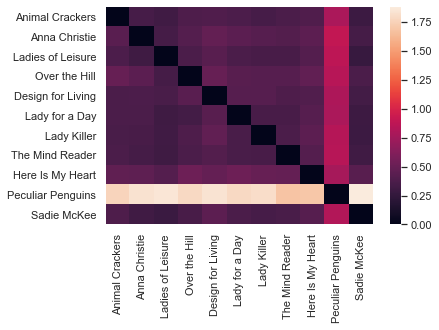

In [310]:
L = []
for p in corpora:
    l = []
    for q in corpora:
        l.append(Divergence(p,q, difference = 'KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()


To reveal more patterns, let's do a multidimensional scaling of the matrix.

/Users/hesongrun/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:419: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn("The MDS API has changed. ``fit`` now constructs an"


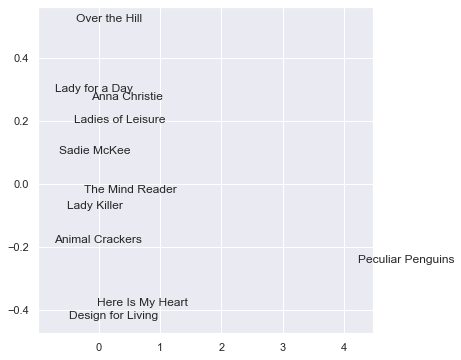

In [311]:
mds = sklearn.manifold.MDS()
pos = mds.fit(M).embedding_
x = pos[:,0]
y = pos[:,1]
fig, ax = plt.subplots(figsize = (6,6))
plt.plot(x, y, ' ')
for i, txt in enumerate(fileids):
    ax.annotate(txt, (x[i],y[i]))

A co-respondent's course and The Chain Gang are away from the others - any guesses why?

We may just want to focus on the distrbution of stopwords or non-stopwords. Let's do the analysis again first for stopwords and then for non-stopwords.

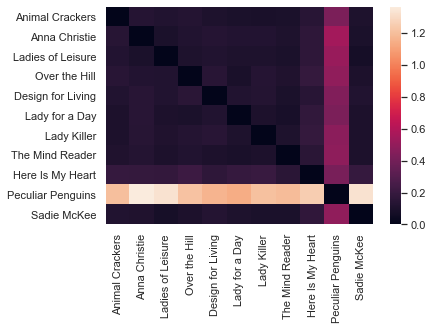

In [312]:
L = []
for p in corpora_s:
    l = []
    for q in corpora_s:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

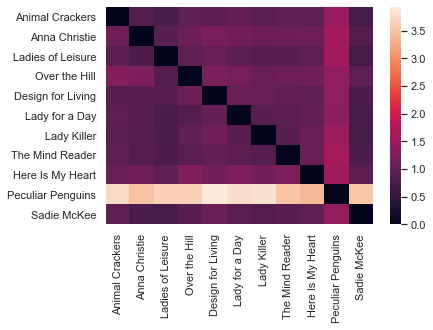

In [313]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

Now we compute the same for the assymmetric $\chi^2$ Divergence.

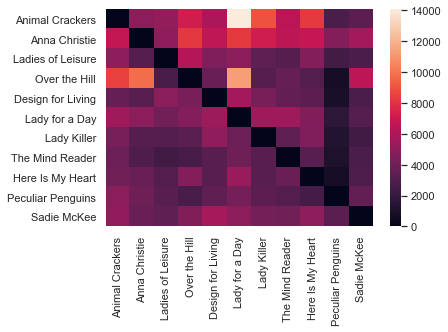

In [314]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='Chi2'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

For the KS distance:

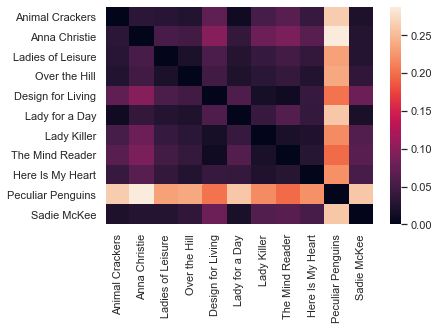

In [316]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

And finally for the Wasserstein or "earth mover's" Distance.

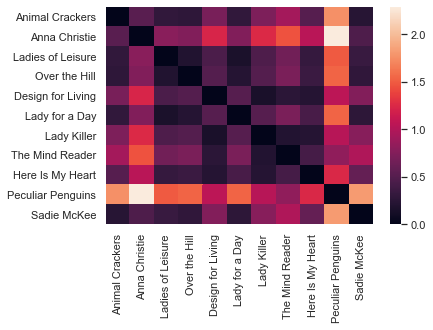

In [317]:
L = []
for p in corpora_nons:
    l = []
    for q in corpora_nons:
        l.append(Divergence(p,q, difference='Wasserstein'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids, index = fileids)
ax = sns.heatmap(div)
plt.show()

You can see that decade X is highly divergent and this makes reading the plot somewhat difficult. Let's fix this by taking the log of each cell, which will reduce the distance of decode X from other texts as an outlier.

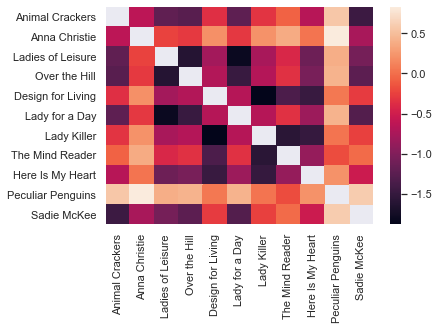

In [318]:
ax = sns.heatmap(div.apply(np.log).replace([np.inf, -np.inf], np.nan))
plt.show()

We only tried 11 movies, and from the same time period, so our signals might not be too interesting. What about different time periods?

An interesting experiment to maybe get some clearer signals: documents by decade in the Davies Corpus Of Historial American English (COHA) and see if we can detect patterns between them. 

If we want to rerun this on a new data set of our own composition, we can be a bit more efficient with our coding. Let's use the Shakespeare texts from last week as example: 

In [319]:
shakespeare_df = lucem_illud.loadTextDirectory('../data/Shakespeare')

Now we stem and remove stopwords

In [320]:
shakespeare_df['tokenized_text'] = shakespeare_df['text'].apply(lambda x: word_tokenize(x))
shakespeare_df['normalized_tokens'] = shakespeare_df['tokenized_text'].apply(lambda x: normalizeTokens(x))

Create the corpus file and generate the heatmap:

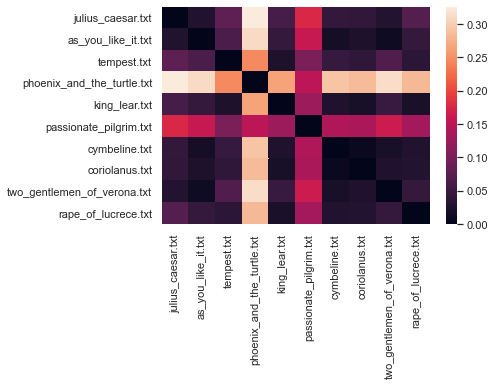

In [321]:
measure = 'KS' #"KL", "Chi2", "KS", "Wasserstein"
num_of_texts = 10 #The bigger this number the slower it will run, you can also try selecting your own plays
fileids_sp = list(shakespeare_df[:num_of_texts].index)
corpora_sp = list(shakespeare_df[:num_of_texts]['normalized_tokens'])
L = []
for p in corpora_sp:
    l = []
    for q in corpora_sp:
        l.append(Divergence(p,q, difference=measure))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = fileids_sp, index = fileids_sp)
ax = sns.heatmap(div)
plt.show()

What are "The Passionate Pilgrim" and "The Phoenix and the Turtle"? Little known poems by Shakespeare that are unsurprisingly hard to classify, as they are so different from everything else he wrote.

## <span style="color:red">*Exercise 6*</span>

<span style="color:red">Construct cells immediately below this that calculate the KL and $\chi^2$ divergences, and the KS and Wasserstein distances between four separate corpora, plot these with heatmaps, and then array them in two dimensions with multidimensional scaling as above. What does this reveal about relations between the corpora? Which analysis (and divergence or distribution) distinguishes the authors or documents better? 

<span style="color:red">**Stretch**: Calculate the <a "href=https://en.wikipedia.org/wiki/Jensen–Shannon_divergence" target="_blank">Jensen-Shannon Divergence</a> between your four corpora. What is the relationship between the KL and JS divergences?</span> 

In [322]:
# df_agg = pd.DataFrame()

In [333]:
# import glob
# lst = glob.glob('Corpus_mda/*')
# for i in lst:
#     print(i)
#     _df = pd.read_pickle(i)
#     _df['mda'] = _df['mda'].apply(lambda x: x.replace('\n\n', ' '))
#     _df['tokenized_mda'] = _df['mda'].apply(lambda x: word_tokenize(x))
#     _df['normalized_tokens'] = _df['tokenized_mda'].apply(lambda x:normalizeTokens(x))
#     df_agg = df_agg.append(_df)

Corpus_mda/tsla_mda.pkl
Corpus_mda/googl_mda.pkl
Corpus_mda/fb_mda.pkl
Corpus_mda/msft_mda.pkl
Corpus_mda/gm_mda.pkl
Corpus_mda/aapl_mda.pkl


In [335]:
# df_agg.to_pickle('Corpus_mda/agg.pkl')

In [336]:
df_agg = pd.read_pickle('Corpus_mda/agg.pkl')

In [343]:
df_agg = df_agg[['company', 'normalized_tokens']].groupby('company').sum().reset_index()

In [345]:
cor_edgar = df_agg['normalized_tokens'].tolist()
cols = df_agg['company'].tolist()

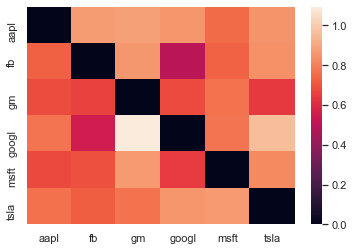

In [346]:
#KL
L = []
for p in cor_edgar:
    l = []
    for q in cor_edgar:
        l.append(Divergence(p,q, difference='KL'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = cols, index = cols)
ax = sns.heatmap(div)
plt.show()

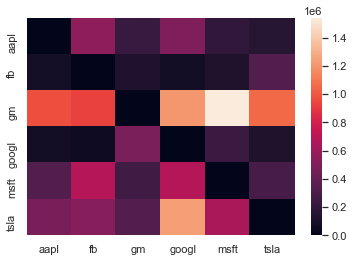

In [347]:
#Chi_2
L = []
for p in cor_edgar:
    l = []
    for q in cor_edgar:
        l.append(Divergence(p,q, difference='Chi2'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = cols, index = cols)
ax = sns.heatmap(div)
plt.show()

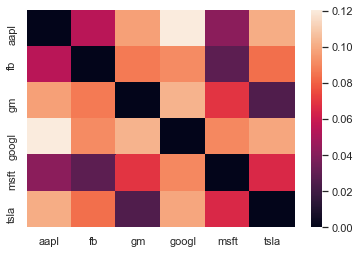

In [349]:
#KS
L = []
for p in cor_edgar:
    l = []
    for q in cor_edgar:
        l.append(Divergence(p,q, difference='KS'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = cols, index = cols)
ax = sns.heatmap(div)
plt.show()

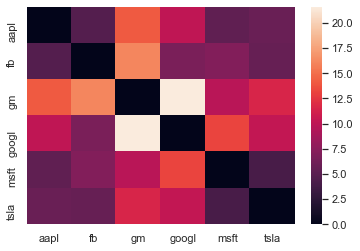

In [350]:
#Wasserstein
L = []
for p in cor_edgar:
    l = []
    for q in cor_edgar:
        l.append(Divergence(p,q, difference='Wasserstein'))
    L.append(l)
M = np.array(L)
fig = plt.figure()
div = pandas.DataFrame(M, columns = cols, index = cols)
ax = sns.heatmap(div)
plt.show()

From the comparisons above, we can clearly see that the technology companies are more close to each other. They are far from general motors. Interesting though, Tesla looks more similar to the 4 tech-companies than general motors. This can be confirmed by all of our metrics.